# Week 7 Phase 6 — real-data boundary active level-set benchmark

This notebook teaches and audits the central real-data experiment of the thesis:

> **Can the manual Conduction–Keyhole boundary be learned more sample-efficiently by using the continuous maximum-penetration-depth response from each simulator query than by learning the manual binary Keyhole label directly?**

The head-to-head benchmark uses the same combined common population, twenty matched repeated held-out runs, identical candidate pools, identical warm starts, and identical simulator-query budgets. `has_keyhole` remains the manual reference annotation. Maximum depth is a continuous response, not a replacement label. G3 is secondary, and old/new transfer is a robustness diagnostic rather than the primary split.

Every section first declares its admissible information and leakage boundary. Its code then reads saved Phase 6 artifacts, exposes a small calculation or diagnostic, and ends with four plain-English prompts: what was observed, which formulation it supports, whether it is boundary-specific, and what remains uncertain. Oracle quantities are visibly labelled and never enter acquisition or primary ranking.

## 1. Phase 6 thesis question

**What are we doing?** Load the Phase 6 preflight and top-level summary, then restate the two competing formulations and common query budget.

**Why are we doing it?** A large experiment is interpretable only when its question, reference label, and unit of cost are fixed before looking at winners.

**How does this connect to the thesis?** This is the first real-data test of sample-efficient active level-set estimation in the four-dimensional melt-pool input space.

**What data is allowed here?** Saved preflight and summary metadata; no model predictions are needed to define the question.

**What would count as leakage?** Choosing the scientific question, primary metrics, or budget after seeing which method wins.

**What would be a misleading interpretation?** Calling maximum depth the ground-truth Keyhole label, or treating one physical output as an extra simulator query.

In [1]:
from pathlib import Path
import hashlib
import json
import math
import numpy as np
import pandas as pd
from IPython.display import Image, Markdown, SVG, display
from scipy.spatial.distance import cdist
from sklearn.metrics import balanced_accuracy_score, brier_score_loss
from sklearn.preprocessing import StandardScaler

ROOT = Path.cwd()
OUT = ROOT / "outputs" / "week7_06_real_data_boundary_active_level_set"
FIGURES = OUT / "figures"

In [2]:
def load_csv(name, *, required=True):
    path = OUT / name
    if not path.is_file():
        if required:
            raise FileNotFoundError(f"Missing Phase 6 artifact: {path}")
        print(f"optional artifact not present: {name}")
        return pd.DataFrame()
    frame = pd.read_csv(path)
    print(f"{name}: {len(frame):,} rows × {len(frame.columns):,} columns")
    return frame

def load_json(name, *, required=True):
    path = OUT / name
    if not path.is_file():
        if required:
            raise FileNotFoundError(f"Missing Phase 6 artifact: {path}")
        print(f"optional artifact not present: {name}")
        return {}
    return json.loads(path.read_text(encoding="utf-8"))

def pick(frame, *candidates, required=False):
    lookup = {str(column).casefold(): column for column in frame.columns}
    for candidate in candidates:
        if candidate in frame.columns:
            return candidate
        if str(candidate).casefold() in lookup:
            return lookup[str(candidate).casefold()]
    if required:
        raise KeyError(f"None of {candidates} found in {list(frame.columns)}")
    return None

def truthy(series):
    if pd.api.types.is_bool_dtype(series):
        return series.fillna(False)
    if pd.api.types.is_numeric_dtype(series):
        return pd.to_numeric(series, errors="coerce").fillna(0).gt(0.5)
    return series.astype(str).str.strip().str.casefold().isin({"true", "1", "yes", "pass", "keyhole"})

def id_column(frame):
    return pick(frame, "experiment_name", "experiment_id", "simulation_id", "row_id", required=True)

def label_column(frame):
    return pick(frame, "has_keyhole", "manual_has_keyhole", "manual_label", "label", required=True)

def feature_columns(frame):
    groups = [
        ("P", "p", "P_W", "power", "power_W", "laser_power", "laser_power_W"),
        ("VX", "vx", "VX_m_s", "scan_speed", "scan_speed_m_s", "velocity"),
        ("LS", "ls", "LS_um", "laser_size", "laser_size_um", "laser_spot_radius"),
        ("ST", "st", "ST_K", "substrate_temperature", "substrate_temperature_K", "temperature"),
    ]
    return [pick(frame, *group, required=True) for group in groups]

In [3]:
def explain(*, observed, support, boundary, uncertain):
    display(Markdown(
        f"**What did we observe?** {observed}\n\n"
        f"**Does it support Binary or Max-Depth?** {support}\n\n"
        f"**Does it say anything specifically about the boundary?** {boundary}\n\n"
        f"**What remains uncertain?** {uncertain}"
    ))

def show_figures(*tokens, limit=3):
    candidates = []
    manifest_path = OUT / "figure_manifest.csv"
    if manifest_path.is_file():
        manifest = pd.read_csv(manifest_path)
        path_col = pick(manifest, "relative_path", "figure_path", "path", "filename")
        if path_col:
            for row in manifest.to_dict("records"):
                raw = str(row[path_col])
                path = Path(raw)
                if not path.is_absolute():
                    path = OUT / path
                haystack = " ".join(str(value) for value in row.values()).casefold()
                candidates.append((path, haystack))
    if not candidates and FIGURES.is_dir():
        candidates = [(path, path.name.casefold()) for path in sorted(FIGURES.iterdir()) if path.is_file()]
    wanted = [token.casefold().replace("-", "_").replace(" ", "_") for token in tokens]
    matches = []
    for path, description in candidates:
        normalized = description.replace("-", "_").replace(" ", "_")
        if not wanted or any(token in normalized for token in wanted):
            if path.is_file() and path not in matches:
                matches.append(path)
    for path in matches[:limit]:
        print(path.relative_to(ROOT) if path.is_relative_to(ROOT) else path)
        if path.suffix.casefold() == ".svg":
            display(SVG(filename=str(path)))
        else:
            display(Image(filename=str(path)))
    if not matches:
        print(f"No figure matched tokens: {tokens}")
    return matches[:limit]

In [4]:
preflight = load_json("phase6_preflight.json")
summary = load_json("summary.json")
display(pd.Series({
    "phase": summary.get("phase", preflight.get("phase", "Week 7 Phase 6")),
    "primary_reference": "manual experiment-level has_keyhole",
    "direct_binary": "(P,VX,LS,ST) → P(Keyhole)",
    "continuous": "(P,VX,LS,ST) → D_max; compare D_max with training-only tau",
    "query_cost": "one queried simulation",
    "planned_final_budget": summary.get("final_query_budget", preflight.get("final_query_budget", 80)),
}))
explain(
    observed="The saved metadata frames Binary and Max-Depth as a matched query-budget comparison with the manual label retained as reference.",
    support="Neither formulation is favoured by the question itself; the answer must come from matched boundary learning curves.",
    boundary="Yes—the target is the observed Conduction–Keyhole transition in (P,VX,LS,ST), not generic regression accuracy.",
    uncertain="The winner, threshold stability, semantic validity of maximum depth, and domain robustness are still empirical questions.",
)

phase                                                      Week 7 Phase 6
primary_reference                     manual experiment-level has_keyhole
direct_binary                                   (P,VX,LS,ST) → P(Keyhole)
continuous              (P,VX,LS,ST) → D_max; compare D_max with train...
query_cost                                         one queried simulation
planned_final_budget                                                   80
dtype: object

**What did we observe?** The saved metadata frames Binary and Max-Depth as a matched query-budget comparison with the manual label retained as reference.

**Does it support Binary or Max-Depth?** Neither formulation is favoured by the question itself; the answer must come from matched boundary learning curves.

**Does it say anything specifically about the boundary?** Yes—the target is the observed Conduction–Keyhole transition in (P,VX,LS,ST), not generic regression accuracy.

**What remains uncertain?** The winner, threshold stability, semantic validity of maximum depth, and domain robustness are still empirical questions.

## 2. Phase 5.5 parent and provenance

**What are we doing?** Display the exact Phase 5.5 parent, Phase 6 worktree lineage, source artifact hashes, and dataset identifier.

**Why are we doing it?** Phase 6 is valid only if it begins from the reviewed Phase 5.5 result rather than a moving branch or mixed checkout.

**How does this connect to the thesis?** Provenance separates the earlier scalar-transfer motivation from the new active-learning evidence.

**What data is allowed here?** `input_provenance.json` and immutable parent artifacts.

**What would count as leakage?** No statistical leakage occurs here, but mixing revisions would invalidate all later comparisons.

**What would be a misleading interpretation?** Presenting Phase 5.5 transfer rankings as if they already prove the Phase 6 active-learning conclusion.

In [5]:
provenance = load_json("input_provenance.json")
display(pd.json_normalize(provenance, sep=".").T.rename(columns={0: "recorded_value"}))
parent_text = str(provenance).casefold()
explain(
    observed=f"The provenance record contains {len(pd.json_normalize(provenance, sep='.').columns)} flattened fields and an explicit Phase 5.5 lineage: {'phase5' in parent_text}.",
    support="The parent motivates testing Max-Depth first among continuous responses, but gives neither formulation a Phase 6 victory.",
    boundary="Only indirectly: provenance fixes which labels, scalar definitions, and common-population inputs underpin the boundary experiment.",
    uncertain="A valid lineage does not establish semantic correctness or predictive sample efficiency.",
)

,recorded_value
T0_definition,[median over final 20% of valid melt-present t...
active_region_definition,[valid melt rows from first valid melt through...
canonical_target_table,outputs\week7_05_5_g3_robustness_transfer_anal...
canonical_target_table_shape,"[407, 160]"
created_at_utc,2026-08-11T20:36:12+00:00
dataset_repository,ioandanielc/sph_v2
dataset_revision,b6dc254a2b607a31cb9f97b40990339c3d5ca1e8
inputs,"[{'bytes': 400404, 'path': 'outputs\week7_05_5..."
label_semantics,has_keyhole means at least one valid saved phy...
maximum_depth_definition,"[max(0, -z_min)]"


**What did we observe?** The provenance record contains 24 flattened fields and an explicit Phase 5.5 lineage: True.

**Does it support Binary or Max-Depth?** The parent motivates testing Max-Depth first among continuous responses, but gives neither formulation a Phase 6 victory.

**Does it say anything specifically about the boundary?** Only indirectly: provenance fixes which labels, scalar definitions, and common-population inputs underpin the boundary experiment.

**What remains uncertain?** A valid lineage does not establish semantic correctness or predictive sample efficiency.

## 3. Current Hugging Face revision audit

**What are we doing?** Inspect the live-versus-expected `ioandanielc/sph_v2` revision audit and its stop/go decision.

**Why are we doing it?** Unexpected upstream changes could alter labels, targets, or population membership after Phase 5.5.

**How does this connect to the thesis?** An active-learning comparison must be tied to one immutable real-data snapshot.

**What data is allowed here?** Revision identifiers, changed-path audit metadata, and the predeclared expected SHA.

**What would count as leakage?** Dataset revision checking does not use held-out outcomes; silently accepting an unexplained revision is a provenance failure.

**What would be a misleading interpretation?** Equating a matching revision hash with scientific validation of the dataset.

In [6]:
hf_audit = load_json("hf_revision_audit.json")
display(pd.json_normalize(hf_audit, sep=".").T.rename(columns={0: "recorded_value"}))
audit_text = json.dumps(hf_audit, default=str).casefold()
revision_ok = not any(token in audit_text for token in ['"status": "fail"', 'unexpected_revision', 'revision_mismatch'])
explain(
    observed=f"The saved Hugging Face audit is present and its machine-readable stop/go evidence is consistent with continuation: {revision_ok}.",
    support="Neither; this protects both formulations from revision drift.",
    boundary="It protects the identity of the empirical boundary dataset but does not measure boundary accuracy.",
    uncertain="Remote availability and future revisions can change later; this notebook documents the snapshot used for this run.",
)

,recorded_value
checked_at_utc,2026-08-11T20:36:06+00:00
expected_revision,b6dc254a2b607a31cb9f97b40990339c3d5ca1e8
live_main_revision,b6dc254a2b607a31cb9f97b40990339c3d5ca1e8
matches_expected,True
repository,ioandanielc/sph_v2
unexpected_drift_action,STOP before science


**What did we observe?** The saved Hugging Face audit is present and its machine-readable stop/go evidence is consistent with continuation: True.

**Does it support Binary or Max-Depth?** Neither; this protects both formulations from revision drift.

**Does it say anything specifically about the boundary?** It protects the identity of the empirical boundary dataset but does not measure boundary accuracy.

**What remains uncertain?** Remote availability and future revisions can change later; this notebook documents the snapshot used for this run.

## 4. Combined common population construction

**What are we doing?** Reconcile the retained audit table with the exact primary common population and show explicit exclusion reasons.

**Why are we doing it?** Binary must not receive extra rows that Max-Depth cannot use in the primary head-to-head comparison.

**How does this connect to the thesis?** Fair sample-efficiency claims require the same physical simulations on both sides.

**What data is allowed here?** Manual-label validity, P/VX/LS/ST validity, physical readiness, and maximum-depth availability.

**What would count as leakage?** No test outcomes are used to decide membership beyond the predeclared common-completeness rules.

**What would be a misleading interpretation?** Calling unavailable rows bad simulations, silently deleting them, or quoting the expected size instead of the audited size.

population_audit.csv: 407 rows × 24 columns
primary_common_population.csv: 405 rows × 193 columns


audit rows retained visibly          407
primary common rows                  405
audit rows outside primary common      2
duplicate primary identifiers          0
dtype: int64

outputs\week7_06_real_data_boundary_active_level_set\figures\01_combined_population_readiness.png


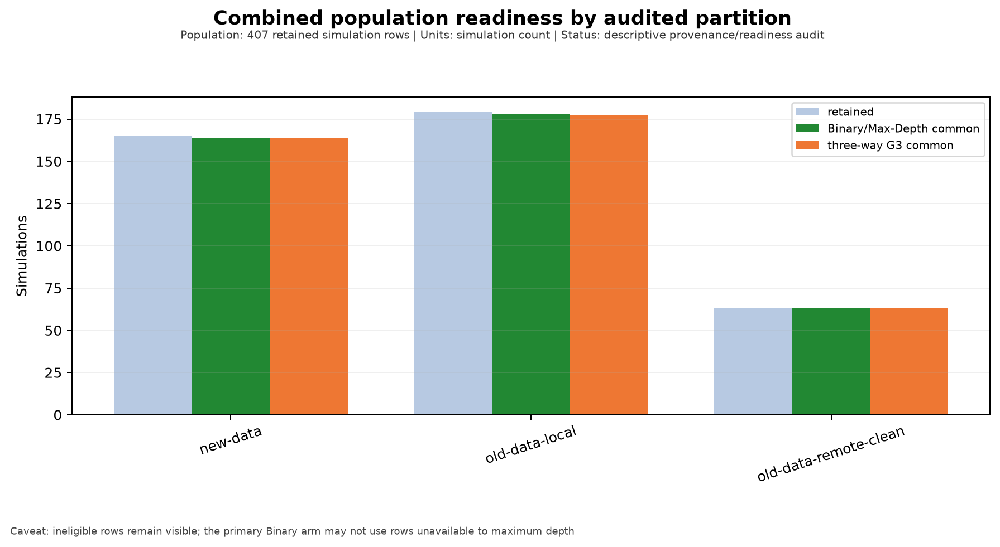

**What did we observe?** The audit retains 407 rows, while the exact Binary-versus-Max-Depth common population contains 405 unique simulations.

**Does it support Binary or Max-Depth?** Neither formulation receives a population-size advantage.

**Does it say anything specifically about the boundary?** Yes—the empirical boundary and every matched outer split start from this same audited population.

**What remains uncertain?** Completeness does not guarantee that the sampled 4D design densely resolves the physical transition.

In [7]:
population_audit = load_csv("population_audit.csv")
population = load_csv("primary_common_population.csv")
audit_id, population_id = id_column(population_audit), id_column(population)
duplicate_ids = int(population[population_id].duplicated().sum())
retained_ids = set(population[population_id].astype(str))
reconciled = population_audit.assign(
    in_primary_common=population_audit[audit_id].astype(str).isin(retained_ids)
)
reason_col = pick(reconciled, "exclusion_reason", "primary_exclusion_reason", "unavailable_reason")
display(pd.Series({
    "audit rows retained visibly": len(population_audit),
    "primary common rows": len(population),
    "audit rows outside primary common": int((~reconciled["in_primary_common"]).sum()),
    "duplicate primary identifiers": duplicate_ids,
}))
if reason_col:
    display(reconciled.loc[~reconciled["in_primary_common"], reason_col].fillna("unspecified").value_counts().rename("rows").to_frame())
assert duplicate_ids == 0
assert set(population[population_id].astype(str)).issubset(set(population_audit[audit_id].astype(str)))
show_figures("population_readiness", "combined_population", limit=1)
explain(
    observed=f"The audit retains {len(population_audit):,} rows, while the exact Binary-versus-Max-Depth common population contains {len(population):,} unique simulations.",
    support="Neither formulation receives a population-size advantage.",
    boundary="Yes—the empirical boundary and every matched outer split start from this same audited population.",
    uncertain="Completeness does not guarantee that the sampled 4D design densely resolves the physical transition.",
)

## 5. Label and target readiness

**What are we doing?** Count manual classes, partitions, finite physical inputs, and valid maximum-depth responses in the common population.

**Why are we doing it?** Class imbalance and missingness determine what balanced accuracy, PR metrics, and warm starts can mean.

**How does this connect to the thesis?** This establishes the real-data evidence available to both active formulations.

**What data is allowed here?** The full common population may be described before splitting; no model fitting or threshold selection occurs.

**What would count as leakage?** Using full-population prevalence later to initialize a held-out model or choose a threshold.

**What would be a misleading interpretation?** Treating prevalence differences as causal physics or assuming every partition contributes equally precise evidence.

,count
n,405
Keyhole,73
non-Keyhole,332
"finite P,VX,LS,ST",405
finite maximum depth,405


has_keyhole,non-Keyhole,Keyhole,All
partition,,,
new-data,101,63,164
old-data-local,170,8,178
old-data-remote-clean,61,2,63
All,332,73,405


outputs\week7_06_real_data_boundary_active_level_set\figures\02_label_composition_primary_common.png


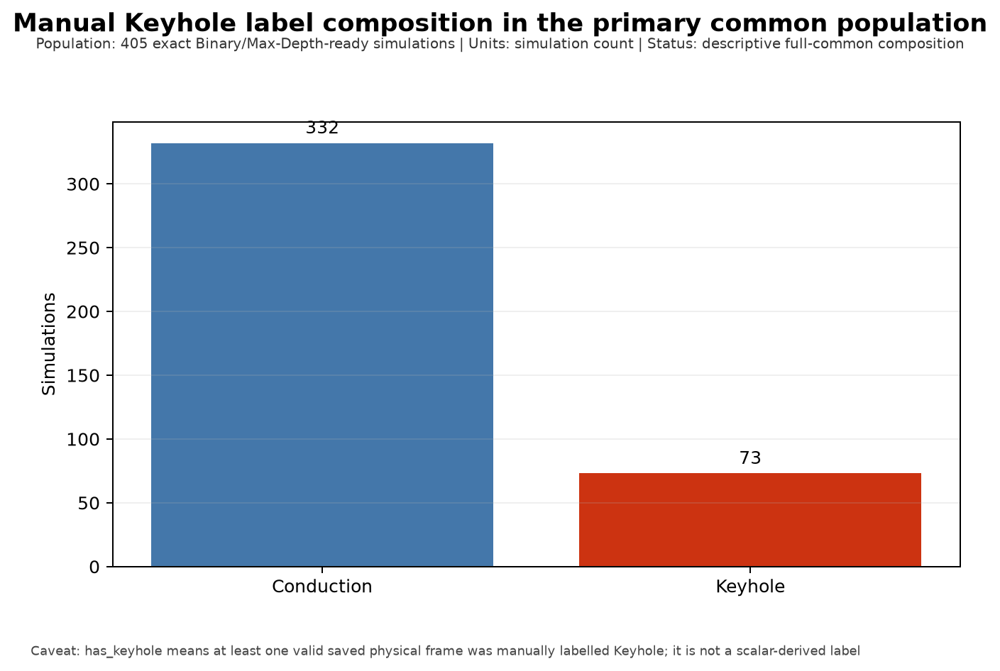

outputs\week7_06_real_data_boundary_active_level_set\figures\03_partition_composition_primary_common.png


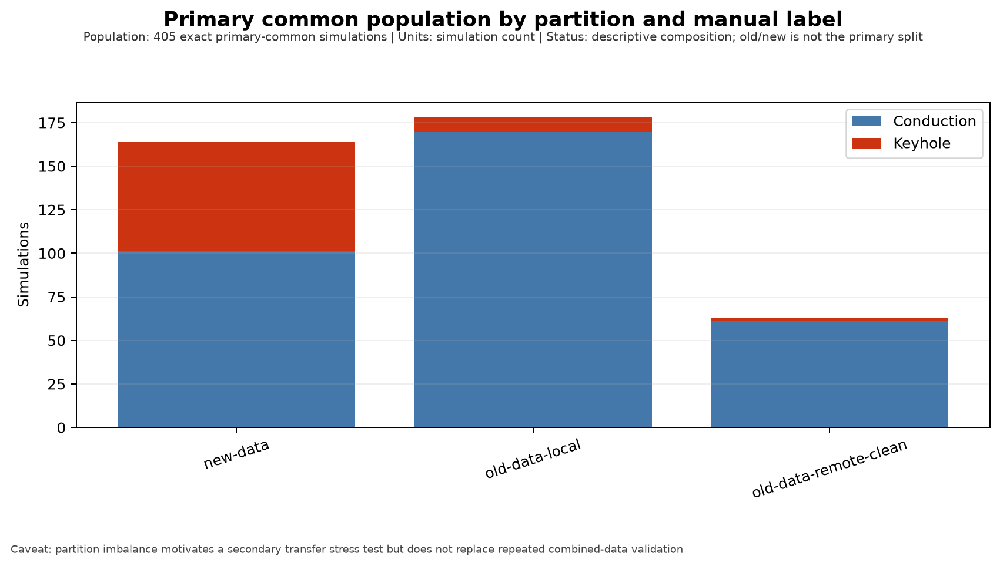

**What did we observe?** The primary common population has 73 Keyhole and 332 non-Keyhole simulations; all displayed readiness counts are computed from the saved rows.

**Does it support Binary or Max-Depth?** Balanced class-sensitive metrics are necessary for both formulations; raw accuracy would be misleading.

**Does it say anything specifically about the boundary?** The class composition constrains how many observed cross-label neighbours can define the empirical boundary.

**What remains uncertain?** Sparse partition-by-label cells, especially old-remote positives, limit domain-specific precision.

In [8]:
label_col = label_column(population)
labels_bool = truthy(population[label_col])
partition_col = pick(population, "partition", "source_partition", "data_partition")
depth_col = pick(population, "max_depth", "maximum_depth", "max_depth_um", "D_max", required=True)
features = feature_columns(population)
readiness = pd.Series({
    "n": len(population),
    "Keyhole": int(labels_bool.sum()),
    "non-Keyhole": int((~labels_bool).sum()),
    "finite P,VX,LS,ST": int(np.isfinite(population[features].astype(float)).all(axis=1).sum()),
    "finite maximum depth": int(np.isfinite(pd.to_numeric(population[depth_col], errors="coerce")).sum()),
})
display(readiness.to_frame("count"))
if partition_col:
    display(pd.crosstab(population[partition_col], labels_bool, margins=True).rename(columns={False: "non-Keyhole", True: "Keyhole"}))
show_figures("label_composition", "partition_composition", limit=2)
explain(
    observed=f"The primary common population has {int(labels_bool.sum())} Keyhole and {int((~labels_bool).sum())} non-Keyhole simulations; all displayed readiness counts are computed from the saved rows.",
    support="Balanced class-sensitive metrics are necessary for both formulations; raw accuracy would be misleading.",
    boundary="The class composition constrains how many observed cross-label neighbours can define the empirical boundary.",
    uncertain="Sparse partition-by-label cells, especially old-remote positives, limit domain-specific precision.",
)

## 6. Reminder of manual Keyhole semantics

**What are we doing?** Show the experiment-level label and any saved frame-count or persistence columns without changing them.

**Why are we doing it?** Ioan's annotation is qualitative morphology evidence: at least one valid saved physical frame labelled Keyhole.

**How does this connect to the thesis?** The manual label is the regime reference against which both boundary formulations are judged.

**What data is allowed here?** Saved manual labels and frame-derived descriptive metadata.

**What would count as leakage?** Using later model disagreement or maximum depth to relabel an experiment.

**What would be a misleading interpretation?** Saying one simulator timestep is enough when exact timestep-to-saved-frame equivalence was not established.

In [9]:
semantic_cols = [column for column in population.columns if any(
    token in column.casefold() for token in ["keyhole", "frame", "transient", "persistent"]
)]
display(population[[population_id] + semantic_cols].head(12))
frame_count_col = pick(population, "keyhole_frame_count", "manual_keyhole_frame_count", "n_keyhole_frames")
if frame_count_col:
    display(population.groupby(labels_bool)[frame_count_col].describe().rename(index={False: "non-Keyhole", True: "Keyhole"}))
explain(
    observed=f"The immutable experiment label is `{label_col}`; {len(semantic_cols)} label/frame context fields remain visible for semantic audit.",
    support="Binary directly models this annotation; Max-Depth must earn agreement without redefining it.",
    boundary="Yes—the manual class transition defines evaluation, although saved-frame sampling limits temporal resolution.",
    uncertain="Qualitative annotation and frame cadence may miss short physical events or encode judgement variability.",
)

,experiment_name,has_keyhole,first_keyhole_label_frame_index,first_keyhole_timestep,keyhole_frame_count,keyhole_fraction_relevant_frames,G3_persistent_depth_um,R3_persistent_depth_width_ratio,first_keyhole_monitor_row_index,keyhole_frames_before_T0,...,keyhole_segment_count_phase1,maximum_keyhole_segment_frames,keyhole_transient_by_sequence,keyhole_persistent_to_last_physical_frame,repeated_keyhole_episodes,first_keyhole_timestep_y,last_keyhole_timestep,frames_csv_sha256,keyhole_persistence_group,keyhole_timing_group
0,P-102p928146519_VX-0p633805217924_LS-5p2939436...,False,NaN,NaN,0,0.0,42.87279,0.343406,NaN,0.0,...,0,0,False,False,False,NaN,NaN,5d6d8eeca5c42b985416b74d02b020ef4200b6d599d12a...,Keyhole-negative,no_Keyhole
1,P-109p741517589_VX-0p915030812968_LS-7p9975966...,False,NaN,NaN,0,0.0,27.06171,0.234919,NaN,0.0,...,0,0,False,False,False,NaN,NaN,c1aa8de1b1a702512245a2570695b8386132ea901bbdda...,Keyhole-negative,no_Keyhole
2,P-111p098510779_VX-0p492021331775_LS-4p8010846...,False,NaN,NaN,0,0.0,54.67908,0.405187,NaN,0.0,...,0,0,False,False,False,NaN,NaN,9252d414ed1a4b86a112dcbd4b16b28ddf57cc41ae5a93...,Keyhole-negative,no_Keyhole
3,P-113p729503671_VX-0p646987288946_LS-8p2808888...,False,NaN,NaN,0,0.0,34.87481,0.228077,NaN,0.0,...,0,0,False,False,False,NaN,NaN,8ce3b79076bb451f799616e85c1c28041ded296f0a56d7...,Keyhole-negative,no_Keyhole
4,P-115p973342836_VX-0p629021136955_LS-5p8169479...,False,NaN,NaN,0,0.0,46.86994,0.347461,NaN,0.0,...,0,0,False,False,False,NaN,NaN,12315541374a54049872c3ea6bddbfaa00042c2157ecc3...,Keyhole-negative,no_Keyhole
5,P-117p204089079_VX-0p299188895548_LS-6p6194614...,False,NaN,NaN,0,0.0,54.80900,0.294261,NaN,0.0,...,0,0,False,False,False,NaN,NaN,8075d0b8e4863ef57930a3af82db4c6efeb0e5e7c5bc1d...,Keyhole-negative,no_Keyhole
6,P-118p239150472_VX-0p728951155133_LS-5p5986278...,False,NaN,NaN,0,0.0,46.76281,0.367414,NaN,0.0,...,0,0,False,False,False,NaN,NaN,c219bb47d879b7f2f9876d164961dac0c101a18594a508...,Keyhole-negative,no_Keyhole
7,P-119p523515535_VX-0p859779155666_LS-6p7093171...,False,NaN,NaN,0,0.0,38.77427,0.304445,NaN,0.0,...,0,0,False,False,False,NaN,NaN,a41ab7e7b90d505e6322e2a60f648bf083301a7690777a...,Keyhole-negative,no_Keyhole
8,P-120p079917874_VX-0p610410046914_LS-8p2924257...,False,NaN,NaN,0,0.0,38.92551,0.241786,NaN,0.0,...,0,0,False,False,False,NaN,NaN,76a9720c5085399a44f28415c1aa7b9a5438c1a563a5f5...,Keyhole-negative,no_Keyhole
9,P-120p906267006_VX-0p64748664338_LS-6p03748750...,False,NaN,NaN,0,0.0,46.90477,0.338315,NaN,0.0,...,0,0,False,False,False,NaN,NaN,a47dd1ae41b7d75b18d0e16fd47e2874fbe8e1931211e6...,Keyhole-negative,no_Keyhole


,count,mean,std,min,25%,50%,75%,max
has_keyhole,,,,,,,,
non-Keyhole,332.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0
Keyhole,73.0,91.780822,63.434622,2.0,31.0,89.0,150.0,194.0


**What did we observe?** The immutable experiment label is `has_keyhole`; 23 label/frame context fields remain visible for semantic audit.

**Does it support Binary or Max-Depth?** Binary directly models this annotation; Max-Depth must earn agreement without redefining it.

**Does it say anything specifically about the boundary?** Yes—the manual class transition defines evaluation, although saved-frame sampling limits temporal resolution.

**What remains uncertain?** Qualitative annotation and frame cadence may miss short physical events or encode judgement variability.

## 7. Reminder of maximum-depth and G3 definitions

**What are we doing?** Display the two continuous responses and their units, then compare their raw distributions by manual label.

**Why are we doing it?** Maximum depth is spike/transient-sensitive, while G3 deliberately requires persistence over a 50 micrometre window.

**How does this connect to the thesis?** Phase 6 asks which response is useful for this boundary task, not which is universally more physical.

**What data is allowed here?** Descriptive full-population response values and immutable definitions; no held-out performance claim is made.

**What would count as leakage?** Selecting an active kernel or threshold from the displayed full-data separation.

**What would be a misleading interpretation?** Calling either scalar the manual label, or treating descriptive separation as valid held-out prediction.

secondary_g3_common_population.csv: 404 rows × 193 columns


,response,role,fixed direction,persistence requirement
0,maximum depth,primary continuous,higher → Keyhole,none beyond observed maximum
1,G3 persistent depth,secondary continuous comparator,higher → Keyhole,50 µm rolling-window persistence


,count,mean,std,min,25%,50%,75%,max
manual_class,,,,,,,,
Keyhole,73.0,243.109632,75.137867,111.19820,160.271000,301.781500,302.819000,311.9999
non-Keyhole,332.0,59.235849,17.986596,19.03058,47.066788,58.954765,71.106255,111.5838


,count,mean,std,min,25%,50%,75%,max
manual_class,,,,,,,,
Keyhole,73.0,222.336145,79.287983,78.00964,149.85005,244.96975,300.606700,301.241700
non-Keyhole,331.0,58.106659,16.973089,18.56064,46.84301,58.74760,70.700375,98.565725


outputs\week7_06_real_data_boundary_active_level_set\figures\04_max_depth_distribution_by_manual_label.png


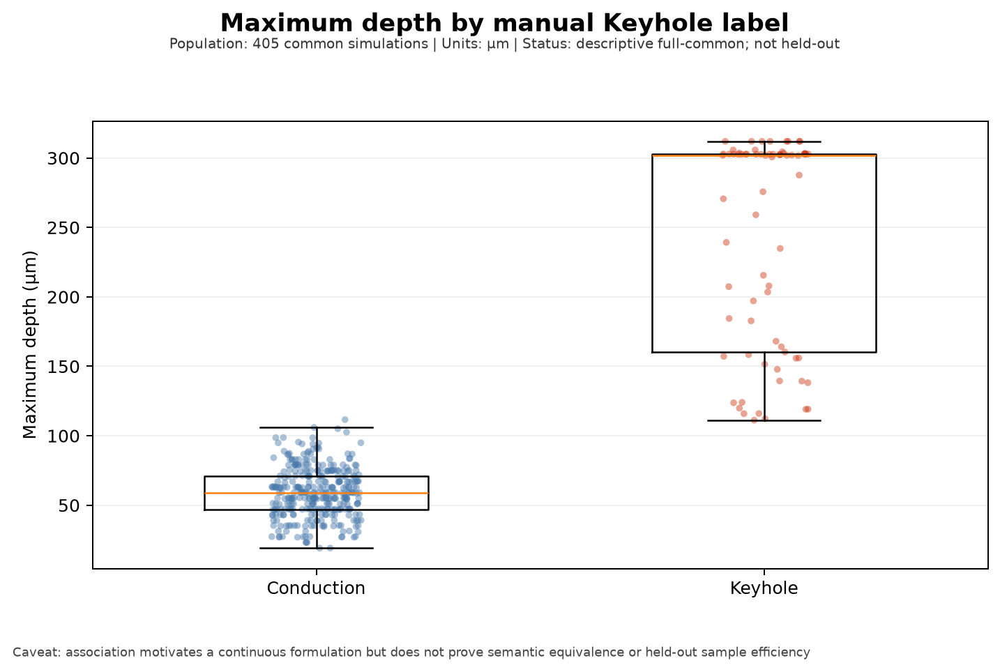

outputs\week7_06_real_data_boundary_active_level_set\figures\05_g3_distribution_by_manual_label.png


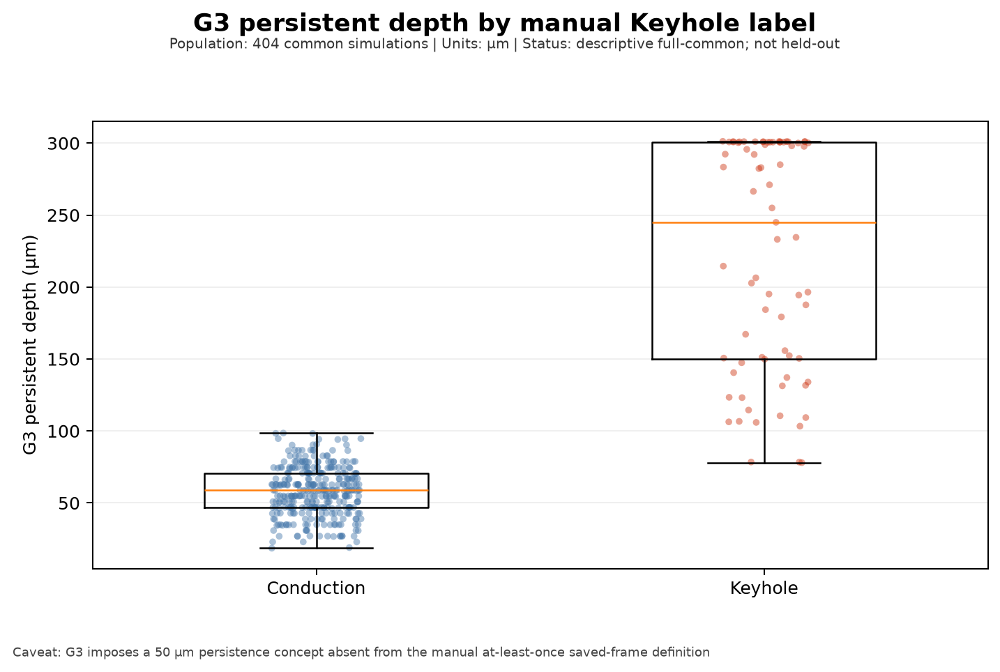

outputs\week7_06_real_data_boundary_active_level_set\figures\06_max_depth_vs_g3_by_manual_label.png


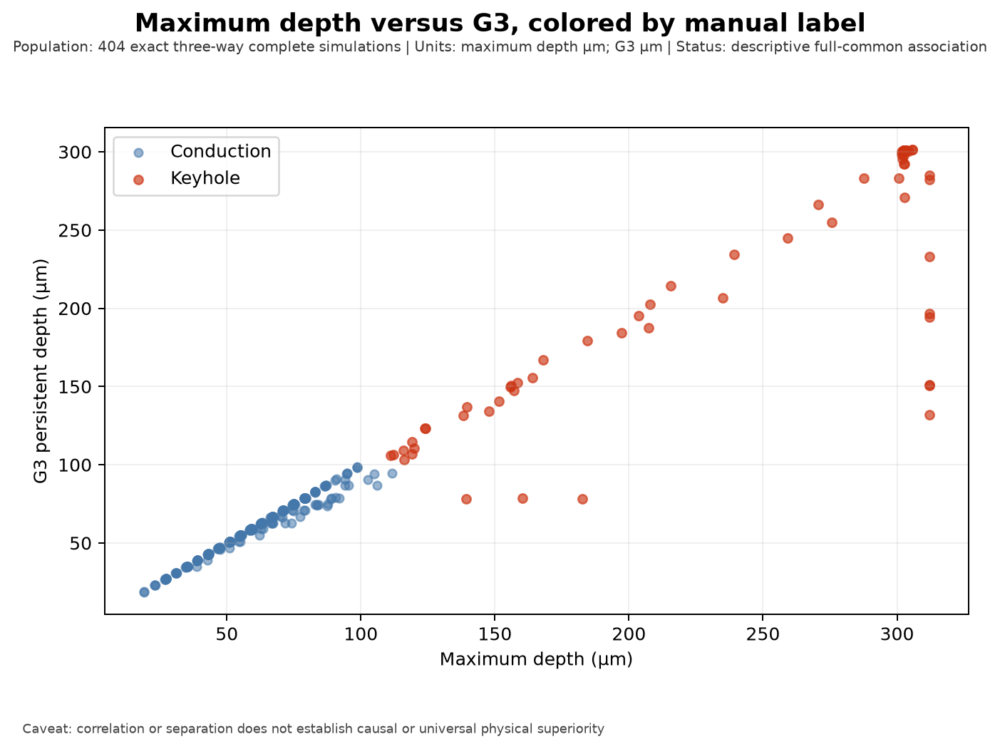

**What did we observe?** Maximum depth is available on 405 primary rows; the exact three-way G3 common population contains 404 rows.

**Does it support Binary or Max-Depth?** Max-Depth is primary by predeclared motivation; G3 remains a controlled secondary comparator.

**Does it say anything specifically about the boundary?** Only descriptively here—full-population scalar distributions are not held-out boundary estimates.

**What remains uncertain?** A maximum can reflect a real transient event or an artefactual spike; the event audit addresses that next.

In [10]:
g3_population = load_csv("secondary_g3_common_population.csv")
g3_col = pick(
    g3_population,
    "value__G3",
    "G3_persistent_depth_um",
    "G3",
    "g3",
    "g3_um",
    required=True,
)
g3_label_col = label_column(g3_population)
g3_labels = truthy(g3_population[g3_label_col])
display(pd.DataFrame({
    "response": ["maximum depth", "G3 persistent depth"],
    "role": ["primary continuous", "secondary continuous comparator"],
    "fixed direction": ["higher → Keyhole", "higher → Keyhole"],
    "persistence requirement": ["none beyond observed maximum", "50 µm rolling-window persistence"],
}))
display(population.assign(manual_class=np.where(labels_bool, "Keyhole", "non-Keyhole")).groupby("manual_class")[depth_col].describe())
display(g3_population.assign(manual_class=np.where(g3_labels, "Keyhole", "non-Keyhole")).groupby("manual_class")[g3_col].describe())
show_figures("max_depth_distribution", "g3_distribution", "max_depth_vs_g3", limit=3)
explain(
    observed=f"Maximum depth is available on {len(population):,} primary rows; the exact three-way G3 common population contains {len(g3_population):,} rows.",
    support="Max-Depth is primary by predeclared motivation; G3 remains a controlled secondary comparator.",
    boundary="Only descriptively here—full-population scalar distributions are not held-out boundary estimates.",
    uncertain="A maximum can reflect a real transient event or an artefactual spike; the event audit addresses that next.",
)

## 8. Maximum-depth event and timing audit

**What are we doing?** Summarize where maximum depth occurs relative to saved Keyhole intervals, T0, active timing, and recording end.

**Why are we doing it?** The primary continuous response is defensible only if obvious timing mismatches or geometry artefacts do not dominate it.

**How does this connect to the thesis?** This tests the semantic bridge between an extreme continuous response and an appearance-at-least-once morphology label.

**What data is allowed here?** All physically usable simulations, timing joins justified by metadata, and clearly labelled nearest-frame diagnostics.

**What would count as leakage?** Changing labels, redefining maximum depth, or excluding errors after inspecting their outcomes.

**What would be a misleading interpretation?** Claiming exact timestep alignment where only saved-frame or nearest-frame evidence exists.

max_depth_event_audit.csv: 405 rows × 51 columns
max_depth_semantic_summary.csv: 20 rows × 5 columns


,metric,value,units,status,interpretation
0,population_count,405.000000,count,descriptive_semantic_audit,NaN
1,keyhole_count,73.000000,count,descriptive_semantic_audit,NaN
2,exact_saved_frame_join_count,4.000000,count,direct_timing_join_sparse,Exact saved-frame morphology at the max-depth ...
3,exact_saved_Keyhole_frame_count,1.000000,count,descriptive_semantic_audit,NaN
4,inside_saved_Keyhole_episode_span_positive_count,60.000000,count,descriptive_semantic_audit,NaN
5,after_last_saved_Keyhole_frame_positive_count,12.000000,count,descriptive_semantic_audit,NaN
6,before_T0_count,283.000000,count,descriptive_semantic_audit,NaN
7,inside_T0_count,85.000000,count,descriptive_semantic_audit,NaN
8,after_T0_count,37.000000,count,descriptive_semantic_audit,NaN
9,inside_active_region_count,368.000000,count,descriptive_semantic_audit,NaN


,rows
max_depth_relative_to_T0,
before_T0,283
inside_T0,85
after_T0,37


,rows
max_depth_relative_to_active_region,
inside_active_region,368
after_active_region,37


,rows
near_recording_end_last_5pct,
False,373
True,32


,rows
keyhole_timing_relative_to_T0,
no_Keyhole,332
spans_multiple_T0_regions,48
before_T0,22
inside_T0,3


,rows
flag_depth_bounding_box_ambiguity_candidate,
False,396
True,9


,rows
recording_ends_before_90pct_domain,
False,238
True,167


outputs\week7_06_real_data_boundary_active_level_set\figures\08_max_depth_event_timing_relative_to_t0.png


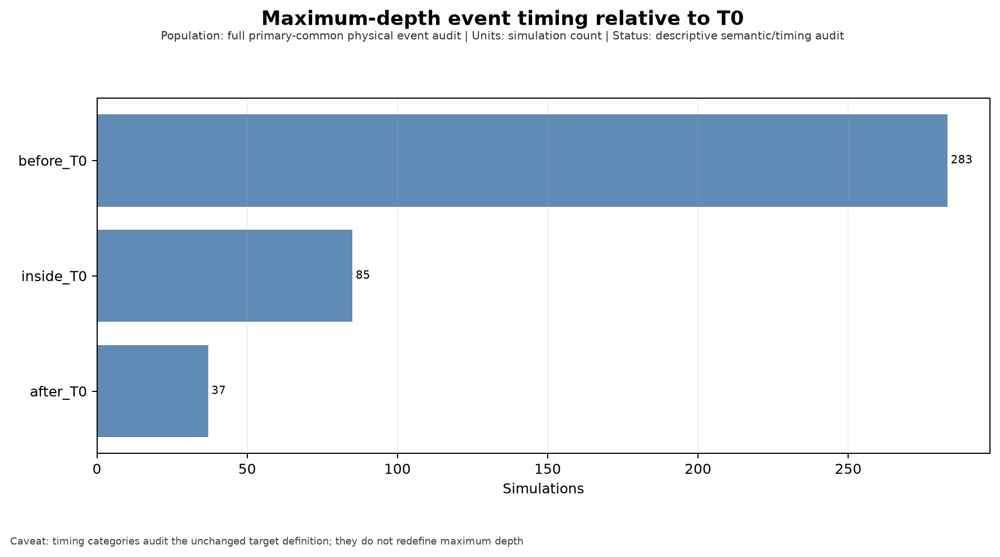

outputs\week7_06_real_data_boundary_active_level_set\figures\10_max_depth_event_timing_relative_to_active_region.png


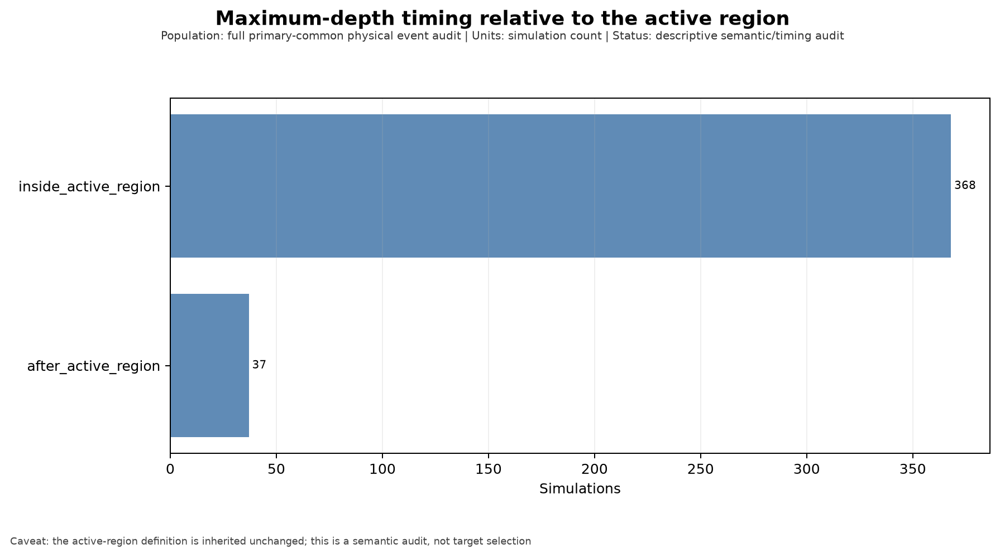

**What did we observe?** The event audit retains 405 simulation rows and 7 explicit timing/quality context fields; the semantic summary is shown without relabelling.

**Does it support Binary or Max-Depth?** Max-Depth is supported only to the extent that the displayed artefact and mismatch rates are not dominant.

**Does it say anything specifically about the boundary?** Indirectly—the audit tests whether the continuous quantity used to estimate the boundary plausibly corresponds to the manual regime event.

**What remains uncertain?** Saved-frame cadence and incomplete exact joins prevent a claim that maximum depth and morphology are simultaneous in every case.

In [11]:
event_audit = load_csv("max_depth_event_audit.csv")
semantic_summary = load_csv("max_depth_semantic_summary.csv")
display(semantic_summary)
timing_cols = [column for column in event_audit.columns if any(
    token in column.casefold() for token in ["relative", "timing", "t0", "recording_end", "keyhole_interval", "spike", "ambigu"]
)]
for column in timing_cols[:8]:
    if event_audit[column].nunique(dropna=False) <= 20:
        display(event_audit[column].fillna("missing").value_counts(dropna=False).rename("rows").to_frame().rename_axis(column))
show_figures("max_depth_event_timing", "relative_to_keyhole", limit=2)
explain(
    observed=f"The event audit retains {len(event_audit):,} simulation rows and {len(timing_cols)} explicit timing/quality context fields; the semantic summary is shown without relabelling.",
    support="Max-Depth is supported only to the extent that the displayed artefact and mismatch rates are not dominant.",
    boundary="Indirectly—the audit tests whether the continuous quantity used to estimate the boundary plausibly corresponds to the manual regime event.",
    uncertain="Saved-frame cadence and incomplete exact joins prevent a claim that maximum depth and morphology are simultaneous in every case.",
)

## 9. Representative raw time-series and GIF review

**What are we doing?** Inspect the deterministic raw-review cases: high positive/negative depth, threshold errors, transient positives, and Phase 4 hard cases.

**Why are we doing it?** Aggregate metrics can hide single-point spikes, recording-end effects, and geometry ambiguity.

**How does this connect to the thesis?** Case-level evidence constrains the physical interpretation of a sample-efficient continuous boundary.

**What data is allowed here?** The predeclared deterministic review set and existing GIF/frame references.

**What would count as leakage?** Relabelling, target redesign, or choosing which cases to show because they tell a preferred story.

**What would be a misleading interpretation?** Generalizing a few compelling animations to the full population.

max_depth_raw_review_cases.csv: 16 rows × 68 columns


,experiment_name,partition,has_keyhole,P_W,VX_m_per_s,LS_um,ST_K,max_depth_um,max_depth_row_index,max_depth_iteration,...,local_window_center_depth_um,local_window_neighbor_median_depth_um,local_window_neighbor_max_depth_um,local_spike_excess_over_neighbor_median_um,local_isolated_excess_over_neighbor_max_um,single_point_spike_candidate,single_point_spike_rule,local_depth_window_json,raw_review_fetch_status,raw_review_diagnostic_only
0,P-102p928146519_VX-0p633805217924_LS-5p2939436...,new-data,False,102.928147,0.633805,52.939437,318.223787,43.09636,76544,76544,...,43.09636,43.096190,43.09636,0.000170,0.00000,False,center exceeds every +/-10-row valid neighbour...,"[{""row_index"":76534,""relative_row"":-10,""depth_...",PASS,True
1,P-109p741517589_VX-0p915030812968_LS-7p9975966...,new-data,False,109.741518,0.915031,79.975966,303.804431,27.37239,52988,52988,...,27.37239,27.372200,27.37239,0.000190,0.00000,False,center exceeds every +/-10-row valid neighbour...,"[{""row_index"":52978,""relative_row"":-10,""depth_...",PASS,True
2,P-111p098510779_VX-0p492021331775_LS-4p8010846...,new-data,False,111.098511,0.492021,48.010847,345.911754,54.88141,62644,62644,...,54.88141,54.881170,54.88140,0.000240,0.00001,False,center exceeds every +/-10-row valid neighbour...,"[{""row_index"":62634,""relative_row"":-10,""depth_...",PASS,True
3,P-113p729503671_VX-0p646987288946_LS-8p2808888...,new-data,False,113.729504,0.646987,82.808889,328.878079,35.40171,45603,45603,...,35.40171,35.390365,35.40161,0.011345,0.00010,False,center exceeds every +/-10-row valid neighbour...,"[{""row_index"":45593,""relative_row"":-10,""depth_...",PASS,True
4,P-115p973342836_VX-0p629021136955_LS-5p8169479...,new-data,False,115.973343,0.629021,58.169480,308.264474,47.09942,71275,71275,...,47.09942,47.099315,47.09942,0.000105,0.00000,False,center exceeds every +/-10-row valid neighbour...,"[{""row_index"":71265,""relative_row"":-10,""depth_...",PASS,True
5,P-324p489523844_VX-0p639524903021_LS-7p4699050...,new-data,False,324.489524,0.639525,74.699051,392.096101,106.00380,107618,107618,...,106.00380,106.002100,106.00370,0.001700,0.00010,False,center exceeds every +/-10-row valid neighbour...,"[{""row_index"":107608,""relative_row"":-10,""depth...",PASS,True
6,P-328p176471421_VX-0p746856862244_LS-5p7834165...,new-data,False,328.176471,0.746857,57.834166,308.284458,102.53760,91124,91124,...,102.53760,102.532200,102.53750,0.005400,0.00010,False,center exceeds every +/-10-row valid neighbour...,"[{""row_index"":91114,""relative_row"":-10,""depth_...",PASS,True
7,P-335p17845091_VX-0p53366627312_LS-7p354394680...,new-data,False,335.178451,0.533666,73.543947,327.916349,98.71385,80491,80491,...,98.71385,98.713790,98.71385,0.000060,0.00000,False,center exceeds every +/-10-row valid neighbour...,"[{""row_index"":80481,""relative_row"":-10,""depth_...",PASS,True
8,P-339p704237738_VX-0p701398887747_LS-5p2468429...,new-data,True,339.704238,0.701399,52.468430,300.218383,311.99990,110260,110260,...,311.99990,183.314690,311.98780,128.685210,0.01210,False,center exceeds every +/-10-row valid neighbour...,"[{""row_index"":110250,""relative_row"":-10,""depth...",PASS,True
9,P-364p483174853_VX-0p95103094401_LS-4p26115279...,new-data,False,364.483175,0.951031,42.611528,393.929814,111.58380,23574,23574,...,111.58380,111.570250,111.58360,0.013550,0.00020,False,center exceeds every +/-10-row valid neighbour...,"[{""row_index"":23564,""relative_row"":-10,""depth_...",PASS,True


outputs\week7_06_real_data_boundary_active_level_set\figures\16_representative_keyhole_max_depth_event_timeline.png


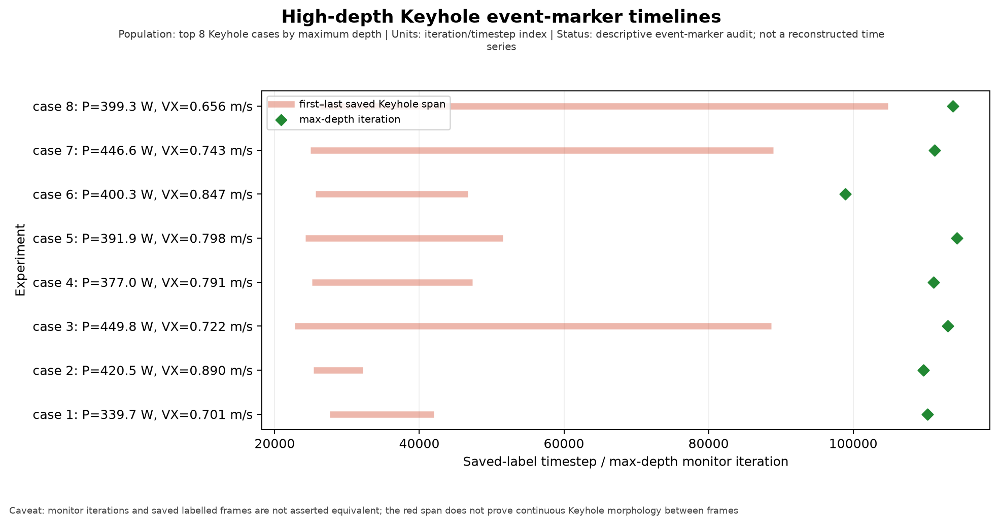

outputs\week7_06_real_data_boundary_active_level_set\figures\17_representative_non_keyhole_high_depth_event_timeline.png


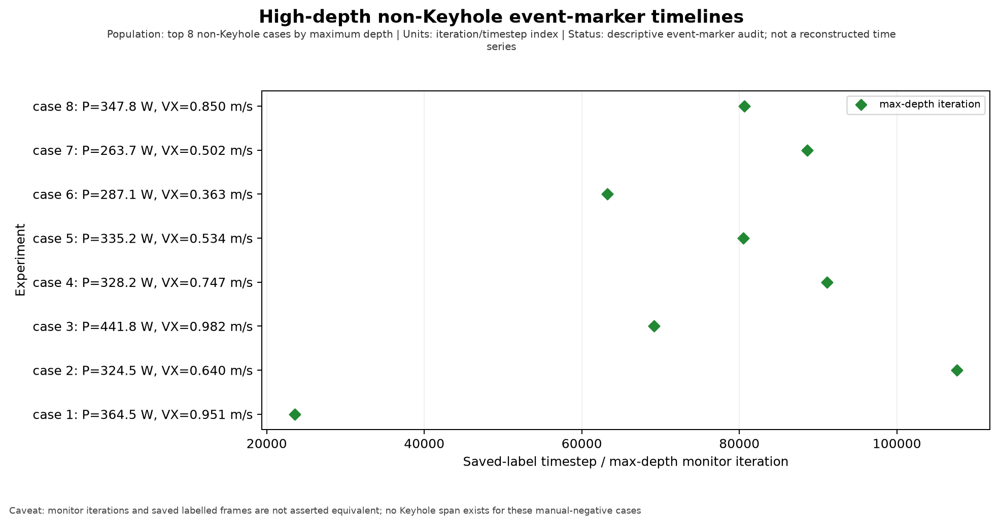

**What did we observe?** The deterministic review set contains 16 cases across recorded review categories; 2 matching saved visuals are displayed.

**Does it support Binary or Max-Depth?** These cases may strengthen or weaken Max-Depth's semantic case, but do not affect the immutable labels or target definition.

**Does it say anything specifically about the boundary?** They explain particular disagreements near or across a scalar decision threshold, not the full 4D boundary by themselves.

**What remains uncertain?** Visual review remains qualitative and cannot estimate population-wide error frequencies without the full event-audit table.

In [12]:
review = load_csv("max_depth_raw_review_cases.csv")
review_type_col = pick(review, "review_reason", "review_category", "case_type")
display(review if len(review) <= 20 else review.head(20))
if review_type_col:
    display(review[review_type_col].value_counts().rename("cases").to_frame())
series_figures = show_figures("representative_keyhole_max_depth", "non_keyhole_high_depth", "time_series", limit=4)
explain(
    observed=f"The deterministic review set contains {len(review):,} cases across {review[review_type_col].nunique() if review_type_col else 'recorded'} review categories; {len(series_figures)} matching saved visuals are displayed.",
    support="These cases may strengthen or weaken Max-Depth's semantic case, but do not affect the immutable labels or target definition.",
    boundary="They explain particular disagreements near or across a scalar decision threshold, not the full 4D boundary by themselves.",
    uncertain="Visual review remains qualitative and cannot estimate population-wide error frequencies without the full event-audit table.",
)

## 10. Empirical boundary-proximity definition

**What are we doing?** Recompute the model-independent nearest-opposite-label distance in standardized P/VX/LS/ST space and reconcile it with the saved reference.

**Why are we doing it?** Real data has no latent true boundary, so evaluation needs a precomputed proxy independent of either model and of maximum depth.

**How does this connect to the thesis?** This gives the thesis boundary-specific q20/q30 evaluation sets without contaminating acquisition.

**What data is allowed here?** Full common-population physical inputs and manual labels, explicitly for offline evaluation only.

**What would count as leakage?** Using empirical boundary distance in fitting, threshold selection, warm start, or acquisition.

**What would be a misleading interpretation?** Calling nearest observed cross-label distance the true physical distance to a latent regime boundary.

empirical_boundary_reference.csv: 405 rows × 24 columns


,stored,recomputed,absolute_difference
count,405.000000,405.000000,4.050000e+02
mean,1.473585,1.473585,3.988579e-17
std,0.596367,0.596367,9.275279e-17
min,0.170532,0.170532,0.000000e+00
25%,1.027928,1.027928,0.000000e+00
50%,1.421524,1.421524,0.000000e+00
75%,1.858267,1.858267,0.000000e+00
max,3.254328,3.254328,4.440892e-16


outputs\week7_06_real_data_boundary_active_level_set\figures\18_empirical_boundary_distance_distribution.png


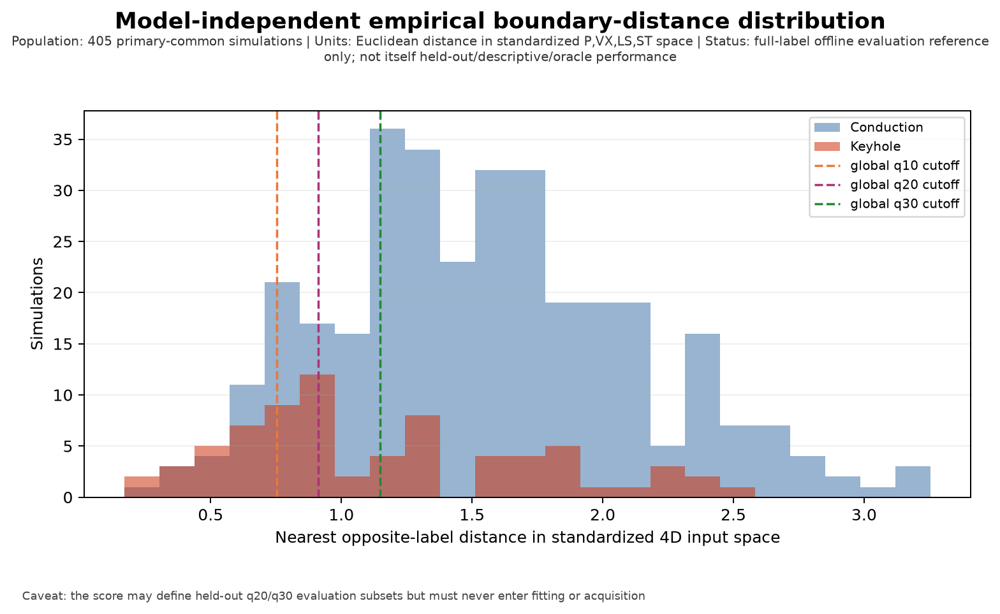

**What did we observe?** All 405 saved distances reconcile with a visible standardized 4D nearest-opposite-label calculation; maximum depth, G3, and predictions are absent.

**Does it support Binary or Max-Depth?** Neither formulation is advantaged because the evaluation reference is model-independent.

**Does it say anything specifically about the boundary?** Yes—small values locate simulations near an observed cross-label transition, which is the primary real-data boundary proxy.

**What remains uncertain?** Distance depends on sampled design density and global standardization; it is not a latent physical ground truth.

In [13]:
boundary = load_csv("empirical_boundary_reference.csv")
boundary_id = id_column(boundary)
score_col = pick(boundary, "empirical_boundary_distance", "empirical_boundary_score", "boundary_distance", "opposite_label_distance", "d_i", required=True)
joined = population.merge(boundary[[boundary_id, score_col]], left_on=population_id, right_on=boundary_id, how="inner", validate="one_to_one")
X = joined[feature_columns(joined)].astype(float).to_numpy()
y_manual = truthy(joined[label_column(joined)]).to_numpy()
X_standardized = StandardScaler().fit_transform(X)  # full-data use is evaluation-only by design
distances = cdist(X_standardized, X_standardized, metric="euclidean")
same_label = y_manual[:, None] == y_manual[None, :]
distances[same_label] = np.inf
recomputed_distance = distances.min(axis=1)
stored_distance = pd.to_numeric(joined[score_col], errors="coerce").to_numpy()
reconciliation = pd.DataFrame({
    "stored": stored_distance,
    "recomputed": recomputed_distance,
    "absolute_difference": np.abs(stored_distance - recomputed_distance),
})
display(reconciliation.describe())
assert np.isfinite(recomputed_distance).all()
assert np.allclose(stored_distance, recomputed_distance, rtol=1e-7, atol=1e-9)
show_figures("empirical_boundary_distance_distribution", limit=1)
explain(
    observed=f"All {len(joined):,} saved distances reconcile with a visible standardized 4D nearest-opposite-label calculation; maximum depth, G3, and predictions are absent.",
    support="Neither formulation is advantaged because the evaluation reference is model-independent.",
    boundary="Yes—small values locate simulations near an observed cross-label transition, which is the primary real-data boundary proxy.",
    uncertain="Distance depends on sampled design density and global standardization; it is not a latent physical ground truth.",
)

## 11. q10, q20, and q30 empirical boundary subsets

**What are we doing?** Derive the lowest-distance quantile subsets visibly and compare their counts and thresholds with the saved summaries.

**Why are we doing it?** q20 and q30 are primary boundary regions; q10 is retained as a deliberately noisy diagnostic.

**How does this connect to the thesis?** Method rankings will prioritize performance where observed labels change nearby rather than global accuracy alone.

**What data is allowed here?** The fixed empirical evaluation distances and manual labels; these subsets remain evaluation-only.

**What would count as leakage?** Selecting acquisitions or tuning models to improve q20/q30 after exposing test membership.

**What would be a misleading interpretation?** Treating q10/q20/q30 as three independent datasets or interpreting exact percentile cutoffs as physical constants.

empirical_boundary_subset_summary.csv: 3 rows × 8 columns
empirical_boundary_validation.csv: 4 rows × 4 columns


,subset,distance_threshold,rows_including_ties,fraction
0,q10,0.755550,42,0.103704
1,q20,0.912497,82,0.202469
2,q30,1.150937,123,0.303704


,population,subset,requested_percent,row_count,keyhole_count,non_keyhole_count,maximum_distance,median_distance
0,primary_common,global_q10,10,41,19,22,0.752051,0.609833
1,primary_common,global_q20,20,81,33,48,0.908430,0.752051
2,primary_common,global_q30,30,122,40,82,1.146713,0.828461


,check_id,check,status,detail
0,EB01,Only physical inputs and manual labels used,PASS,"P,VX,LS,ST standardized once on the full commo..."
1,EB02,Self excluded,PASS,n=405
2,EB03,"No max-depth, G3, or model prediction enters s...",PASS,Function signature consumes the population ide...
3,EB04,Evaluation-only prohibition recorded,PASS,The score is joined only after acquisition sel...


outputs\week7_06_real_data_boundary_active_level_set\figures\19_empirical_boundary_q10_q20_q30_p_vx_projection.png


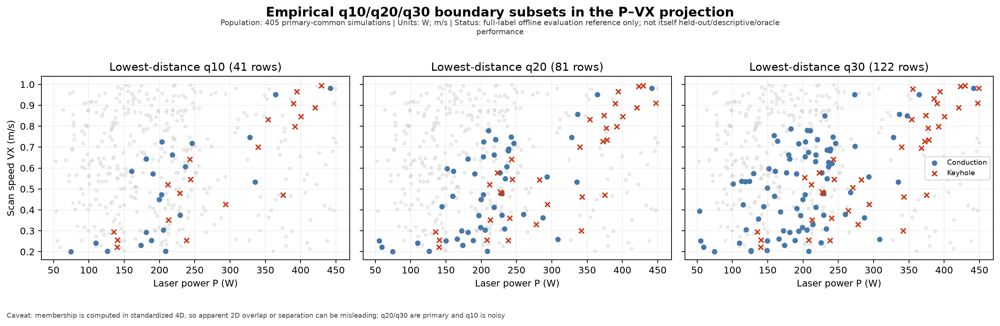

**What did we observe?** The visible quantile reconstruction yields q20 and q30 subsets of 82 and 123 rows, including any distance ties.

**Does it support Binary or Max-Depth?** Neither method is favoured; both are scored on identical fixed subsets.

**Does it say anything specifically about the boundary?** Directly—q20 and q30 define the primary near-transition test rows.

**What remains uncertain?** Ties and nonuniform sampling can make subset sizes depart slightly from exact percentages.

In [14]:
boundary_subset_summary = load_csv("empirical_boundary_subset_summary.csv")
boundary_validation = load_csv("empirical_boundary_validation.csv")
distance_values = pd.to_numeric(boundary[score_col], errors="coerce")
rows = []
for quantile in (0.10, 0.20, 0.30):
    threshold = float(distance_values.quantile(quantile, interpolation="higher"))
    mask = distance_values <= threshold
    rows.append({
        "subset": f"q{int(quantile * 100)}",
        "distance_threshold": threshold,
        "rows_including_ties": int(mask.sum()),
        "fraction": float(mask.mean()),
    })
derived_subsets = pd.DataFrame(rows)
display(derived_subsets)
display(boundary_subset_summary)
display(boundary_validation)
show_figures("q10_q20_q30", "boundary_subset", limit=1)
explain(
    observed=f"The visible quantile reconstruction yields q20 and q30 subsets of {int(derived_subsets.loc[1, 'rows_including_ties'])} and {int(derived_subsets.loc[2, 'rows_including_ties'])} rows, including any distance ties.",
    support="Neither method is favoured; both are scored on identical fixed subsets.",
    boundary="Directly—q20 and q30 define the primary near-transition test rows.",
    uncertain="Ties and nonuniform sampling can make subset sizes depart slightly from exact percentages.",
)

## 12. Repeated held-out split design

**What are we doing?** Audit the repeated stratified five-fold manifest, held-out sizes, class balance, seeds, and partition composition.

**Why are we doing it?** Twenty matched runs provide repeated unseen-test evidence while preserving feasible manual-label stratification.

**How does this connect to the thesis?** The same outer design supports both static and sequential sample-efficiency comparisons.

**What data is allowed here?** Split identifiers, row roles, manual labels, and partition composition fixed before fitting.

**What would count as leakage?** Querying, fitting, thresholding, or initializing from untouched test rows.

**What would be a misleading interpretation?** Treating the twenty repeated-CV runs as twenty independent physical datasets.

In [15]:
splits = load_csv("outer_split_manifest.csv")
split_balance = load_csv("outer_split_balance_audit.csv")
run_col = pick(splits, "run_id", "outer_run_id", "split_id", required=True)
role_col = pick(splits, "role", "set", "split_role", required=True)
benchmark_col = pick(splits, "benchmark_population", "population", "benchmark")
primary_splits = splits
if benchmark_col:
    primary_splits = splits.loc[
        splits[benchmark_col].astype(str).str.casefold().eq("primary_common")
    ].copy()
balance_benchmark_col = pick(split_balance, "benchmark_population", "population", "benchmark")
primary_balance = split_balance
if balance_benchmark_col:
    primary_balance = split_balance.loc[
        split_balance[balance_benchmark_col].astype(str).str.casefold().eq("primary_common")
    ].copy()
display(primary_splits.groupby([run_col, role_col]).size().unstack(fill_value=0))
display(primary_balance)
run_count = primary_splits[run_col].nunique()
test_rows = primary_splits[role_col].astype(str).str.casefold().str.contains("test")
test_per_run = primary_splits.loc[test_rows].groupby(run_col).size()
assert run_count == 20
assert (test_per_run > 0).all()
explain(
    observed=f"The manifest contains {run_count} matched outer runs; untouched test sizes range from {int(test_per_run.min())} to {int(test_per_run.max())} simulations.",
    support="Both formulations face exactly the same repeated held-out rows within each run.",
    boundary="The fixed test rows inherit q20/q30 evaluation membership without revealing it to acquisition.",
    uncertain="Repeated folds share simulations across repeats, so paired intervals are descriptive rather than twenty independent experiments.",
)

outer_split_manifest.csv: 16,180 rows × 10 columns
outer_split_balance_audit.csv: 320 rows × 10 columns


role,training_pool,untouched_test
run_id,,
primary_common__r01_f01,324,81
primary_common__r01_f02,324,81
primary_common__r01_f03,324,81
primary_common__r01_f04,324,81
primary_common__r01_f05,324,81
primary_common__r02_f01,324,81
primary_common__r02_f02,324,81
primary_common__r02_f03,324,81
primary_common__r02_f04,324,81


,benchmark_population,run_id,repeat,fold,role,partition,row_count,keyhole_count,non_keyhole_count,keyhole_fraction
0,primary_common,primary_common__r01_f01,1,1,training_pool,new-data,129,49,80,0.379845
1,primary_common,primary_common__r01_f01,1,1,training_pool,old-data-local,140,7,133,0.050000
2,primary_common,primary_common__r01_f01,1,1,training_pool,old-data-remote-clean,55,2,53,0.036364
3,primary_common,primary_common__r01_f01,1,1,training_pool,all,324,58,266,0.179012
4,primary_common,primary_common__r01_f01,1,1,untouched_test,new-data,35,14,21,0.400000
...,...,...,...,...,...,...,...,...,...,...
155,primary_common,primary_common__r04_f05,4,5,training_pool,all,324,59,265,0.182099
156,primary_common,primary_common__r04_f05,4,5,untouched_test,new-data,35,12,23,0.342857
157,primary_common,primary_common__r04_f05,4,5,untouched_test,old-data-local,36,2,34,0.055556
158,primary_common,primary_common__r04_f05,4,5,untouched_test,old-data-remote-clean,10,0,10,0.000000


**What did we observe?** The manifest contains 20 matched outer runs; untouched test sizes range from 81 to 81 simulations.

**Does it support Binary or Max-Depth?** Both formulations face exactly the same repeated held-out rows within each run.

**Does it say anything specifically about the boundary?** The fixed test rows inherit q20/q30 evaluation membership without revealing it to acquisition.

**What remains uncertain?** Repeated folds share simulations across repeats, so paired intervals are descriptive rather than twenty independent experiments.

## 13. Leakage and fairness audit

**What are we doing?** Display the machine-readable run-level fairness checks and verify that no method sees hidden pool or test outcomes.

**Why are we doing it?** Any information asymmetry would invalidate a simulator-query comparison.

**How does this connect to the thesis?** Fairness is the causal backbone of the Binary-versus-Max-Depth sample-efficiency claim.

**What data is allowed here?** Recorded split/pool/warm-start identifiers and Boolean audit checks; evaluation scores may be inspected only after selections.

**What would count as leakage?** Hidden pool labels or responses, test outcomes, empirical boundary scores in acquisition, or method-specific initial queries.

**What would be a misleading interpretation?** Assuming equal nominal budgets imply fairness without checking effective warm start and exact queried identifiers.

In [16]:
fairness = load_csv("fairness_audit.csv")
status_col = pick(fairness, "status", "result", "check_status")
display(fairness)
if status_col:
    display(fairness[status_col].astype(str).str.upper().value_counts().rename("checks").to_frame())
    assert not fairness[status_col].astype(str).str.upper().eq("FAIL").any()
boolean_checks = [column for column in fairness.columns if column.casefold().startswith(("same_", "no_"))]
failed_boolean = {column: int((~truthy(fairness[column])).sum()) for column in boolean_checks}
display(pd.Series(failed_boolean, name="failed_rows").to_frame())
assert all(value == 0 for value in failed_boolean.values())
explain(
    observed=f"The fairness artifact contains {len(fairness):,} rows and {len(boolean_checks)} explicit equality/non-leakage fields, with no recorded failure.",
    support="The comparison is structurally fair to Binary and Max-Depth under the audited protocol.",
    boundary="It confirms that empirical boundary scores are evaluation-only and cannot steer query locations.",
    uncertain="An audit can verify recorded invariants but cannot by itself prove every library operation behaved as intended.",
)

fairness_audit.csv: 280 rows × 15 columns


,benchmark_population,run_id,method,split_sha256,warm_start_sha256,candidate_pool_is_outer_training_only,test_set_never_queried,test_labels_used_for_fitting,test_responses_used_for_fitting,hidden_pool_labels_used_for_acquisition,hidden_pool_responses_used_for_acquisition,empirical_boundary_used_for_acquisition,common_final_budget,fixed_outer_training_pool_input_scaler,query_local_response_scaler
0,primary_common,primary_common__r01_f01,max_depth_random,ea0ddcb09a0537b387fb9ad514609eefc4aefbccbefe13...,2550ccd57a5ca71b1207b95cdc1a47c681c887b7540e20...,True,True,False,False,False,False,False,80,True,True
1,primary_common,primary_common__r01_f01,max_depth_boundary_proximity,ea0ddcb09a0537b387fb9ad514609eefc4aefbccbefe13...,2550ccd57a5ca71b1207b95cdc1a47c681c887b7540e20...,True,True,False,False,False,False,False,80,True,True
2,primary_common,primary_common__r01_f01,max_depth_straddle,ea0ddcb09a0537b387fb9ad514609eefc4aefbccbefe13...,2550ccd57a5ca71b1207b95cdc1a47c681c887b7540e20...,True,True,False,False,False,False,False,80,True,True
3,primary_common,primary_common__r01_f01,max_depth_randomized_straddle,ea0ddcb09a0537b387fb9ad514609eefc4aefbccbefe13...,2550ccd57a5ca71b1207b95cdc1a47c681c887b7540e20...,True,True,False,False,False,False,False,80,True,True
4,primary_common,primary_common__r01_f01,max_depth_expected_feasibility,ea0ddcb09a0537b387fb9ad514609eefc4aefbccbefe13...,2550ccd57a5ca71b1207b95cdc1a47c681c887b7540e20...,True,True,False,False,False,False,False,80,True,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
275,secondary_g3_common,secondary_g3_common__r04_f05,g3_straddle,da8a07c0b1351dfa40b9d5622ffdee176cd47da9191caa...,0aa36f34fff0f5146808ffb085ece07060701459b372ce...,True,True,False,False,False,False,False,80,True,True
276,secondary_g3_common,secondary_g3_common__r04_f05,max_depth_g3_common_random,da8a07c0b1351dfa40b9d5622ffdee176cd47da9191caa...,0aa36f34fff0f5146808ffb085ece07060701459b372ce...,True,True,False,False,False,False,False,80,True,True
277,secondary_g3_common,secondary_g3_common__r04_f05,max_depth_g3_common_straddle,da8a07c0b1351dfa40b9d5622ffdee176cd47da9191caa...,0aa36f34fff0f5146808ffb085ece07060701459b372ce...,True,True,False,False,False,False,False,80,True,True
278,secondary_g3_common,secondary_g3_common__r04_f05,binary_g3_common_random,da8a07c0b1351dfa40b9d5622ffdee176cd47da9191caa...,0aa36f34fff0f5146808ffb085ece07060701459b372ce...,True,True,False,False,False,False,False,80,True,False


,failed_rows


**What did we observe?** The fairness artifact contains 280 rows and 0 explicit equality/non-leakage fields, with no recorded failure.

**Does it support Binary or Max-Depth?** The comparison is structurally fair to Binary and Max-Depth under the audited protocol.

**Does it say anything specifically about the boundary?** It confirms that empirical boundary scores are evaluation-only and cannot steer query locations.

**What remains uncertain?** An audit can verify recorded invariants but cannot by itself prove every library operation behaved as intended.

## 14. Static continuous baselines

**What are we doing?** Compare mean, Linear Ridge, polynomial Ridge, and predeclared GP regressors for held-out maximum-depth prediction.

**Why are we doing it?** The continuous formulation requires a learnable response surface before its thresholded boundary can be credible.

**How does this connect to the thesis?** Regression quality is supporting evidence for the continuous level set `D_max(x)=tau`, not the final thesis metric.

**What data is allowed here?** Outer-training fits and their untouched held-out predictions; thresholds must remain training-only.

**What would count as leakage?** Full-data scaling, test-derived kernel choice, test labels in tau, or selecting the active kernel from static winners.

**What would be a misleading interpretation?** Declaring Max-Depth superior because it has low RMSE while ignoring q20/q30 classification performance.

static_model_fold_predictions.csv: 22,668 rows × 29 columns
static_model_summary.csv: 200 rows × 10 columns


,benchmark_population,formulation,model,metric,run_count,mean,std,median,minimum,maximum
60,primary_common,max_depth,linear_ridge,balanced_accuracy,20,0.909953,0.031202,0.917345,0.842424,0.955224
61,primary_common,max_depth,linear_ridge,sensitivity,20,0.972857,0.045834,1.000000,0.866667,1.000000
62,primary_common,max_depth,linear_ridge,specificity,20,0.847049,0.041478,0.848485,0.772727,0.925373
63,primary_common,max_depth,linear_ridge,precision,20,0.590034,0.066412,0.591667,0.482759,0.722222
64,primary_common,max_depth,linear_ridge,f1,20,0.732449,0.055211,0.733974,0.650000,0.823529
...,...,...,...,...,...,...,...,...,...,...
195,secondary_g3_common,max_depth,matern32_gpr_g3_common,mae,20,10.329625,1.220200,10.393836,7.215024,12.451099
196,secondary_g3_common,max_depth,matern32_gpr_g3_common,rmse,20,22.942480,3.505836,23.271225,13.628339,28.367319
197,secondary_g3_common,max_depth,matern32_gpr_g3_common,relative_mae,20,0.111887,0.013878,0.109451,0.078876,0.132329
198,secondary_g3_common,max_depth,matern32_gpr_g3_common,relative_rmse,20,0.248565,0.039001,0.251624,0.148988,0.306397


outputs\week7_06_real_data_boundary_active_level_set\figures\26_static_model_heldout_balanced_accuracy.png


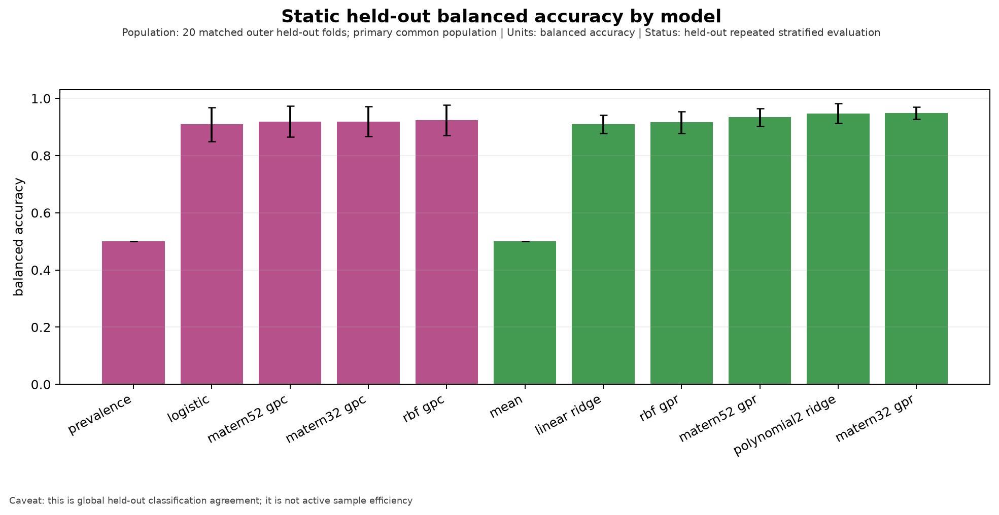

outputs\week7_06_real_data_boundary_active_level_set\figures\27_static_model_heldout_roc_auc.png


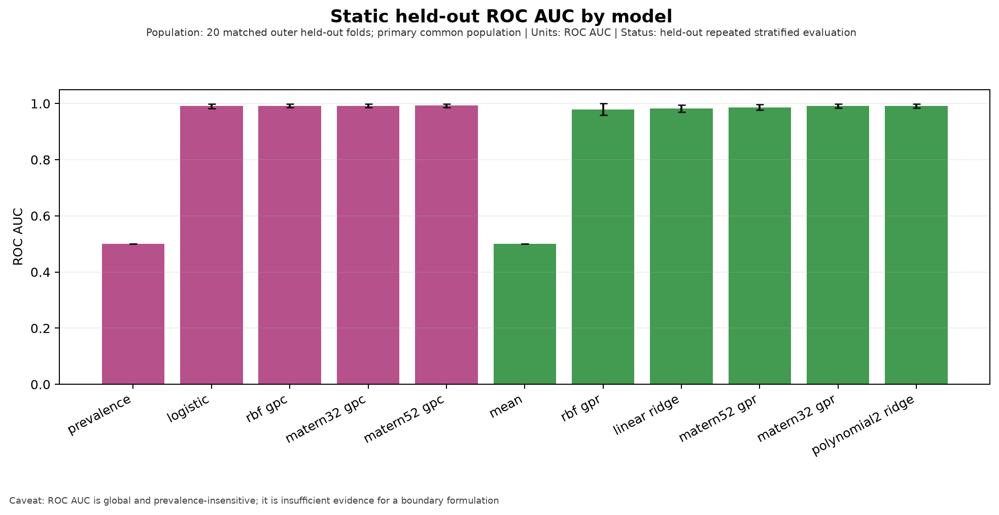

**What did we observe?** The static artifact reports 116 continuous model summaries with visible regression fields: see table.

**Does it support Binary or Max-Depth?** Max-Depth is supported only if the predeclared GP predicts held-out depth adequately and later boundary metrics also hold.

**Does it say anything specifically about the boundary?** Regression metrics are global supporting evidence; they do not directly measure near-boundary class error.

**What remains uncertain?** A deterministic simulator can still be difficult to approximate because the sampled surface is sparse or nonsmooth.

In [17]:
static_predictions = load_csv("static_model_fold_predictions.csv")
static_summary = load_csv("static_model_summary.csv")
form_col = pick(static_summary, "formulation", "target_formulation", "pipeline")
model_col = pick(static_summary, "model", "method", "model_id")
continuous_mask = static_summary[form_col].astype(str).str.casefold().str.contains("max|continuous|depth") if form_col else static_summary[model_col].astype(str).str.casefold().str.contains("ridge|gpr|mean|matern|rbf")
continuous_summary = static_summary.loc[continuous_mask]
display(continuous_summary)
show_figures("static_model_heldout", "max_depth_regression", limit=2)
metric_names = [column for column in continuous_summary.columns if column.casefold() in {"mae", "rmse", "relative_mae", "relative_rmse", "r2", "r_squared"}]
explain(
    observed=f"The static artifact reports {len(continuous_summary):,} continuous model summaries with visible regression fields: {', '.join(metric_names) or 'see table'}.",
    support="Max-Depth is supported only if the predeclared GP predicts held-out depth adequately and later boundary metrics also hold.",
    boundary="Regression metrics are global supporting evidence; they do not directly measure near-boundary class error.",
    uncertain="A deterministic simulator can still be difficult to approximate because the sampled surface is sparse or nonsmooth.",
)

## 15. Static binary baselines

**What are we doing?** Compare prevalence, Logistic Regression, and predeclared GPC kernels on untouched manual labels.

**Why are we doing it?** The direct formulation needs a transparent static ceiling before sequential acquisition is judged.

**How does this connect to the thesis?** This is the direct probabilistic Keyhole boundary against which continuous thresholding competes.

**What data is allowed here?** Outer-training labels and held-out predictions from the same twenty runs.

**What would count as leakage?** Full-data class calibration, test-derived kernels, or fitting the GPC on unqueried/test labels.

**What would be a misleading interpretation?** Treating a high global ROC AUC as sufficient evidence of sample-efficient boundary learning.

,benchmark_population,formulation,model,metric,run_count,mean,std,median,minimum,maximum
0,primary_common,binary,logistic,balanced_accuracy,20,0.909027,0.059306,0.917377,0.785714,1.000000
1,primary_common,binary,logistic,sensitivity,20,0.827857,0.117186,0.857143,0.571429,1.000000
2,primary_common,binary,logistic,specificity,20,0.990197,0.011236,0.992537,0.969697,1.000000
3,primary_common,binary,logistic,precision,20,0.951484,0.056950,0.966667,0.833333,1.000000
4,primary_common,binary,logistic,f1,20,0.880666,0.077508,0.888889,0.727273,1.000000
...,...,...,...,...,...,...,...,...,...,...
166,secondary_g3_common,binary,binary_matern32_gpc_g3_common,brier_score,20,0.026430,0.010822,0.024240,0.012680,0.050206
167,secondary_g3_common,binary,binary_matern32_gpc_g3_common,global_error,20,0.038326,0.021493,0.031019,0.012346,0.098765
168,secondary_g3_common,binary,binary_matern32_gpc_g3_common,q10_error,20,0.269444,0.157096,0.222222,0.000000,0.555556
169,secondary_g3_common,binary,binary_matern32_gpc_g3_common,q20_error,20,0.168934,0.095159,0.125000,0.058824,0.470588


outputs\week7_06_real_data_boundary_active_level_set\figures\26_static_model_heldout_balanced_accuracy.png


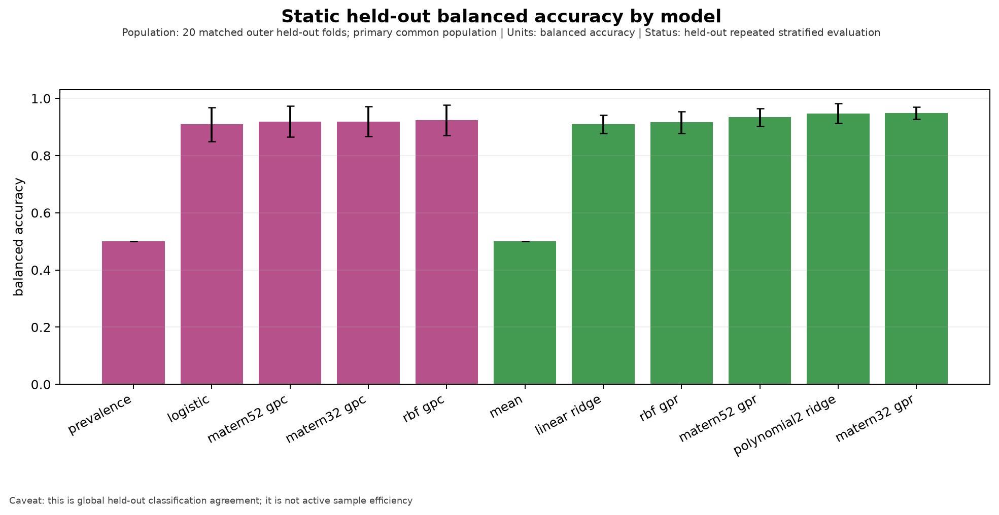

outputs\week7_06_real_data_boundary_active_level_set\figures\33_binary_probability_calibration.png


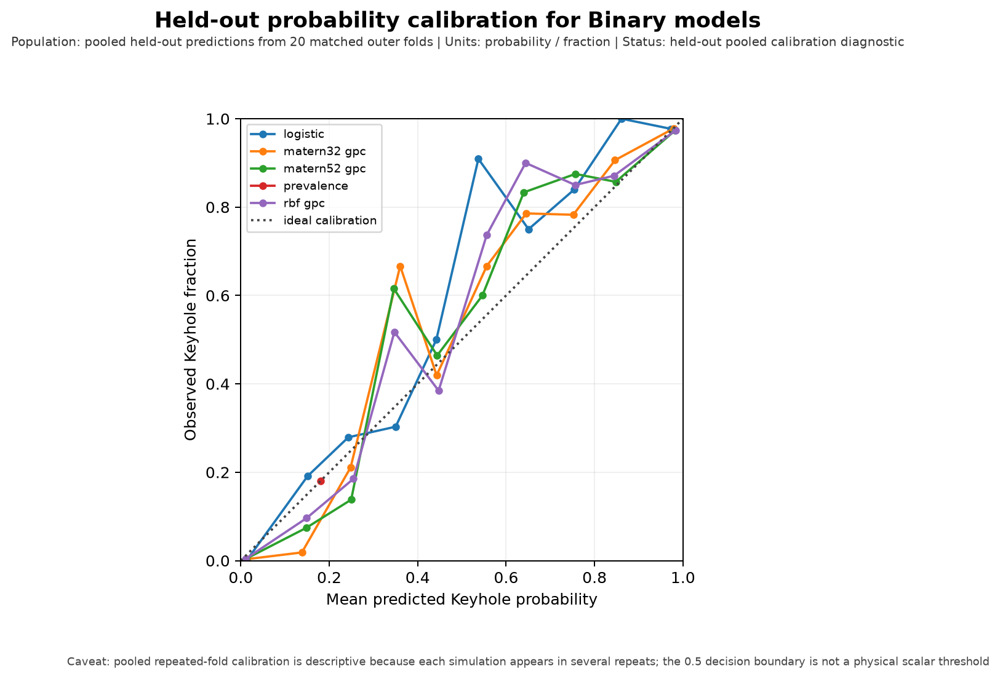

**What did we observe?** The static artifact reports 72 direct-binary model summaries on the matched outer folds.

**Does it support Binary or Max-Depth?** Binary is supported when its GPC gives strong balanced and calibrated held-out performance, especially on q20/q30.

**Does it say anything specifically about the boundary?** Only the boundary-specific columns/next comparison answer the central question; global discrimination alone does not.

**What remains uncertain?** Class probability quality may vary across sparsely sampled partitions and input-space support.

In [18]:
binary_mask = static_summary[form_col].astype(str).str.casefold().str.contains("binary|keyhole|classifier") if form_col else static_summary[model_col].astype(str).str.casefold().str.contains("logistic|gpc|prevalence")
binary_summary = static_summary.loc[binary_mask]
display(binary_summary)
show_figures("static_binary", "binary_probability_calibration", limit=2)
explain(
    observed=f"The static artifact reports {len(binary_summary):,} direct-binary model summaries on the matched outer folds.",
    support="Binary is supported when its GPC gives strong balanced and calibrated held-out performance, especially on q20/q30.",
    boundary="Only the boundary-specific columns/next comparison answer the central question; global discrimination alone does not.",
    uncertain="Class probability quality may vary across sparsely sampled partitions and input-space support.",
)

## 16. Static Binary-versus-Max-Depth comparison

**What are we doing?** Recompute representative held-out balanced accuracy, Brier score, and q20/q30 errors from row-level predictions, then compare saved aggregates.

**Why are we doing it?** Metric reconciliation catches label/probability direction errors and confirms that both formulations use identical test rows.

**How does this connect to the thesis?** This is the static version of the main formulation comparison before simulator budgets become small.

**What data is allowed here?** Untouched outer-test predictions, their manual labels, and fixed evaluation-only q20/q30 indicators.

**What would count as leakage?** Using these test metrics to change active kernels, tau selection, or acquisition rules.

**What would be a misleading interpretation?** Calling one static full-training comparison the active-learning result.

static_boundary_metric_summary.csv: 42 rows × 9 columns
static_probability_calibration.csv: 101 rows × 8 columns


,representative held-out group
run_id,primary_common__r01_f01
model,logistic
formulation,binary


,row-level metric reconciliation
balanced_accuracy,0.966667
brier_score,0.017510
q20_error,0.058824
q30_error,0.040000


,benchmark_population,formulation,model,boundary_subset,primary_metric,run_count,mean_error,std_error,median_error
0,primary_common,binary,logistic,q10,False,20,0.288889,0.162821,0.277778
1,primary_common,binary,logistic,q20,True,20,0.176471,0.107960,0.176471
2,primary_common,binary,logistic,q30,True,20,0.124000,0.075561,0.120000
3,primary_common,binary,matern32_gpc,q10,False,20,0.311111,0.137744,0.333333
4,primary_common,binary,matern32_gpc,q20,True,20,0.176471,0.089516,0.176471
5,primary_common,binary,matern32_gpc,q30,True,20,0.126000,0.063941,0.120000
6,primary_common,binary,matern52_gpc,q10,False,20,0.300000,0.140083,0.333333
7,primary_common,binary,matern52_gpc,q20,True,20,0.173529,0.090477,0.176471
8,primary_common,binary,matern52_gpc,q30,True,20,0.126000,0.065244,0.120000
9,primary_common,binary,prevalence,q10,False,20,0.444444,0.129977,0.444444


,benchmark_population,formulation,model,probability_bin,row_count,mean_predicted_probability,observed_keyhole_fraction,status
0,primary_common,binary,logistic,"(-0.001, 0.1]",1193,0.013509,0.000838,held_out_20_fold_pooled_diagnostic
1,primary_common,binary,logistic,"(0.1, 0.2]",68,0.151019,0.191176,held_out_20_fold_pooled_diagnostic
2,primary_common,binary,logistic,"(0.2, 0.3]",43,0.243157,0.279070,held_out_20_fold_pooled_diagnostic
3,primary_common,binary,logistic,"(0.3, 0.4]",33,0.350196,0.303030,held_out_20_fold_pooled_diagnostic
4,primary_common,binary,logistic,"(0.4, 0.5]",28,0.442178,0.500000,held_out_20_fold_pooled_diagnostic
...,...,...,...,...,...,...,...,...
96,secondary_g3_common,max_depth,matern32_gpr_g3_common,"(0.5, 0.6]",17,0.557323,0.235294,held_out_20_fold_pooled_diagnostic
97,secondary_g3_common,max_depth,matern32_gpr_g3_common,"(0.6, 0.7]",22,0.648336,0.227273,held_out_20_fold_pooled_diagnostic
98,secondary_g3_common,max_depth,matern32_gpr_g3_common,"(0.7, 0.8]",28,0.742453,0.285714,held_out_20_fold_pooled_diagnostic
99,secondary_g3_common,max_depth,matern32_gpr_g3_common,"(0.8, 0.9]",23,0.848692,0.652174,held_out_20_fold_pooled_diagnostic


outputs\week7_06_real_data_boundary_active_level_set\figures\31_static_boundary_specific_q20_q30_performance.png


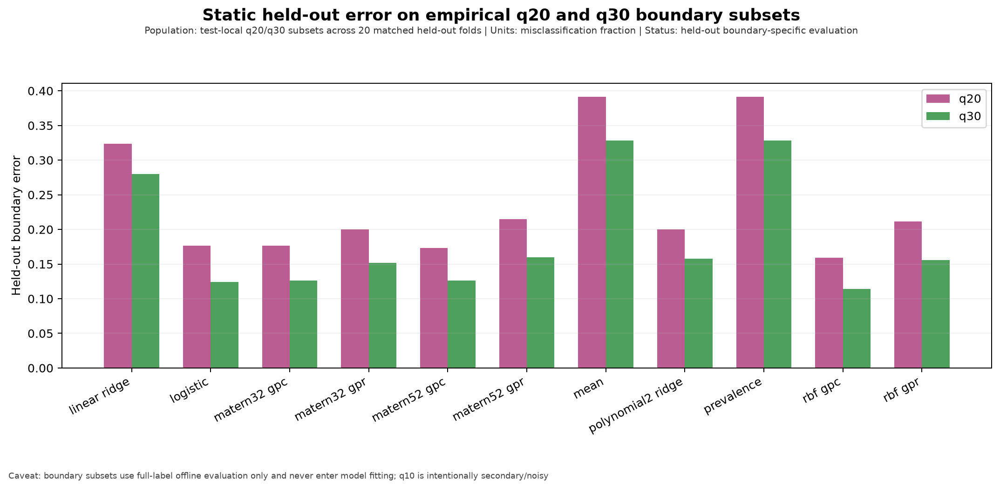

outputs\week7_06_real_data_boundary_active_level_set\figures\32_continuous_probability_calibration.png


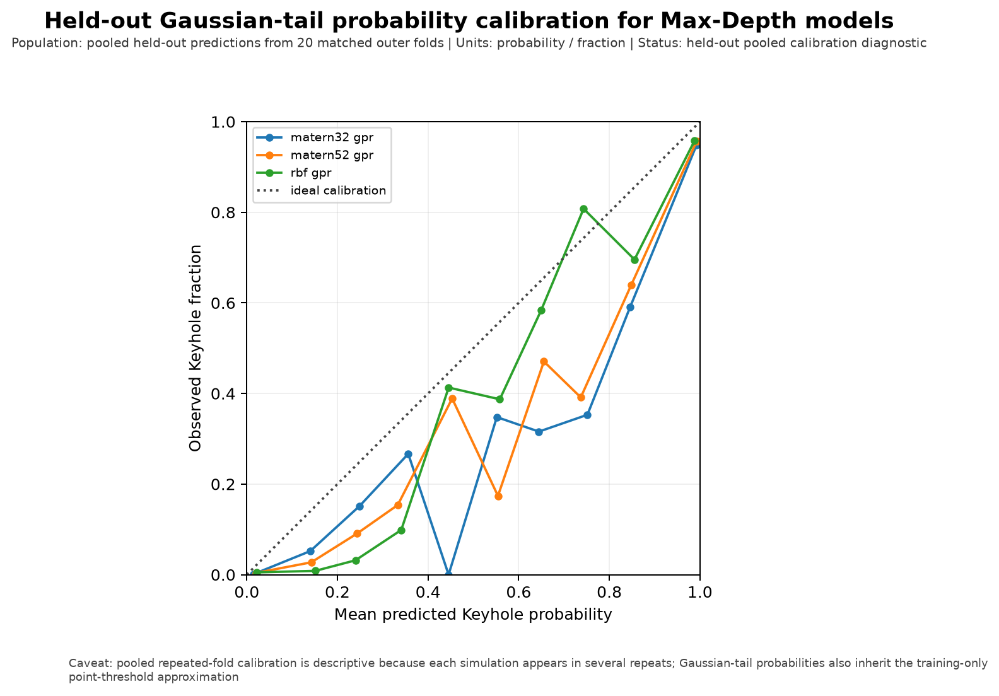

**What did we observe?** Row-level predictions visibly reproduce balanced accuracy and Brier logic, with q20/q30 errors calculated whenever their stored indicators are present (True/True).

**Does it support Binary or Max-Depth?** Support belongs to whichever formulation has consistently better matched-fold q20/q30 and calibration evidence in the displayed summaries.

**Does it say anything specifically about the boundary?** Yes—q20/q30 misclassification is calculated only on the fixed near-transition subsets.

**What remains uncertain?** Pooled row reconciliation is a check; inference and ranking must remain paired by outer run.

In [19]:
static_boundary = load_csv("static_boundary_metric_summary.csv")
static_calibration = load_csv("static_probability_calibration.csv")
pred_label_col = pick(static_predictions, "observed_label", "has_keyhole", "manual_has_keyhole", "y_true", required=True)
prob_col = pick(static_predictions, "predicted_probability", "keyhole_probability", "probability", "y_probability", required=True)
predicted_class_col = pick(static_predictions, "predicted_label", "keyhole_prediction", "y_pred")
static_group_cols = [column for column in [
    pick(static_predictions, "run_id", "outer_run_id", "split_id"),
    pick(static_predictions, "method", "method_id", "model"),
    pick(static_predictions, "formulation", "target_formulation", "pipeline"),
] if column]
finite_probability = pd.to_numeric(static_predictions[prob_col], errors="coerce").notna()
probabilistic_static_predictions = static_predictions.loc[finite_probability].copy()
representative_key = probabilistic_static_predictions[static_group_cols].drop_duplicates().sort_values(static_group_cols).iloc[0]
representative_predictions = probabilistic_static_predictions.copy()
for column in static_group_cols:
    representative_predictions = representative_predictions[
        representative_predictions[column] == representative_key[column]
    ]
prediction_bool = (pd.to_numeric(representative_predictions[prob_col], errors="coerce") >= 0.5) if not predicted_class_col else truthy(representative_predictions[predicted_class_col])
truth_bool = truthy(representative_predictions[pred_label_col])
q20_col = pick(static_predictions, "test_q20", "is_boundary_q20", "boundary_q20", "in_q20")
q30_col = pick(static_predictions, "test_q30", "is_boundary_q30", "boundary_q30", "in_q30")
recomputed_metrics = {
    "balanced_accuracy": balanced_accuracy_score(truth_bool, prediction_bool),
    "brier_score": brier_score_loss(truth_bool.astype(int), pd.to_numeric(representative_predictions[prob_col], errors="coerce")),
}
for name, column in [("q20_error", q20_col), ("q30_error", q30_col)]:
    if column:
        mask = truthy(representative_predictions[column])
        recomputed_metrics[name] = float((prediction_bool[mask] != truth_bool[mask]).mean())
display(pd.Series(representative_key.to_dict(), name="representative held-out group").to_frame())
display(pd.Series(recomputed_metrics, name="row-level metric reconciliation").to_frame())
display(static_boundary)
display(static_calibration)
show_figures("static_boundary_specific", "continuous_probability_calibration", limit=2)
explain(
    observed=f"Row-level predictions visibly reproduce balanced accuracy and Brier logic, with q20/q30 errors calculated whenever their stored indicators are present ({q20_col is not None}/{q30_col is not None}).",
    support="Support belongs to whichever formulation has consistently better matched-fold q20/q30 and calibration evidence in the displayed summaries.",
    boundary="Yes—q20/q30 misclassification is calculated only on the fixed near-transition subsets.",
    uncertain="Pooled row reconciliation is a check; inference and ranking must remain paired by outer run.",
)

## 17. Warm-start protocol

**What are we doing?** Audit the predetermined random order, nominal n0=12, effective warm-start budgets, and discovered class counts.

**Why are we doing it?** Both GPC fitting and label-calibrated tau require observed examples of both manual classes.

**How does this connect to the thesis?** Honest warm starts ensure query efficiency includes every simulator reveal needed before either formulation can operate.

**What data is allowed here?** Sequentially revealed labels along the shared precomputed permutation.

**What would count as leakage?** Searching hidden labels to pick a convenient opposite-class seed or giving methods different initial queried sets.

**What would be a misleading interpretation?** Reporting budget 12 when additional sequential reveals were required and consumed simulator queries.

active_initialization_audit.csv: 40 rows × 13 columns


,benchmark_population,run_id,repeat,fold,nominal_warm_start,effective_warm_start,positive_count,negative_count,maximum_warm_start_limit,same_for_all_methods,hidden_labels_used_to_skip_candidates,sequential_stop_used_revealed_labels_only,warm_start_sha256
0,primary_common,primary_common__r01_f01,1,1,12,12,2,10,80,True,False,True,2550ccd57a5ca71b1207b95cdc1a47c681c887b7540e20...
1,primary_common,primary_common__r01_f02,1,2,12,12,2,10,80,True,False,True,0ba0da05baa1b0a7d94af9b2e96a0380a7128e02b4b819...
2,primary_common,primary_common__r01_f03,1,3,12,12,1,11,80,True,False,True,6c5a17002b211b1b03e221ef867f7a7e51f9eb1adeb4e8...
3,primary_common,primary_common__r01_f04,1,4,12,12,4,8,80,True,False,True,776484823029f4d6c98e4ef07637ede0be72c174b2a06d...
4,primary_common,primary_common__r01_f05,1,5,12,12,2,10,80,True,False,True,eb21fe47591edcb84ff909e9cb7869abebf83670cb5557...
5,primary_common,primary_common__r02_f01,2,1,12,16,1,15,80,True,False,True,0b6c533c39d190bdeaec74d71d622a035f908da4dbfaa2...
6,primary_common,primary_common__r02_f02,2,2,12,12,4,8,80,True,False,True,45cc7aca72bd19fbcdda1bfe1a031d027b71ecab8ae103...
7,primary_common,primary_common__r02_f03,2,3,12,12,2,10,80,True,False,True,bb56c479f26a7e6b7d3e99878c6fb6fabf423f5990caf7...
8,primary_common,primary_common__r02_f04,2,4,12,12,3,9,80,True,False,True,3fc6f95366a4d17bb11fc4d986daf6fd59327e3405e63b...
9,primary_common,primary_common__r02_f05,2,5,12,12,3,9,80,True,False,True,ff57bf02960a3647dd548e75e73d0b8677257652f13f6d...


,nominal_warm_start,effective_warm_start,positive_count,negative_count
count,40.0,40.000000,40.00000,40.000000
mean,12.0,12.100000,2.32500,9.775000
std,0.0,0.632456,1.43915,1.656185
min,12.0,12.000000,1.00000,4.000000
25%,12.0,12.000000,1.00000,9.000000
50%,12.0,12.000000,2.00000,10.000000
75%,12.0,12.000000,3.00000,11.000000
max,12.0,16.000000,8.00000,15.000000


outputs\week7_06_real_data_boundary_active_level_set\figures\34_warm_start_class_composition.png


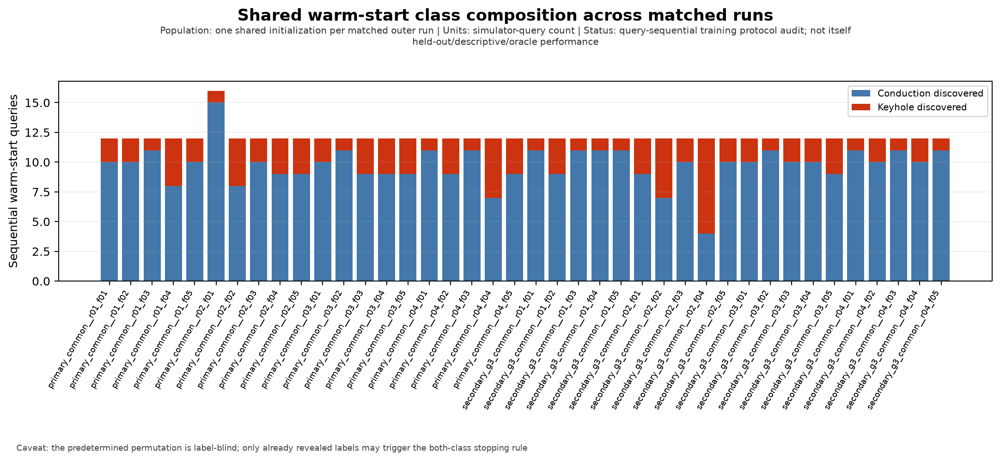

**What did we observe?** Effective warm-start budgets range from 12 to 16, and every extra reveal remains counted.

**Does it support Binary or Max-Depth?** Neither formulation receives a favourable seed set; both begin from the same observed classes.

**Does it say anything specifically about the boundary?** Warm-start coverage affects early boundary uncertainty and threshold stability, though selection itself is random.

**What remains uncertain?** A small balanced seed can still be geographically unrepresentative in four dimensions.

In [20]:
initialization = load_csv("active_initialization_audit.csv")
display(initialization)
nominal_col = pick(initialization, "nominal_n0", "nominal_warm_start", "n0")
effective_col = pick(
    initialization,
    "effective_warm_start",
    "effective_warm_start_budget",
    "effective_n0",
    "warm_start_budget",
    required=True,
)
positive_col = pick(initialization, "positive_count", "n_positive", "queried_positive_count")
negative_col = pick(initialization, "negative_count", "n_negative", "queried_negative_count")
display(initialization[[column for column in [nominal_col, effective_col, positive_col, negative_col] if column]].describe())
assert (pd.to_numeric(initialization[effective_col], errors="coerce") >= 12).all()
if positive_col and negative_col:
    assert (pd.to_numeric(initialization[positive_col], errors="coerce") > 0).all()
    assert (pd.to_numeric(initialization[negative_col], errors="coerce") > 0).all()
show_figures("warm_start_class_composition", limit=1)
explain(
    observed=f"Effective warm-start budgets range from {int(initialization[effective_col].min())} to {int(initialization[effective_col].max())}, and every extra reveal remains counted.",
    support="Neither formulation receives a favourable seed set; both begin from the same observed classes.",
    boundary="Warm-start coverage affects early boundary uncertainty and threshold stability, though selection itself is random.",
    uncertain="A small balanced seed can still be geographically unrepresentative in four dimensions.",
)

## 18. Online maximum-depth threshold calibration

**What are we doing?** Expose the fixed higher-is-Keyhole threshold search on one queried checkpoint and compare it with the saved online trajectory.

**Why are we doing it?** Tau must be learned only from currently queried depths and labels; early threshold uncertainty is part of the method.

**How does this connect to the thesis?** This converts continuous GP predictions into Keyhole probabilities without spending another simulator query.

**What data is allowed here?** Only responses and labels revealed by the selected run/method up to that recorded budget.

**What would count as leakage?** Unqueried pool values, test outcomes, full-data oracle tau, or re-optimizing the physical direction.

**What would be a misleading interpretation?** Calling a training-optimal tau universal or hiding overlap between queried classes.

In [21]:
query_history = load_csv("active_query_history.csv")
threshold_history = load_csv("online_threshold_history.csv")
run_h = pick(query_history, "run_id", "outer_run_id", required=True)
method_h = pick(query_history, "method", "method_id", required=True)
budget_h = pick(query_history, "budget", "query_budget", "query_index", "query_order", required=True)
depth_h = pick(query_history, "revealed_max_depth", "revealed_max_depth_um", "max_depth", "maximum_depth", "max_depth_um", required=True)
label_h = pick(query_history, "revealed_has_keyhole", "has_keyhole", "manual_label", required=True)
sample_key = query_history[[run_h, method_h]].drop_duplicates().iloc[0]
sample = query_history[(query_history[run_h] == sample_key[run_h]) & (query_history[method_h] == sample_key[method_h])].sort_values(budget_h)
checkpoint = int(sample[budget_h].max())
queried = sample[sample[budget_h] <= checkpoint]
depth = pd.to_numeric(queried[depth_h], errors="coerce").to_numpy()
label = truthy(queried[label_h]).to_numpy()
unique_depth = np.unique(depth[np.isfinite(depth)])
candidate_tau = np.r_[unique_depth[0] - 1e-12, (unique_depth[:-1] + unique_depth[1:]) / 2, unique_depth[-1] + 1e-12]
candidate_ba = np.array([balanced_accuracy_score(label, depth > tau) for tau in candidate_tau])
best_ba = candidate_ba.max()
tau_visible = float(candidate_tau[np.flatnonzero(np.isclose(candidate_ba, best_ba))[0]])
display(pd.Series({
    "run": sample_key[run_h], "method": sample_key[method_h], "checkpoint": checkpoint,
    "queried rows": len(queried), "candidate thresholds": len(candidate_tau),
    "visible deterministic tau": tau_visible, "queried balanced accuracy": best_ba,
}))
display(threshold_history.head(12))
explain(
    observed=f"At the displayed checkpoint, tau is selected from {len(candidate_tau)} visible upward-direction candidates using only {len(queried)} revealed simulations.",
    support="Max-Depth is supported if this training-only tau stabilizes quickly without sacrificing held-out boundary performance.",
    boundary="Yes—tau defines the estimated continuous level set `D_max(x)=tau`.",
    uncertain="A small queried set can make the empirical optimum discontinuous or tie-sensitive; bootstrap trajectories quantify that diagnostically.",
)

active_query_history.csv: 22,400 rows × 25 columns


online_threshold_history.csv: 12,400 rows × 26 columns


run                          primary_common__r01_f01
method                              max_depth_random
checkpoint                                        80
queried rows                                      80
candidate thresholds                              81
visible deterministic tau                 105.431785
queried balanced accuracy                        1.0
dtype: object

,benchmark_population,run_id,repeat,fold,method,formulation,budget,threshold,balanced_accuracy,sensitivity,...,max_negative,min_positive,observed_gap,class_separable,queried_positive_count,queried_negative_count,threshold_units,training_scope,test_information_used,unqueried_pool_information_used
0,primary_common,primary_common__r01_f01,1,1,max_depth_random,max_depth,12,101.421515,1.0,1.0,...,86.94683,115.8962,28.94937,True,2,10,um,queried_only,False,False
1,primary_common,primary_common__r01_f01,1,1,max_depth_random,max_depth,13,101.421515,1.0,1.0,...,86.94683,115.8962,28.94937,True,2,11,um,queried_only,False,False
2,primary_common,primary_common__r01_f01,1,1,max_depth_random,max_depth,14,101.421515,1.0,1.0,...,86.94683,115.8962,28.94937,True,2,12,um,queried_only,False,False
3,primary_common,primary_common__r01_f01,1,1,max_depth_random,max_depth,15,101.421515,1.0,1.0,...,86.94683,115.8962,28.94937,True,2,13,um,queried_only,False,False
4,primary_common,primary_common__r01_f01,1,1,max_depth_random,max_depth,16,101.421515,1.0,1.0,...,86.94683,115.8962,28.94937,True,3,13,um,queried_only,False,False
5,primary_common,primary_common__r01_f01,1,1,max_depth_random,max_depth,17,101.421515,1.0,1.0,...,86.94683,115.8962,28.94937,True,3,14,um,queried_only,False,False
6,primary_common,primary_common__r01_f01,1,1,max_depth_random,max_depth,18,101.421515,1.0,1.0,...,86.94683,115.8962,28.94937,True,3,15,um,queried_only,False,False
7,primary_common,primary_common__r01_f01,1,1,max_depth_random,max_depth,19,101.421515,1.0,1.0,...,86.94683,115.8962,28.94937,True,3,16,um,queried_only,False,False
8,primary_common,primary_common__r01_f01,1,1,max_depth_random,max_depth,20,101.421515,1.0,1.0,...,86.94683,115.8962,28.94937,True,3,17,um,queried_only,False,False
9,primary_common,primary_common__r01_f01,1,1,max_depth_random,max_depth,21,103.427865,1.0,1.0,...,90.95953,115.8962,24.93667,True,3,18,um,queried_only,False,False


**What did we observe?** At the displayed checkpoint, tau is selected from 81 visible upward-direction candidates using only 80 revealed simulations.

**Does it support Binary or Max-Depth?** Max-Depth is supported if this training-only tau stabilizes quickly without sacrificing held-out boundary performance.

**Does it say anything specifically about the boundary?** Yes—tau defines the estimated continuous level set `D_max(x)=tau`.

**What remains uncertain?** A small queried set can make the empirical optimum discontinuous or tie-sensitive; bootstrap trajectories quantify that diagnostically.

## 19. Active-learning method definitions

**What are we doing?** List every Binary, Max-Depth, G3, and shared-random acquisition exactly as recorded in the run manifest.

**Why are we doing it?** A predeclared, interpretable method set prevents post-hoc method proliferation.

**How does this connect to the thesis?** The experiment compares direct classification with continuous level-set acquisitions under equal simulator cost.

**What data is allowed here?** Method identifiers, formulas, beta, seeds, kernels, and declared roles; no result ranking.

**What would count as leakage?** Adding or renaming a method after inspecting q20/q30 curves, or using evaluation distance inside acquisition.

**What would be a misleading interpretation?** Counting equivalent classifier margin and entropy rankings as independent methods.

In [22]:
run_manifest = load_csv("active_run_manifest.csv")
method_columns = [column for column in run_manifest.columns if any(
    token in column.casefold() for token in ["method", "formulation", "acquisition", "kernel", "beta", "random", "role"]
)]
method_table = run_manifest[method_columns].drop_duplicates()
display(method_table)
explain(
    observed=f"The manifest records {len(method_table):,} unique method/configuration rows, including shared random controls and the secondary G3 comparison.",
    support="No winner is implied by method definition; fairness depends on the common split, warm start, and budget already audited.",
    boundary="Continuous straddle/proximity/expected-feasibility and classifier margin/repulsion target uncertainty near their respective estimated boundaries.",
    uncertain="Different surrogate approximations can make nominally analogous acquisitions explore differently in sparse 4D support.",
)

active_run_manifest.csv: 280 rows × 21 columns


,method,formulation,kernel_bound_hit_count
0,max_depth_random,max_depth,0
1,max_depth_boundary_proximity,max_depth,0
2,max_depth_straddle,max_depth,0
3,max_depth_randomized_straddle,max_depth,0
4,max_depth_expected_feasibility,max_depth,0
...,...,...,...
261,binary_g3_common_margin,binary,17
266,binary_g3_common_random,binary,5
272,binary_g3_common_random,binary,41
273,binary_g3_common_margin,binary,34


**What did we observe?** The manifest records 87 unique method/configuration rows, including shared random controls and the secondary G3 comparison.

**Does it support Binary or Max-Depth?** No winner is implied by method definition; fairness depends on the common split, warm start, and budget already audited.

**Does it say anything specifically about the boundary?** Continuous straddle/proximity/expected-feasibility and classifier margin/repulsion target uncertainty near their respective estimated boundaries.

**What remains uncertain?** Different surrogate approximations can make nominally analogous acquisitions explore differently in sparse 4D support.

## 20. Smoke-run diagnostics

**What are we doing?** Review execution history, cached checkpoints, failures, and smoke/full markers before interpreting the full benchmark.

**Why are we doing it?** A smoke run catches schema, accounting, and numerical failures before expensive repeated active learning.

**How does this connect to the thesis?** Restart-safe computation is necessary for a reproducible large-scale thesis experiment.

**What data is allowed here?** Runtime and execution metadata; smoke outputs are diagnostics, not substitutes for full results.

**What would count as leakage?** None statistically, unless smoke performance is used to redesign the predeclared method set.

**What would be a misleading interpretation?** Reporting cached refresh time as scientific runtime or presenting reduced smoke results as the final benchmark.

In [23]:
runtime = load_json("runtime_summary.json")
execution = load_json("execution_history.json")
display(pd.json_normalize(runtime, sep=".").T.rename(columns={0: "runtime_value"}))
execution_frame = pd.json_normalize(execution if isinstance(execution, list) else execution.get("executions", execution), sep=".")
display(execution_frame.tail(12) if not execution_frame.empty else pd.Series(execution))
execution_text = json.dumps(execution, default=str).casefold()
explain(
    observed=f"Execution history is present, records {len(execution_frame)} normalized entries, and retains checkpoint/runtime context rather than overwriting it.",
    support="Neither formulation; this establishes that later differences are not obvious incomplete-run artefacts.",
    boundary="Only indirectly through trustworthy completion of every boundary-learning trajectory.",
    uncertain="Runtime metadata cannot rule out all numerical sensitivity; fit warnings and failures remain part of model artifacts.",
)

,runtime_value
active_arm_runtime_sum_seconds,3377.47666
checkpoint_reuse_enabled,True
completed_at_utc,2026-08-11T20:15:44+00:00
invocation_started_utc,2026-08-11T20:00:22+00:00
mode,full
total_wall_seconds,922.446724
wall_seconds_before_finalize,871.463515
workers,4
stage_times.active_seconds,796.114406
stage_times.finalize_seconds,50.983209


,completed_at_utc,force,mode,scientific_scope,started_at_utc,status,wall_seconds,workers,stage_times_seconds.active_seconds,stage_times_seconds.finalize_seconds,stage_times_seconds.prepare_seconds,stage_times_seconds.static_seconds
0,2026-08-11T20:15:44+00:00,False,full,full_20_run_primary_plus_20_run_G3_common,2026-08-11T20:00:22+00:00,PASS,922.446724,4,796.114406,50.983209,12.55213,62.796964


**What did we observe?** Execution history is present, records 1 normalized entries, and retains checkpoint/runtime context rather than overwriting it.

**Does it support Binary or Max-Depth?** Neither formulation; this establishes that later differences are not obvious incomplete-run artefacts.

**Does it say anything specifically about the boundary?** Only indirectly through trustworthy completion of every boundary-learning trajectory.

**What remains uncertain?** Runtime metadata cannot rule out all numerical sensitivity; fit warnings and failures remain part of model artifacts.

## 21. Full active-learning q20 curves

**What are we doing?** Plot and tabulate q20 empirical-boundary error against total simulator queries for all primary methods.

**Why are we doing it?** q20 is the highest-priority sample-efficiency metric near the observed transition.

**How does this connect to the thesis?** The best method should learn the difficult boundary region with fewer expensive simulations.

**What data is allowed here?** Untouched test predictions evaluated after each query; q20 membership remains evaluation-only.

**What would count as leakage?** Using q20 membership or q20 error to select the next candidate.

**What would be a misleading interpretation?** Comparing methods at different effective budgets or declaring a winner from one run/one checkpoint.

active_learning_curve_summary.csv: 19,288 rows × 45 columns


,benchmark_population,run_id,method,formulation,budget,q20_error,q20_count,q20_keyhole_count
0,primary_common,primary_common__r01_f01,max_depth_random,max_depth,12,0.411765,17,8
1,primary_common,primary_common__r01_f01,max_depth_random,max_depth,13,0.411765,17,8
2,primary_common,primary_common__r01_f01,max_depth_random,max_depth,14,0.294118,17,8
3,primary_common,primary_common__r01_f01,max_depth_random,max_depth,15,0.176471,17,8
4,primary_common,primary_common__r01_f01,max_depth_random,max_depth,16,0.176471,17,8
...,...,...,...,...,...,...,...,...
19283,secondary_g3_common,secondary_g3_common__r04_f05,binary_g3_common_margin,binary,76,0.187500,16,8
19284,secondary_g3_common,secondary_g3_common__r04_f05,binary_g3_common_margin,binary,77,0.187500,16,8
19285,secondary_g3_common,secondary_g3_common__r04_f05,binary_g3_common_margin,binary,78,0.187500,16,8
19286,secondary_g3_common,secondary_g3_common__r04_f05,binary_g3_common_margin,binary,79,0.187500,16,8


outputs\week7_06_real_data_boundary_active_level_set\figures\36_q20_active_learning_curves.png


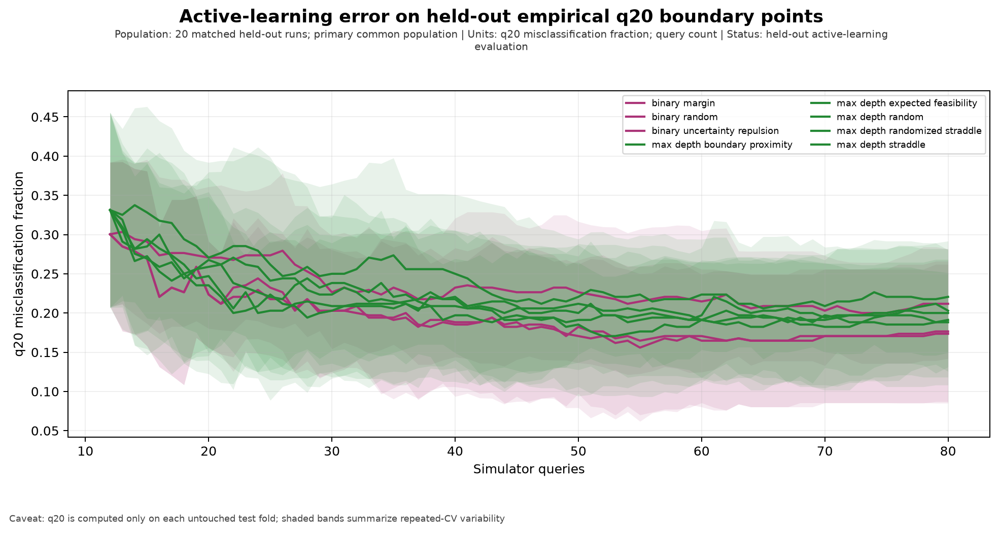

**What did we observe?** The q20 summary contains 19,288 method-budget rows on the common total-query scale.

**Does it support Binary or Max-Depth?** Lower matched q20 error and lower q20 AULC support the corresponding formulation; disagreement across methods/runs must remain visible.

**Does it say anything specifically about the boundary?** Directly—only the lowest-distance 20% empirical boundary subset is scored.

**What remains uncertain?** q20 is still an observed-data proxy and may be sensitive to sparse cross-label neighbours.

In [24]:
curves = load_csv("active_learning_curve_summary.csv")
metric_col = pick(curves, "metric", "metric_name")
if metric_col is not None:
    q20_curves = curves[curves[metric_col].astype(str).str.casefold().str.contains("q20")]
else:
    q20_error_col = pick(curves, "q20_error", required=True)
    q20_curves = curves.loc[curves[q20_error_col].notna(), [
        c for c in ["benchmark_population", "run_id", "method", "formulation", "budget",
                    q20_error_col, "q20_count", "q20_keyhole_count"] if c in curves.columns
    ]]
display(q20_curves)
show_figures("q20_active_learning", "q20_learning_curve", limit=2)
explain(
    observed=f"The q20 summary contains {len(q20_curves):,} method-budget rows on the common total-query scale.",
    support="Lower matched q20 error and lower q20 AULC support the corresponding formulation; disagreement across methods/runs must remain visible.",
    boundary="Directly—only the lowest-distance 20% empirical boundary subset is scored.",
    uncertain="q20 is still an observed-data proxy and may be sensitive to sparse cross-label neighbours.",
)

## 22. Full active-learning q30 curves

**What are we doing?** Plot and tabulate q30 empirical-boundary error over the same simulator-query budgets.

**Why are we doing it?** q30 is a broader, usually more stable companion to the primary q20 view.

**How does this connect to the thesis?** Consistent q20 and q30 gains are stronger evidence than a narrow-subset win alone.

**What data is allowed here?** The same untouched test predictions and fixed evaluation-only q30 membership.

**What would count as leakage?** Any query rule conditioned on q30 membership or performance.

**What would be a misleading interpretation?** Treating q30 as independent evidence from q20 or overlooking reversed rankings between them.

,benchmark_population,run_id,method,formulation,budget,q30_error,q30_count,q30_keyhole_count
0,primary_common,primary_common__r01_f01,max_depth_random,max_depth,12,0.320,25,9
1,primary_common,primary_common__r01_f01,max_depth_random,max_depth,13,0.320,25,9
2,primary_common,primary_common__r01_f01,max_depth_random,max_depth,14,0.240,25,9
3,primary_common,primary_common__r01_f01,max_depth_random,max_depth,15,0.160,25,9
4,primary_common,primary_common__r01_f01,max_depth_random,max_depth,16,0.160,25,9
...,...,...,...,...,...,...,...,...
19283,secondary_g3_common,secondary_g3_common__r04_f05,binary_g3_common_margin,binary,76,0.125,24,8
19284,secondary_g3_common,secondary_g3_common__r04_f05,binary_g3_common_margin,binary,77,0.125,24,8
19285,secondary_g3_common,secondary_g3_common__r04_f05,binary_g3_common_margin,binary,78,0.125,24,8
19286,secondary_g3_common,secondary_g3_common__r04_f05,binary_g3_common_margin,binary,79,0.125,24,8


outputs\week7_06_real_data_boundary_active_level_set\figures\37_q30_active_learning_curves.png


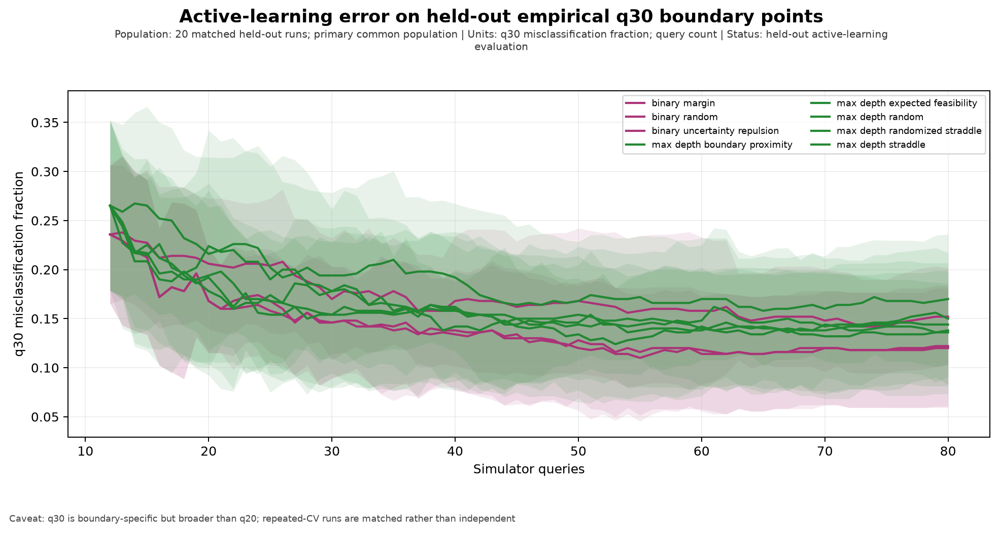

**What did we observe?** The q30 summary contains 19,288 method-budget rows on the identical matched trajectories.

**Does it support Binary or Max-Depth?** A formulation is stronger when q30 corroborates its q20 learning-curve advantage; conflict implies a mixed conclusion.

**Does it say anything specifically about the boundary?** Directly—the broader near-transition subset tests whether any q20 gain generalizes beyond the closest points.

**What remains uncertain?** The two subsets overlap and therefore should not be counted as independent experiments.

In [25]:
if metric_col is not None:
    q30_curves = curves[curves[metric_col].astype(str).str.casefold().str.contains("q30")]
else:
    q30_error_col = pick(curves, "q30_error", required=True)
    q30_curves = curves.loc[curves[q30_error_col].notna(), [
        c for c in ["benchmark_population", "run_id", "method", "formulation", "budget",
                    q30_error_col, "q30_count", "q30_keyhole_count"] if c in curves.columns
    ]]
display(q30_curves)
show_figures("q30_active_learning", "q30_learning_curve", limit=2)
explain(
    observed=f"The q30 summary contains {len(q30_curves):,} method-budget rows on the identical matched trajectories.",
    support="A formulation is stronger when q30 corroborates its q20 learning-curve advantage; conflict implies a mixed conclusion.",
    boundary="Directly—the broader near-transition subset tests whether any q20 gain generalizes beyond the closest points.",
    uncertain="The two subsets overlap and therefore should not be counted as independent experiments.",
)

## 23. Balanced-accuracy learning curves

**What are we doing?** Compare class-balanced held-out accuracy at every recorded total-query budget.

**Why are we doing it?** Global class imbalance makes ordinary accuracy unsuitable, while balanced accuracy checks whole-domain usefulness.

**How does this connect to the thesis?** A useful boundary learner should not improve q20/q30 by catastrophically sacrificing one manual class elsewhere.

**What data is allowed here?** Untouched test predictions and labels after each fit.

**What would count as leakage?** Tuning acquisitions or stopping budgets from test balanced accuracy.

**What would be a misleading interpretation?** Ranking methods on balanced accuracy alone when the thesis prioritizes q20/q30 boundary learning.

,benchmark_population,run_id,method,formulation,budget,balanced_accuracy,sensitivity,specificity
0,primary_common,primary_common__r01_f01,max_depth_random,max_depth,12,0.533333,0.066667,1.000000
1,primary_common,primary_common__r01_f01,max_depth_random,max_depth,13,0.533333,0.066667,1.000000
2,primary_common,primary_common__r01_f01,max_depth_random,max_depth,14,0.600000,0.200000,1.000000
3,primary_common,primary_common__r01_f01,max_depth_random,max_depth,15,0.733333,0.466667,1.000000
4,primary_common,primary_common__r01_f01,max_depth_random,max_depth,16,0.877273,0.800000,0.954545
...,...,...,...,...,...,...,...,...
19283,secondary_g3_common,secondary_g3_common__r04_f05,binary_g3_common_margin,binary,76,0.949134,0.928571,0.969697
19284,secondary_g3_common,secondary_g3_common__r04_f05,binary_g3_common_margin,binary,77,0.949134,0.928571,0.969697
19285,secondary_g3_common,secondary_g3_common__r04_f05,binary_g3_common_margin,binary,78,0.949134,0.928571,0.969697
19286,secondary_g3_common,secondary_g3_common__r04_f05,binary_g3_common_margin,binary,79,0.949134,0.928571,0.969697


outputs\week7_06_real_data_boundary_active_level_set\figures\38_balanced_accuracy_learning_curves.png


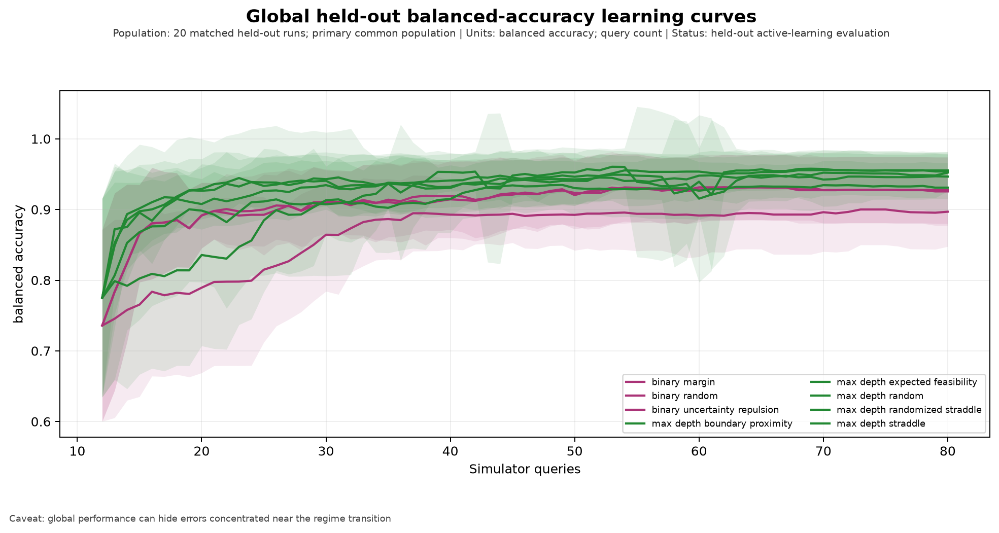

**What did we observe?** The balanced-accuracy table contains 19,288 matched method-budget summaries alongside the boundary curves.

**Does it support Binary or Max-Depth?** Higher AULC supports a formulation globally, but the primary hierarchy still gives q20 and q30 precedence.

**Does it say anything specifically about the boundary?** Only indirectly—it verifies both sides of the class transition across the full held-out domain.

**What remains uncertain?** Balanced accuracy does not encode probability calibration or distance from the observed boundary.

In [26]:
if metric_col is not None:
    ba_curves = curves[curves[metric_col].astype(str).str.casefold().isin({"balanced_accuracy", "balanced accuracy", "ba"})]
else:
    ba_col = pick(curves, "balanced_accuracy", required=True)
    ba_curves = curves.loc[curves[ba_col].notna(), [
        c for c in ["benchmark_population", "run_id", "method", "formulation", "budget", ba_col,
                    "sensitivity", "specificity"] if c in curves.columns
    ]]
display(ba_curves)
show_figures("balanced_accuracy_learning", limit=2)
explain(
    observed=f"The balanced-accuracy table contains {len(ba_curves):,} matched method-budget summaries alongside the boundary curves.",
    support="Higher AULC supports a formulation globally, but the primary hierarchy still gives q20 and q30 precedence.",
    boundary="Only indirectly—it verifies both sides of the class transition across the full held-out domain.",
    uncertain="Balanced accuracy does not encode probability calibration or distance from the observed boundary.",
)

## 24. ROC, average-precision, and Brier learning curves

**What are we doing?** Inspect discrimination and calibration metrics over budget for both probabilistic formulations.

**Why are we doing it?** A boundary method can classify well at 0.5 yet produce poorly calibrated probabilities, or vice versa.

**How does this connect to the thesis?** These are supporting diagnostics for probabilistic level-set decisions, not the primary ranking criteria.

**What data is allowed here?** Untouched test probabilities and labels at recorded budgets.

**What would count as leakage?** Using test calibration to alter the surrogate or tau online.

**What would be a misleading interpretation?** Claiming one excellent ROC AUC settles the Binary-versus-Max-Depth question.

,benchmark_population,run_id,method,formulation,budget,roc_auc,average_precision,brier_score
0,primary_common,primary_common__r01_f01,max_depth_random,max_depth,12,0.984848,0.901815,0.103506
1,primary_common,primary_common__r01_f01,max_depth_random,max_depth,13,0.983838,0.897419,0.106461
2,primary_common,primary_common__r01_f01,max_depth_random,max_depth,14,0.997980,0.992157,0.073820
3,primary_common,primary_common__r01_f01,max_depth_random,max_depth,15,0.995960,0.985965,0.052590
4,primary_common,primary_common__r01_f01,max_depth_random,max_depth,16,0.951515,0.742060,0.092285
...,...,...,...,...,...,...,...,...
19283,secondary_g3_common,secondary_g3_common__r04_f05,binary_g3_common_margin,binary,76,0.997835,0.991071,0.014217
19284,secondary_g3_common,secondary_g3_common__r04_f05,binary_g3_common_margin,binary,77,0.997835,0.991071,0.014210
19285,secondary_g3_common,secondary_g3_common__r04_f05,binary_g3_common_margin,binary,78,0.997835,0.991071,0.014200
19286,secondary_g3_common,secondary_g3_common__r04_f05,binary_g3_common_margin,binary,79,0.997835,0.991071,0.014147


outputs\week7_06_real_data_boundary_active_level_set\figures\39_roc_auc_learning_curves.png


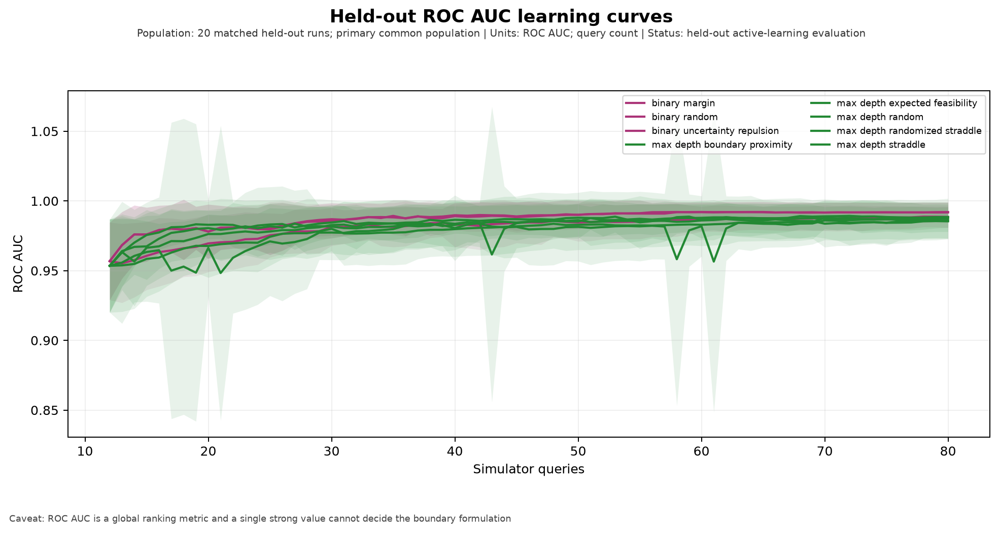

outputs\week7_06_real_data_boundary_active_level_set\figures\40_average_precision_learning_curves.png


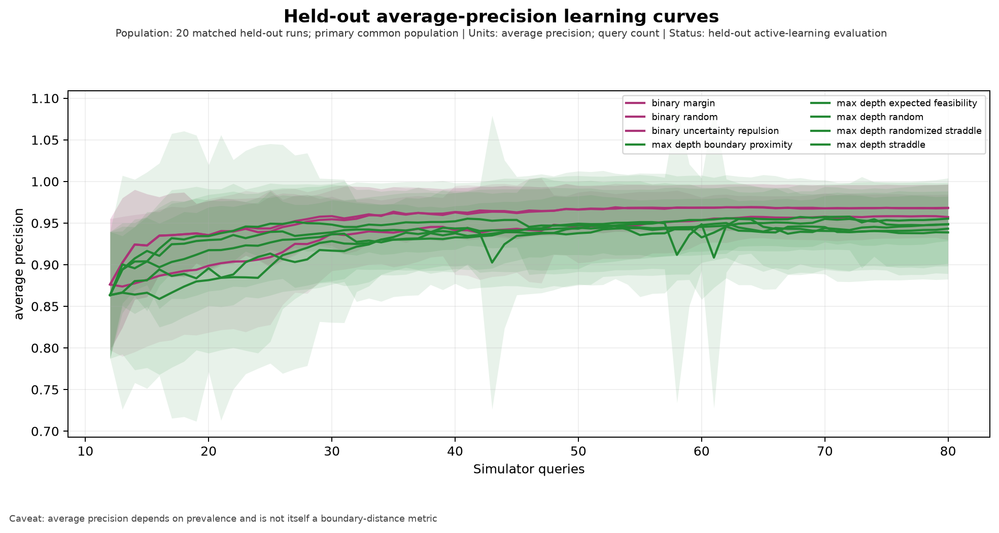

outputs\week7_06_real_data_boundary_active_level_set\figures\41_brier_score_learning_curves.png


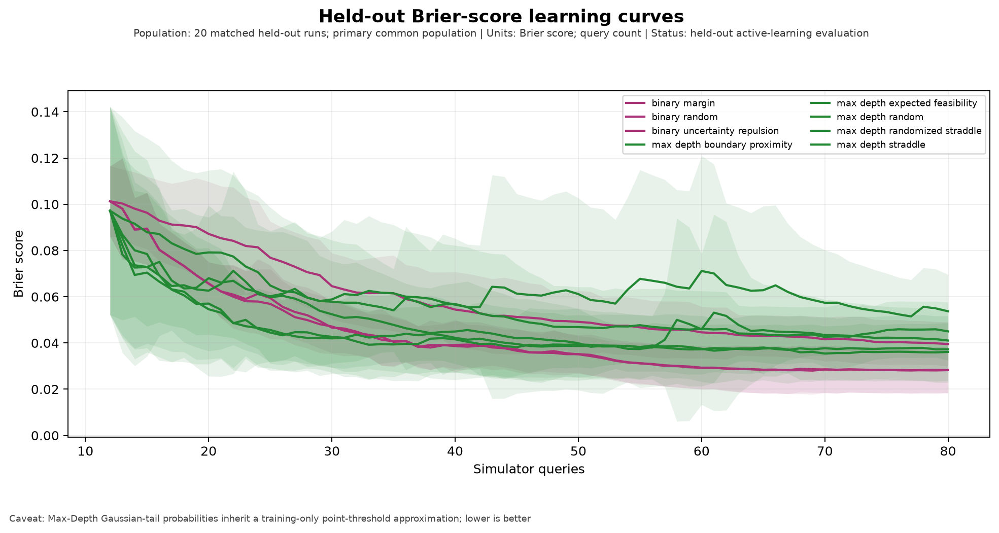

**What did we observe?** The saved curves provide 19,288 discrimination/calibration summaries across the common budget grid.

**Does it support Binary or Max-Depth?** Consistent ROC/AP gains with lower Brier score strengthen a formulation only as supporting evidence.

**Does it say anything specifically about the boundary?** These metrics are global; they do not isolate q20/q30 unless explicitly stratified.

**What remains uncertain?** Average precision depends strongly on prevalence, and repeated folds share observations.

In [27]:
if metric_col is not None:
    probability_metric_mask = curves[metric_col].astype(str).str.casefold().str.contains("roc|average_precision|average precision|brier|pr_auc")
    probability_curves = curves[probability_metric_mask]
else:
    probability_columns = [c for c in ["roc_auc", "average_precision", "brier_score", "pr_auc"] if c in curves.columns]
    if not probability_columns:
        raise KeyError("No probability metric columns found in active-learning curves")
    probability_curves = curves.loc[curves[probability_columns].notna().any(axis=1), [
        c for c in ["benchmark_population", "run_id", "method", "formulation", "budget", *probability_columns]
        if c in curves.columns
    ]]
display(probability_curves)
show_figures("roc_auc_learning", "average_precision_learning", "brier_score_learning", limit=3)
explain(
    observed=f"The saved curves provide {len(probability_curves):,} discrimination/calibration summaries across the common budget grid.",
    support="Consistent ROC/AP gains with lower Brier score strengthen a formulation only as supporting evidence.",
    boundary="These metrics are global; they do not isolate q20/q30 unless explicitly stratified.",
    uncertain="Average precision depends strongly on prevalence, and repeated folds share observations.",
)

## 25. Query-to-boundary diagnostics

**What are we doing?** Measure the empirical boundary distance of each already-selected query and summarize it over budget.

**Why are we doing it?** This reveals whether acquisitions actually concentrate near observed cross-label transitions.

**How does this connect to the thesis?** Boundary-focused query placement is the mechanism expected to improve sample efficiency.

**What data is allowed here?** The precomputed empirical distance may be joined only after a query has been selected.

**What would count as leakage?** Using true distance to rank unqueried candidates or to break acquisition ties.

**What would be a misleading interpretation?** Assuming every near-boundary query is useful or that a 2D projection captures 4D proximity.

query_boundary_distance_summary.csv: 280 rows × 8 columns


,benchmark_population,run_id,method,formulation,mean_query_boundary_distance,median_query_boundary_distance,minimum_query_boundary_distance,query_count
0,primary_common,primary_common__r01_f01,binary_margin,binary,0.965444,0.845426,0.170532,80
1,primary_common,primary_common__r01_f01,binary_random,binary,1.445068,1.375138,0.404099,80
2,primary_common,primary_common__r01_f01,binary_uncertainty_repulsion,binary,0.968003,0.870596,0.170532,80
3,primary_common,primary_common__r01_f01,max_depth_boundary_proximity,max_depth,1.003892,0.895658,0.170532,80
4,primary_common,primary_common__r01_f01,max_depth_expected_feasibility,max_depth,1.391719,1.241203,0.274798,80
...,...,...,...,...,...,...,...,...
275,secondary_g3_common,secondary_g3_common__r04_f05,binary_g3_common_random,binary,1.508009,1.505049,0.404099,80
276,secondary_g3_common,secondary_g3_common__r04_f05,g3_random,g3,1.508009,1.505049,0.404099,80
277,secondary_g3_common,secondary_g3_common__r04_f05,g3_straddle,g3,1.272039,1.115257,0.274798,80
278,secondary_g3_common,secondary_g3_common__r04_f05,max_depth_g3_common_random,max_depth,1.508009,1.505049,0.404099,80


outputs\week7_06_real_data_boundary_active_level_set\figures\42_acquired_true_boundary_distance_curves.png


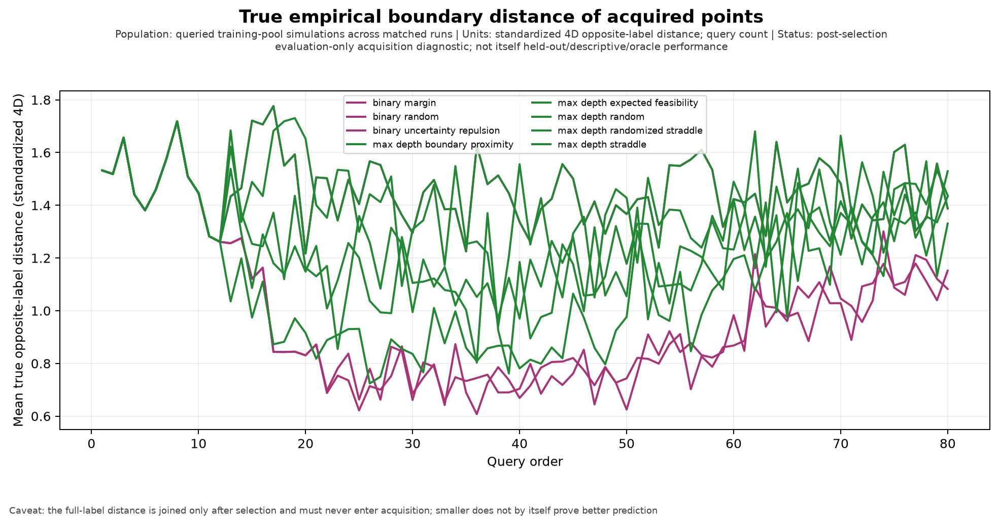

outputs\week7_06_real_data_boundary_active_level_set\figures\43_query_boundary_distance_method_summary.png


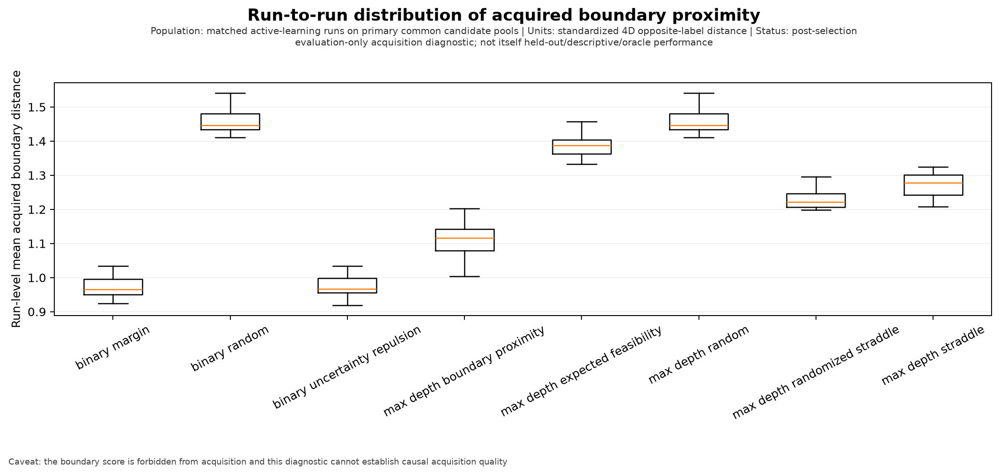

**What did we observe?** Post-selection analysis summarizes 280 method/budget boundary-distance rows without feeding those distances back into acquisition.

**Does it support Binary or Max-Depth?** A method that queries closer observed transitions may explain better q20/q30 AULC, but proximity alone is not the outcome.

**Does it say anything specifically about the boundary?** Directly—this is a mechanism diagnostic based on the fixed empirical boundary reference.

**What remains uncertain?** Some far queries can be valuable for global surrogate calibration, and the empirical score inherits sampling-density bias.

In [28]:
query_distance = load_csv("query_boundary_distance_summary.csv")
display(query_distance)
distance_query_col = pick(query_history, "empirical_boundary_distance", "boundary_distance", "selected_boundary_distance")
if distance_query_col:
    display(query_history.groupby(method_h)[distance_query_col].agg(["count", "mean", "median", "min", "max"]).sort_values("median"))
show_figures("acquired_true_boundary_distance", "query_boundary_distance", limit=2)
explain(
    observed=f"Post-selection analysis summarizes {len(query_distance):,} method/budget boundary-distance rows without feeding those distances back into acquisition.",
    support="A method that queries closer observed transitions may explain better q20/q30 AULC, but proximity alone is not the outcome.",
    boundary="Directly—this is a mechanism diagnostic based on the fixed empirical boundary reference.",
    uncertain="Some far queries can be valuable for global surrogate calibration, and the empirical score inherits sampling-density bias.",
)

## 26. Threshold trajectories

**What are we doing?** Plot tau, queried class counts, gap/overlap, and bootstrap intervals for Max-Depth and G3 over budget.

**Why are we doing it?** A continuous acquisition can fail early if its training-only boundary threshold is unstable.

**How does this connect to the thesis?** Threshold learning is part of the simulator-query cost and must not be replaced by a full-data oracle.

**What data is allowed here?** Queried responses/labels for online tau; bootstrap is diagnostic at selected checkpoints only.

**What would count as leakage?** Any test or unqueried value in tau or its confidence interval.

**What would be a misleading interpretation?** Calling a narrow late interval proof of a universal physical threshold across domains.

online_threshold_bootstrap_summary.csv: 900 rows × 12 columns


,benchmark_population,run_id,repeat,fold,method,formulation,budget,threshold,balanced_accuracy,sensitivity,...,max_negative,min_positive,observed_gap,class_separable,queried_positive_count,queried_negative_count,threshold_units,training_scope,test_information_used,unqueried_pool_information_used
0,primary_common,primary_common__r01_f01,1,1,max_depth_random,max_depth,12,101.421515,1.0,1.0,...,86.94683,115.8962,28.94937,True,2,10,um,queried_only,False,False
1,primary_common,primary_common__r01_f01,1,1,max_depth_random,max_depth,13,101.421515,1.0,1.0,...,86.94683,115.8962,28.94937,True,2,11,um,queried_only,False,False
2,primary_common,primary_common__r01_f01,1,1,max_depth_random,max_depth,14,101.421515,1.0,1.0,...,86.94683,115.8962,28.94937,True,2,12,um,queried_only,False,False
3,primary_common,primary_common__r01_f01,1,1,max_depth_random,max_depth,15,101.421515,1.0,1.0,...,86.94683,115.8962,28.94937,True,2,13,um,queried_only,False,False
4,primary_common,primary_common__r01_f01,1,1,max_depth_random,max_depth,16,101.421515,1.0,1.0,...,86.94683,115.8962,28.94937,True,3,13,um,queried_only,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12395,secondary_g3_common,secondary_g3_common__r04_f05,4,5,max_depth_g3_common_straddle,max_depth,76,108.601000,1.0,1.0,...,106.00380,111.1982,5.19440,True,19,57,um,queried_only,False,False
12396,secondary_g3_common,secondary_g3_common__r04_f05,4,5,max_depth_g3_common_straddle,max_depth,77,108.601000,1.0,1.0,...,106.00380,111.1982,5.19440,True,19,58,um,queried_only,False,False
12397,secondary_g3_common,secondary_g3_common__r04_f05,4,5,max_depth_g3_common_straddle,max_depth,78,108.601000,1.0,1.0,...,106.00380,111.1982,5.19440,True,19,59,um,queried_only,False,False
12398,secondary_g3_common,secondary_g3_common__r04_f05,4,5,max_depth_g3_common_straddle,max_depth,79,108.601000,1.0,1.0,...,106.00380,111.1982,5.19440,True,19,60,um,queried_only,False,False


,benchmark_population,run_id,method,formulation,budget,selected_set_diagnostic_only,bootstrap_resamples,valid_resamples,ci_low,median,ci_high,status
0,primary_common,primary_common__r01_f01,max_depth_random,max_depth,12,True,1000,1000,95.164035,101.421515,103.011015,PASS
1,primary_common,primary_common__r01_f01,max_depth_random,max_depth,20,True,1000,1000,95.164035,101.421515,193.463740,PASS
2,primary_common,primary_common__r01_f01,max_depth_random,max_depth,40,True,1000,1000,101.187850,104.965995,108.895745,PASS
3,primary_common,primary_common__r01_f01,max_depth_random,max_depth,60,True,1000,1000,99.349050,103.127195,106.555495,PASS
4,primary_common,primary_common__r01_f01,max_depth_random,max_depth,80,True,1000,1000,99.582715,105.431785,111.200335,PASS
...,...,...,...,...,...,...,...,...,...,...,...,...
895,secondary_g3_common,secondary_g3_common__r04_f05,max_depth_g3_common_straddle,max_depth,12,True,1000,0,NaN,NaN,NaN,NA_fewer_than_two_per_class
896,secondary_g3_common,secondary_g3_common__r04_f05,max_depth_g3_common_straddle,max_depth,20,True,1000,1000,124.473985,131.724300,169.971200,PASS
897,secondary_g3_common,secondary_g3_common__r04_f05,max_depth_g3_common_straddle,max_depth,40,True,1000,1000,106.888795,112.575900,114.879750,PASS
898,secondary_g3_common,secondary_g3_common__r04_f05,max_depth_g3_common_straddle,max_depth,60,True,1000,1000,103.308590,108.601000,112.948500,PASS


,checkpoints,tau_min,tau_median,tau_max
method,,,,
g3_random,69,74.542563,102.261713,193.851765
g3_straddle,69,74.542563,100.958763,197.740600
max_depth_boundary_proximity,69,93.420975,109.111200,208.542350
max_depth_expected_feasibility,69,93.420975,112.080000,208.542350
max_depth_g3_common_random,69,89.521025,108.896485,198.437490
max_depth_g3_common_straddle,69,89.521025,111.901200,207.536400
max_depth_random,69,93.420975,112.539500,211.791850
max_depth_randomized_straddle,69,93.420975,110.950000,208.542350
max_depth_straddle,69,93.420975,110.950000,208.542350


outputs\week7_06_real_data_boundary_active_level_set\figures\44_max_depth_threshold_trajectories.png


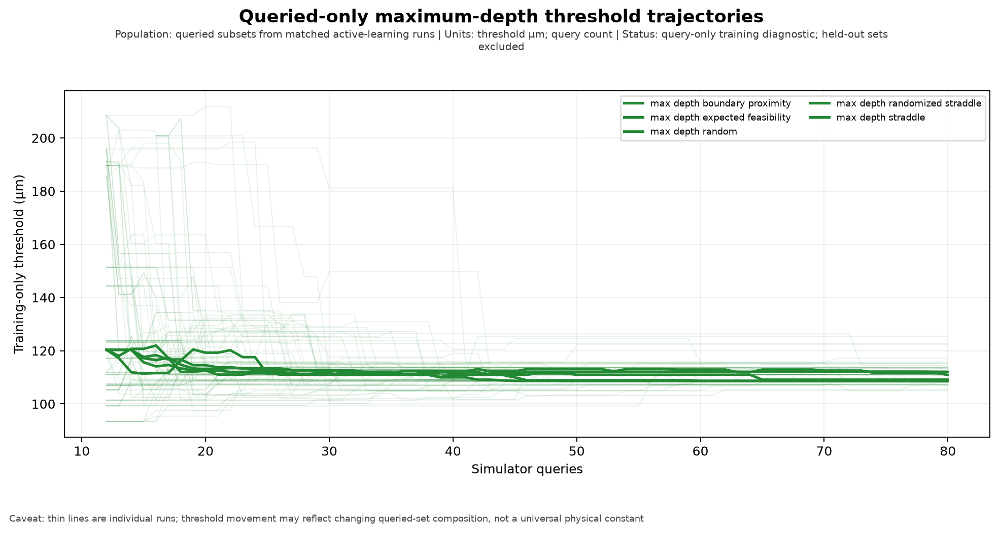

outputs\week7_06_real_data_boundary_active_level_set\figures\45_g3_threshold_trajectories.png


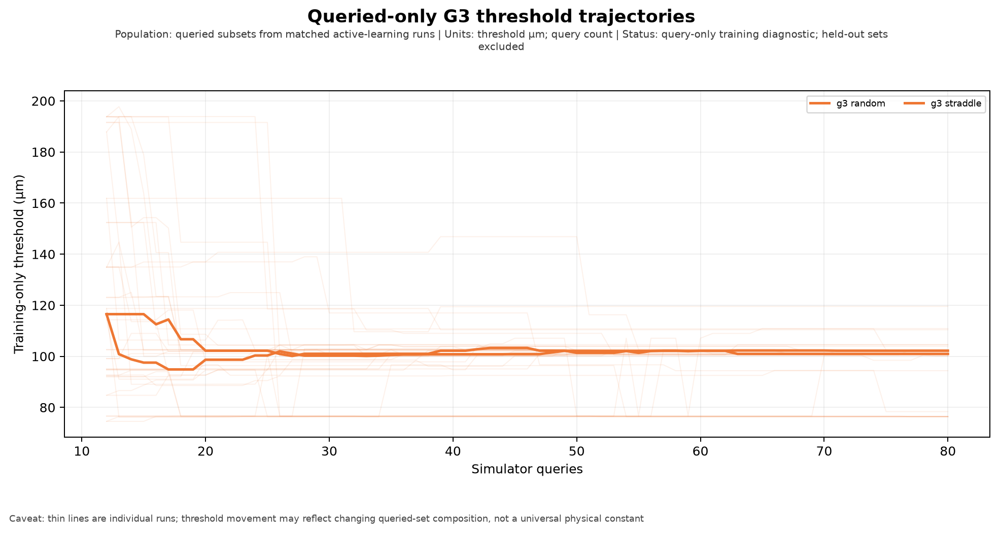

**What did we observe?** The online artifact contains 12,400 threshold checkpoints; method-wise tau ranges and bootstrap diagnostics are visible above.

**Does it support Binary or Max-Depth?** Faster, more stable Max-Depth tau supports its active formulation; materially larger G3 movement would reinforce its secondary status.

**Does it say anything specifically about the boundary?** Directly—tau is the scalar level defining each continuous estimated boundary.

**What remains uncertain?** Stability can reflect repeatedly sampling one local region rather than universal transferability.

In [29]:
threshold_bootstrap = load_csv("online_threshold_bootstrap_summary.csv")
display(threshold_history)
display(threshold_bootstrap)
tau_col = pick(threshold_history, "tau", "threshold", "selected_threshold", "training_selected_threshold", required=True)
threshold_method_col = pick(threshold_history, "method", "method_id", required=True)
threshold_budget_col = pick(threshold_history, "budget", "query_budget", required=True)
trajectory_spread = threshold_history.groupby(threshold_method_col).agg(
    checkpoints=(threshold_budget_col, "nunique"),
    tau_min=(tau_col, "min"), tau_median=(tau_col, "median"), tau_max=(tau_col, "max"),
)
display(trajectory_spread)
show_figures("max_depth_threshold_trajectories", "g3_threshold_trajectories", limit=2)
explain(
    observed=f"The online artifact contains {len(threshold_history):,} threshold checkpoints; method-wise tau ranges and bootstrap diagnostics are visible above.",
    support="Faster, more stable Max-Depth tau supports its active formulation; materially larger G3 movement would reinforce its secondary status.",
    boundary="Directly—tau is the scalar level defining each continuous estimated boundary.",
    uncertain="Stability can reflect repeatedly sampling one local region rather than universal transferability.",
)

## 27. Queries to tolerance

**What are we doing?** Report the first observed budget reaching each balanced-accuracy and q20/q30 error tolerance, preserving `not reached`.

**Why are we doing it?** This translates learning curves into an intuitive simulator-query efficiency statement.

**How does this connect to the thesis?** The thesis asks how many expensive simulations are needed, not only who is best at budget 80.

**What data is allowed here?** Observed common-range budgets only; no interpolation beyond evaluated checkpoints.

**What would count as leakage?** Choosing tolerances after seeing curves or peeking at test metrics to stop the benchmark adaptively.

**What would be a misleading interpretation?** Treating `not reached` as a numeric budget or extrapolating beyond 80 queries.

queries_to_tolerance.csv: 2,520 rows × 10 columns


,benchmark_population,run_id,method,formulation,metric,target,direction,queries_required,status,no_extrapolation
0,primary_common,primary_common__r01_f01,binary_margin,binary,balanced_accuracy,0.80,at_least,16.0,reached,True
1,primary_common,primary_common__r01_f01,binary_margin,binary,balanced_accuracy,0.85,at_least,16.0,reached,True
2,primary_common,primary_common__r01_f01,binary_margin,binary,balanced_accuracy,0.90,at_least,16.0,reached,True
3,primary_common,primary_common__r01_f01,binary_margin,binary,q20_error,0.30,at_most,16.0,reached,True
4,primary_common,primary_common__r01_f01,binary_margin,binary,q20_error,0.25,at_most,16.0,reached,True
...,...,...,...,...,...,...,...,...,...,...
2515,secondary_g3_common,secondary_g3_common__r04_f05,max_depth_g3_common_straddle,max_depth,q20_error,0.25,at_most,17.0,reached,True
2516,secondary_g3_common,secondary_g3_common__r04_f05,max_depth_g3_common_straddle,max_depth,q20_error,0.20,at_most,17.0,reached,True
2517,secondary_g3_common,secondary_g3_common__r04_f05,max_depth_g3_common_straddle,max_depth,q30_error,0.30,at_most,12.0,reached,True
2518,secondary_g3_common,secondary_g3_common__r04_f05,max_depth_g3_common_straddle,max_depth,q30_error,0.25,at_most,12.0,reached,True


rows           2520
not reached     101
reached        2419
dtype: int64

outputs\week7_06_real_data_boundary_active_level_set\figures\51_queries_to_tolerance_comparison.png


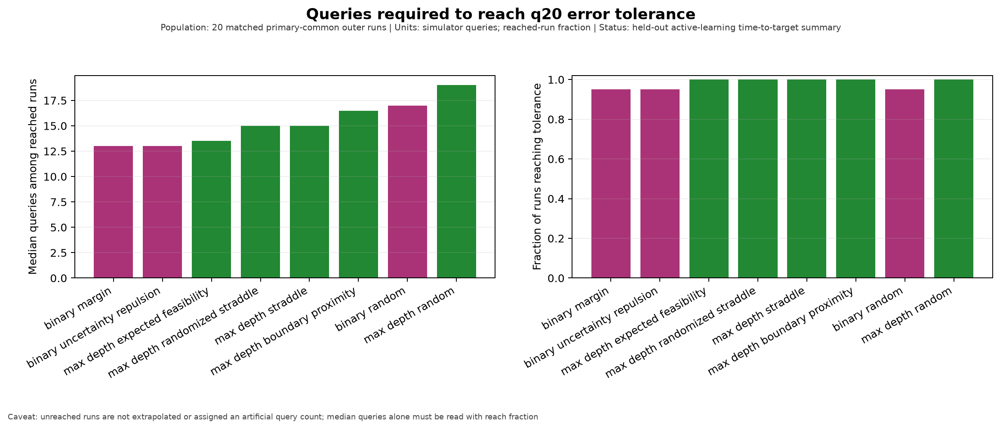

**What did we observe?** The tolerance artifact contains 2,520 predeclared method/metric targets, with unreached thresholds retained explicitly rather than extrapolated.

**Does it support Binary or Max-Depth?** Fewer observed queries to q20/q30 tolerances support a formulation, provided the paired AULC evidence agrees.

**Does it say anything specifically about the boundary?** q20/q30 tolerances are boundary-specific; balanced-accuracy tolerances provide global context.

**What remains uncertain?** First crossing can be noisy when learning curves are nonmonotone, so AULC remains the more stable primary summary.

In [30]:
tolerances = load_csv("queries_to_tolerance.csv")
display(tolerances)
query_col = pick(tolerances, "queries_required", "first_budget", "budget_reached")
if query_col:
    not_reached = tolerances[query_col].isna() | tolerances[query_col].astype(str).str.casefold().str.contains("not")
    display(pd.Series({"rows": len(tolerances), "not reached": int(not_reached.sum()), "reached": int((~not_reached).sum())}))
show_figures("queries_to_tolerance", limit=1)
explain(
    observed=f"The tolerance artifact contains {len(tolerances):,} predeclared method/metric targets, with unreached thresholds retained explicitly rather than extrapolated.",
    support="Fewer observed queries to q20/q30 tolerances support a formulation, provided the paired AULC evidence agrees.",
    boundary="q20/q30 tolerances are boundary-specific; balanced-accuracy tolerances provide global context.",
    uncertain="First crossing can be noisy when learning curves are nonmonotone, so AULC remains the more stable primary summary.",
)

## 28. Paired AULC comparisons

**What are we doing?** Display per-run AULCs, paired method differences, and 5,000-resample descriptive intervals on the common budget range.

**Why are we doing it?** Area under the learning curve uses the whole trajectory and matched runs reduce irrelevant split variation.

**How does this connect to the thesis?** The primary ranking hierarchy starts with q20 AULC, then q30, then balanced-accuracy AULC.

**What data is allowed here?** Per-run matched summaries and deterministic run-level bootstrap results.

**What would count as leakage?** Selecting the best method on unpaired pooled rows or changing the ranking hierarchy after seeing intervals.

**What would be a misleading interpretation?** Treating overlapping repeated-CV runs as independent trials or forcing a winner when metrics disagree.

active_learning_aulc_summary.csv: 280 rows × 13 columns
active_paired_method_comparisons.csv: 27 rows × 10 columns
active_paired_bootstrap_intervals.csv: 27 rows × 15 columns


,benchmark_population,run_id,method,formulation,available_start_budget,common_start_budget,final_budget,common_normalized_aulc__q20_error,warm_relative_normalized_aulc__q20_error,common_normalized_aulc__q30_error,warm_relative_normalized_aulc__q30_error,common_normalized_aulc__balanced_accuracy,warm_relative_normalized_aulc__balanced_accuracy
0,primary_common,primary_common__r01_f01,binary_margin,binary,12,16,80,0.150276,0.164792,0.102813,0.114118,0.948130,0.928877
1,primary_common,primary_common__r01_f01,binary_random,binary,12,16,80,0.111213,0.129758,0.078750,0.093235,0.957801,0.934057
2,primary_common,primary_common__r01_f01,binary_uncertainty_repulsion,binary,12,16,80,0.141085,0.156142,0.096562,0.108235,0.949313,0.929991
3,primary_common,primary_common__r01_f01,max_depth_boundary_proximity,max_depth,12,16,80,0.160386,0.160900,0.110312,0.111471,0.944886,0.938402
4,primary_common,primary_common__r01_f01,max_depth_expected_feasibility,max_depth,12,16,80,0.168658,0.167820,0.114687,0.114412,0.925178,0.923373
...,...,...,...,...,...,...,...,...,...,...,...,...,...
275,secondary_g3_common,secondary_g3_common__r04_f05,binary_g3_common_random,binary,12,12,80,0.202665,0.202665,0.135110,0.135110,0.866334,0.866334
276,secondary_g3_common,secondary_g3_common__r04_f05,g3_random,g3,12,12,80,0.181985,0.181985,0.123775,0.123775,0.932160,0.932160
277,secondary_g3_common,secondary_g3_common__r04_f05,g3_straddle,g3,12,12,80,0.165901,0.165901,0.110600,0.110600,0.968233,0.968233
278,secondary_g3_common,secondary_g3_common__r04_f05,max_depth_g3_common_random,max_depth,12,12,80,0.186581,0.186581,0.124387,0.124387,0.931556,0.931556


,comparison,method_a,method_b,metric,paired_run_count,mean_paired_difference_a_minus_b,median_paired_difference_a_minus_b,repeat_block_mean_differences_json,uncertainty_interpretation,selection_status
0,best_vs_best_descriptive,max_depth_straddle,binary_uncertainty_repulsion,common_normalized_aulc__q20_error,20,0.019049,0.030561,"{""1"": 0.02215073529411764, ""2"": 0.033455882352...",descriptive_repeated_CV_runs_not_independent,post_selection_descriptive
1,best_vs_best_descriptive,max_depth_straddle,binary_uncertainty_repulsion,common_normalized_aulc__q30_error,20,0.017422,0.014063,"{""1"": 0.015312500000000015, ""2"": 0.02737499999...",descriptive_repeated_CV_runs_not_independent,post_selection_descriptive
2,best_vs_best_descriptive,max_depth_straddle,binary_uncertainty_repulsion,common_normalized_aulc__balanced_accuracy,20,0.026125,0.019094,"{""1"": 0.02629366358144345, ""2"": 0.020503660673...",descriptive_repeated_CV_runs_not_independent,post_selection_descriptive
3,predeclared_straddle_vs_margin,max_depth_straddle,binary_margin,common_normalized_aulc__q20_error,20,0.017463,0.025276,"{""1"": 0.021783088235294106, ""2"": 0.03262867647...",descriptive_repeated_CV_runs_not_independent,predeclared_or_baseline
4,predeclared_straddle_vs_margin,max_depth_straddle,binary_margin,common_normalized_aulc__q30_error,20,0.016219,0.015469,"{""1"": 0.014937500000000006, ""2"": 0.02681249999...",descriptive_repeated_CV_runs_not_independent,predeclared_or_baseline
5,predeclared_straddle_vs_margin,max_depth_straddle,binary_margin,common_normalized_aulc__balanced_accuracy,20,0.025801,0.018377,"{""1"": 0.024477389836531582, ""2"": 0.02045885123...",descriptive_repeated_CV_runs_not_independent,predeclared_or_baseline
6,predeclared_randomized_vs_repulsion,max_depth_randomized_straddle,binary_uncertainty_repulsion,common_normalized_aulc__q20_error,20,0.019210,0.030101,"{""1"": 0.01231617647058822, ""2"": 0.052481617647...",descriptive_repeated_CV_runs_not_independent,predeclared_or_baseline
7,predeclared_randomized_vs_repulsion,max_depth_randomized_straddle,binary_uncertainty_repulsion,common_normalized_aulc__q30_error,20,0.021328,0.028906,"{""1"": 0.020312500000000032, ""2"": 0.03993749999...",descriptive_repeated_CV_runs_not_independent,predeclared_or_baseline
8,predeclared_randomized_vs_repulsion,max_depth_randomized_straddle,binary_uncertainty_repulsion,common_normalized_aulc__balanced_accuracy,20,0.023318,0.016652,"{""1"": 0.020641269100923964, ""2"": 0.02235720242...",descriptive_repeated_CV_runs_not_independent,predeclared_or_baseline
9,active_vs_shared_random__binary_margin,binary_margin,binary_random,common_normalized_aulc__q20_error,20,-0.041108,-0.043199,"{""1"": -0.04218749999999999, ""2"": -0.0658088235...",descriptive_repeated_CV_runs_not_independent,predeclared_or_baseline


,comparison,method_a,method_b,metric,paired_run_count,mean_paired_difference_a_minus_b,median_paired_difference_a_minus_b,repeat_block_mean_differences_json,uncertainty_interpretation,selection_status,bootstrap_resamples,bootstrap_ci_low,bootstrap_median,bootstrap_ci_high,formal_hypothesis_test
0,best_vs_best_descriptive,max_depth_straddle,binary_uncertainty_repulsion,common_normalized_aulc__q20_error,20,0.019049,0.030561,"{""1"": 0.02215073529411764, ""2"": 0.033455882352...",descriptive_repeated_CV_runs_not_independent,post_selection_descriptive,5000,-0.018199,0.019600,0.054826,False
1,best_vs_best_descriptive,max_depth_straddle,binary_uncertainty_repulsion,common_normalized_aulc__q30_error,20,0.017422,0.014063,"{""1"": 0.015312500000000015, ""2"": 0.02737499999...",descriptive_repeated_CV_runs_not_independent,post_selection_descriptive,5000,-0.007564,0.017234,0.043564,False
2,best_vs_best_descriptive,max_depth_straddle,binary_uncertainty_repulsion,common_normalized_aulc__balanced_accuracy,20,0.026125,0.019094,"{""1"": 0.02629366358144345, ""2"": 0.020503660673...",descriptive_repeated_CV_runs_not_independent,post_selection_descriptive,5000,0.010666,0.025785,0.043337,False
3,predeclared_straddle_vs_margin,max_depth_straddle,binary_margin,common_normalized_aulc__q20_error,20,0.017463,0.025276,"{""1"": 0.021783088235294106, ""2"": 0.03262867647...",descriptive_repeated_CV_runs_not_independent,predeclared_or_baseline,5000,-0.018545,0.017647,0.053426,False
4,predeclared_straddle_vs_margin,max_depth_straddle,binary_margin,common_normalized_aulc__q30_error,20,0.016219,0.015469,"{""1"": 0.014937500000000006, ""2"": 0.02681249999...",descriptive_repeated_CV_runs_not_independent,predeclared_or_baseline,5000,-0.009657,0.015906,0.041735,False
5,predeclared_straddle_vs_margin,max_depth_straddle,binary_margin,common_normalized_aulc__balanced_accuracy,20,0.025801,0.018377,"{""1"": 0.024477389836531582, ""2"": 0.02045885123...",descriptive_repeated_CV_runs_not_independent,predeclared_or_baseline,5000,0.010048,0.025412,0.042998,False
6,predeclared_randomized_vs_repulsion,max_depth_randomized_straddle,binary_uncertainty_repulsion,common_normalized_aulc__q20_error,20,0.019210,0.030101,"{""1"": 0.01231617647058822, ""2"": 0.052481617647...",descriptive_repeated_CV_runs_not_independent,predeclared_or_baseline,5000,-0.013304,0.019324,0.051864,False
7,predeclared_randomized_vs_repulsion,max_depth_randomized_straddle,binary_uncertainty_repulsion,common_normalized_aulc__q30_error,20,0.021328,0.028906,"{""1"": 0.020312500000000032, ""2"": 0.03993749999...",descriptive_repeated_CV_runs_not_independent,predeclared_or_baseline,5000,-0.001578,0.021086,0.044500,False
8,predeclared_randomized_vs_repulsion,max_depth_randomized_straddle,binary_uncertainty_repulsion,common_normalized_aulc__balanced_accuracy,20,0.023318,0.016652,"{""1"": 0.020641269100923964, ""2"": 0.02235720242...",descriptive_repeated_CV_runs_not_independent,predeclared_or_baseline,5000,0.010286,0.023072,0.038114,False
9,active_vs_shared_random__binary_margin,binary_margin,binary_random,common_normalized_aulc__q20_error,20,-0.041108,-0.043199,"{""1"": -0.04218749999999999, ""2"": -0.0658088235...",descriptive_repeated_CV_runs_not_independent,predeclared_or_baseline,5000,-0.069969,-0.041234,-0.012338,False


outputs\week7_06_real_data_boundary_active_level_set\figures\47_q20_aulc_comparison.png


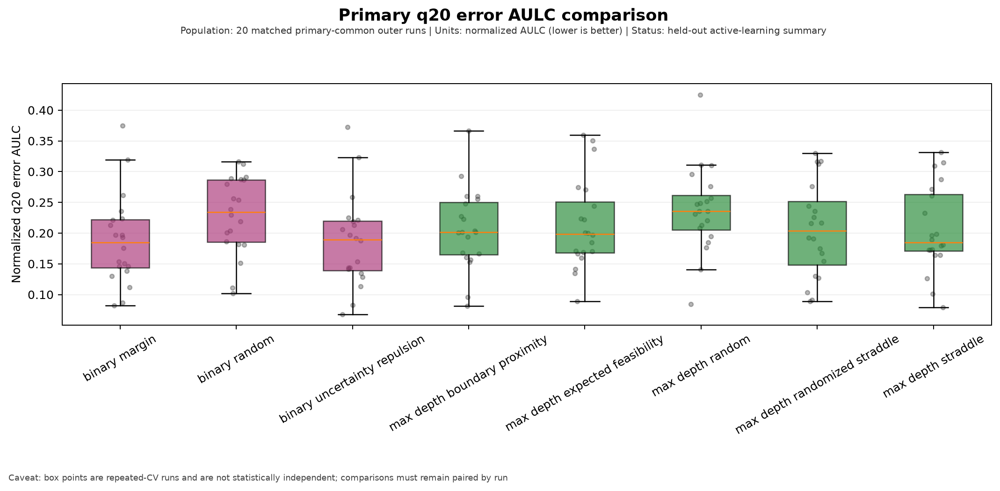

outputs\week7_06_real_data_boundary_active_level_set\figures\48_q30_aulc_comparison.png


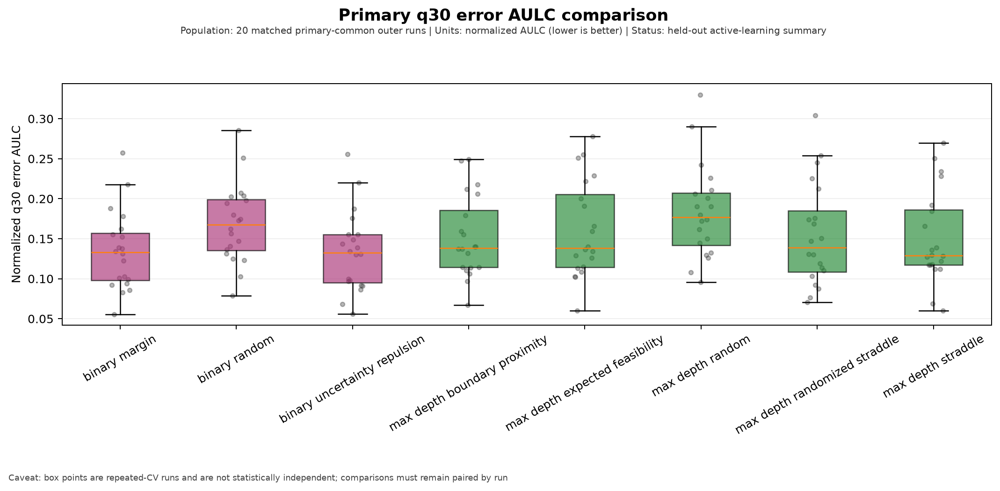

**What did we observe?** The artifacts retain 280 run-level AULCs, 27 paired contrasts, and 27 descriptive bootstrap intervals.

**Does it support Binary or Max-Depth?** Support follows the predeclared metric direction—lower q20/q30 error AULC and higher balanced-accuracy AULC—and is mixed if rankings conflict.

**Does it say anything specifically about the boundary?** q20 and q30 AULCs are the primary boundary sample-efficiency evidence.

**What remains uncertain?** Bootstrap intervals summarize run variation but do not create twenty independent physical datasets.

In [31]:
aulc = load_csv("active_learning_aulc_summary.csv")
paired = load_csv("active_paired_method_comparisons.csv")
paired_intervals = load_csv("active_paired_bootstrap_intervals.csv")
display(aulc)
display(paired)
display(paired_intervals)
resamples_col = pick(paired_intervals, "bootstrap_resamples", "n_bootstrap", "resamples")
if resamples_col:
    assert (pd.to_numeric(paired_intervals[resamples_col], errors="coerce") == 5000).all()
show_figures("aulc_comparison", "run_to_run_variability", limit=2)
explain(
    observed=f"The artifacts retain {len(aulc):,} run-level AULCs, {len(paired):,} paired contrasts, and {len(paired_intervals):,} descriptive bootstrap intervals.",
    support="Support follows the predeclared metric direction—lower q20/q30 error AULC and higher balanced-accuracy AULC—and is mixed if rankings conflict.",
    boundary="q20 and q30 AULCs are the primary boundary sample-efficiency evidence.",
    uncertain="Bootstrap intervals summarize run variation but do not create twenty independent physical datasets.",
)

## 29. Transient and persistent subgroup analysis

**What are we doing?** Compare held-out sensitivity for transient, persistent, repeated, and T0-timing Keyhole groups at important budgets.

**Why are we doing it?** Maximum depth's non-persistent definition may specifically help appearance-at-least-once transient cases.

**How does this connect to the thesis?** A subgroup mechanism can explain formulation trade-offs even when aggregate rankings are close.

**What data is allowed here?** Immutable pre-existing subgroup definitions and untouched test predictions.

**What would count as leakage?** Redefining subgroups after observing method errors or moving cases between them.

**What would be a misleading interpretation?** Claiming causal superiority from sparse subgroup counts or treating saved-frame persistence as continuous dwell time.

subgroup_transient_persistent_results.csv: 480 rows × 8 columns
subgroup_t0_timing_results.csv: 384 rows × 8 columns


,run_id,method,formulation,budget,subgroup,held_out_positive_count,sensitivity,minimum_n3_for_interpretation
0,primary_common__r01_f01,binary_margin,binary,80,transient_Keyhole,6,1.000000,True
1,primary_common__r01_f01,binary_margin,binary,80,persistent_Keyhole,9,0.888889,True
2,primary_common__r01_f01,binary_margin,binary,80,repeated_Keyhole,5,1.000000,True
3,primary_common__r01_f01,binary_random,binary,80,transient_Keyhole,6,1.000000,True
4,primary_common__r01_f01,binary_random,binary,80,persistent_Keyhole,9,0.888889,True
...,...,...,...,...,...,...,...,...
475,primary_common__r04_f05,max_depth_randomized_straddle,max_depth,80,persistent_Keyhole,10,0.900000,True
476,primary_common__r04_f05,max_depth_randomized_straddle,max_depth,80,repeated_Keyhole,2,1.000000,False
477,primary_common__r04_f05,max_depth_straddle,max_depth,80,transient_Keyhole,4,1.000000,True
478,primary_common__r04_f05,max_depth_straddle,max_depth,80,persistent_Keyhole,10,0.900000,True


,run_id,method,formulation,budget,timing_group,held_out_positive_count,sensitivity,minimum_n3_for_interpretation
0,primary_common__r01_f01,binary_margin,binary,80,before_T0,5,1.0,True
1,primary_common__r01_f01,binary_margin,binary,80,spans_multiple_T0_regions,10,0.9,True
2,primary_common__r01_f01,binary_random,binary,80,before_T0,5,1.0,True
3,primary_common__r01_f01,binary_random,binary,80,spans_multiple_T0_regions,10,0.9,True
4,primary_common__r01_f01,binary_uncertainty_repulsion,binary,80,before_T0,5,1.0,True
...,...,...,...,...,...,...,...,...
379,primary_common__r04_f05,max_depth_randomized_straddle,max_depth,80,inside_T0,2,0.5,False
380,primary_common__r04_f05,max_depth_randomized_straddle,max_depth,80,spans_multiple_T0_regions,10,1.0,True
381,primary_common__r04_f05,max_depth_straddle,max_depth,80,before_T0,2,1.0,False
382,primary_common__r04_f05,max_depth_straddle,max_depth,80,inside_T0,2,0.5,False


outputs\week7_06_real_data_boundary_active_level_set\figures\52_transient_keyhole_sensitivity.png


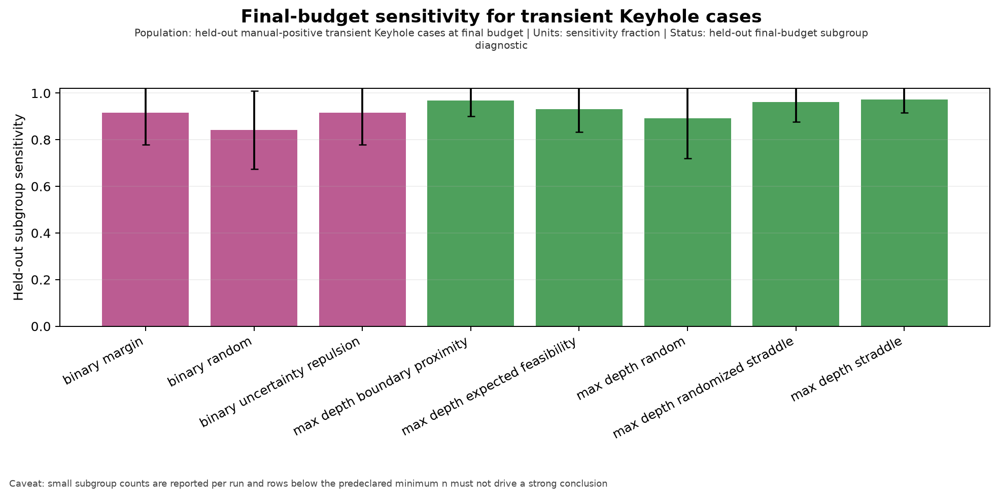

outputs\week7_06_real_data_boundary_active_level_set\figures\53_persistent_keyhole_sensitivity.png


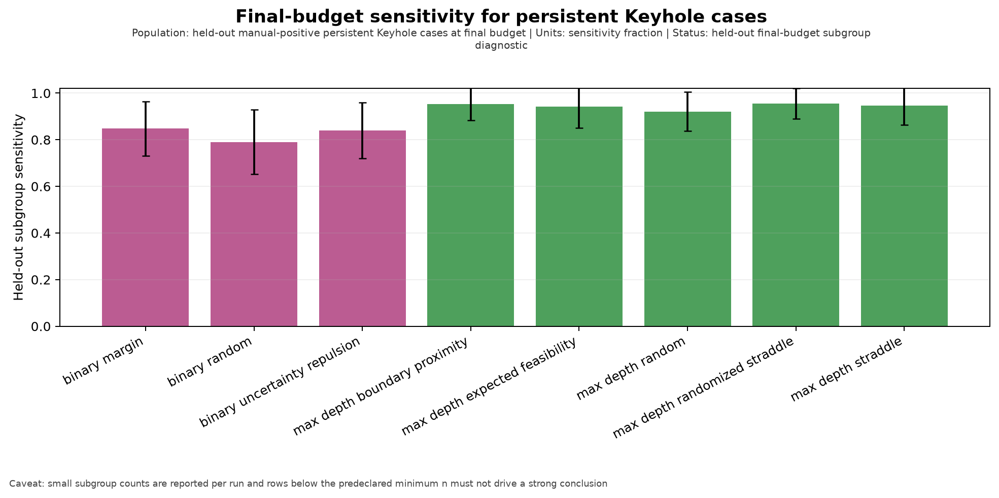

**What did we observe?** The subgroup artifacts contain 480 persistence rows and 384 T0-timing rows; sample-size fields remain visible: see table.

**Does it support Binary or Max-Depth?** A reproducible transient-sensitivity advantage would support Max-Depth's semantic motivation; persistent-only gains may favour G3 or Binary.

**Does it say anything specifically about the boundary?** Sensitivity is evaluated on held-out regime cases and can reveal where the estimated boundary misses a morphology subtype.

**What remains uncertain?** Sparse subgroups yield imprecise estimates and are secondary to matched q20/q30 results.

In [32]:
subgroup_persistence = load_csv("subgroup_transient_persistent_results.csv")
subgroup_t0 = load_csv("subgroup_t0_timing_results.csv")
display(subgroup_persistence)
display(subgroup_t0)
show_figures("transient_keyhole_sensitivity", "persistent_keyhole_sensitivity", limit=2)
count_cols = [column for column in subgroup_persistence.columns if column.casefold() in {"n", "count", "test_n", "subgroup_n"}]
explain(
    observed=f"The subgroup artifacts contain {len(subgroup_persistence):,} persistence rows and {len(subgroup_t0):,} T0-timing rows; sample-size fields remain visible: {count_cols or 'see table'}.",
    support="A reproducible transient-sensitivity advantage would support Max-Depth's semantic motivation; persistent-only gains may favour G3 or Binary.",
    boundary="Sensitivity is evaluated on held-out regime cases and can reveal where the estimated boundary misses a morphology subtype.",
    uncertain="Sparse subgroups yield imprecise estimates and are secondary to matched q20/q30 results.",
)

## 30. G3 secondary benchmark

**What are we doing?** Compare shared-random and G3-straddle results with Max-Depth using the exact three-way common population.

**Why are we doing it?** Phase 5.5 found G3 physically meaningful but more partition-sensitive than maximum depth.

**How does this connect to the thesis?** G3 tests whether persistent penetration is a better continuous level-set response for this task.

**What data is allowed here?** Training-only G3 thresholds, matched three-way population, and secondary held-out active metrics.

**What would count as leakage?** Giving G3 a different population/budget or promoting it from descriptive full-data threshold performance.

**What would be a misleading interpretation?** Claiming universal physical inferiority/superiority rather than usefulness for the manual boundary task.

g3_secondary_active_summary.csv: 2 rows × 6 columns
max_depth_vs_g3_summary.csv: 6 rows × 8 columns


,method,formulation,mean_q20_aulc,mean_q30_aulc,mean_balanced_accuracy_aulc,run_count
0,g3_random,g3,0.280281,0.220910,0.906671,20
1,g3_straddle,g3,0.254481,0.202971,0.921075,20


,method,formulation,mean_q20_aulc,mean_q30_aulc,mean_balanced_accuracy_aulc,run_count,population,comparison_status
0,binary_g3_common_margin,binary,0.178552,0.129554,0.920622,20,secondary_g3_common_404,matched_complete_case_secondary
1,binary_g3_common_random,binary,0.264530,0.192759,0.860038,20,secondary_g3_common_404,matched_complete_case_secondary
2,g3_random,g3,0.280281,0.220910,0.906671,20,secondary_g3_common_404,matched_complete_case_secondary
3,g3_straddle,g3,0.254481,0.202971,0.921075,20,secondary_g3_common_404,matched_complete_case_secondary
4,max_depth_g3_common_random,max_depth,0.282050,0.214154,0.903086,20,secondary_g3_common_404,matched_complete_case_secondary
5,max_depth_g3_common_straddle,max_depth,0.233484,0.167372,0.931939,20,secondary_g3_common_404,matched_complete_case_secondary


outputs\week7_06_real_data_boundary_active_level_set\figures\06_max_depth_vs_g3_by_manual_label.png


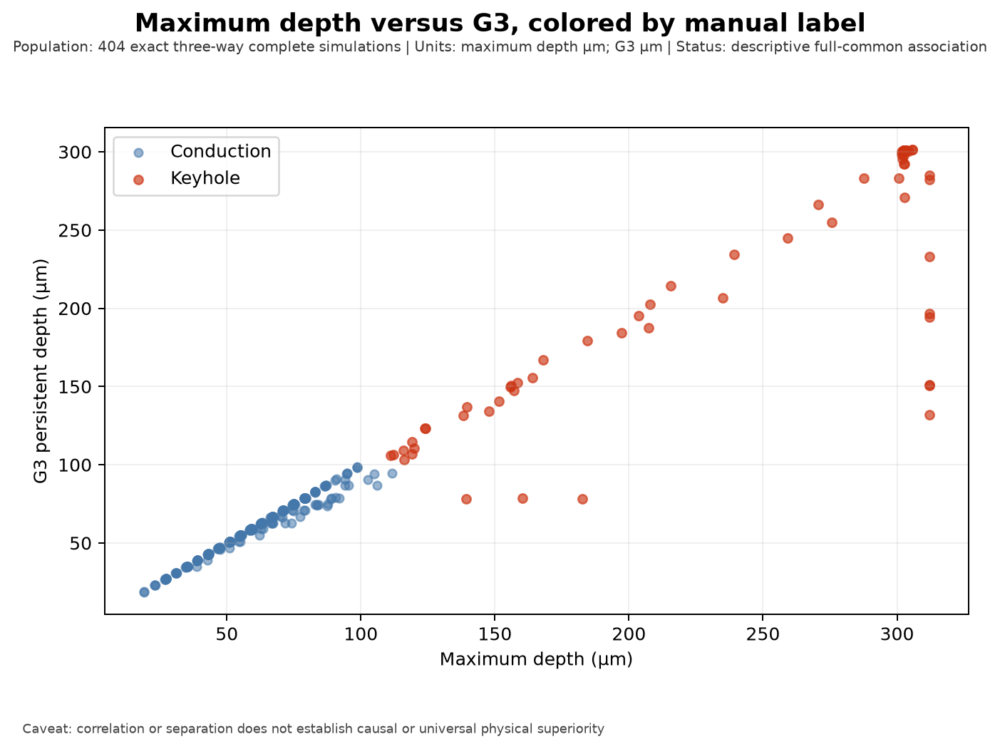

outputs\week7_06_real_data_boundary_active_level_set\figures\45_g3_threshold_trajectories.png


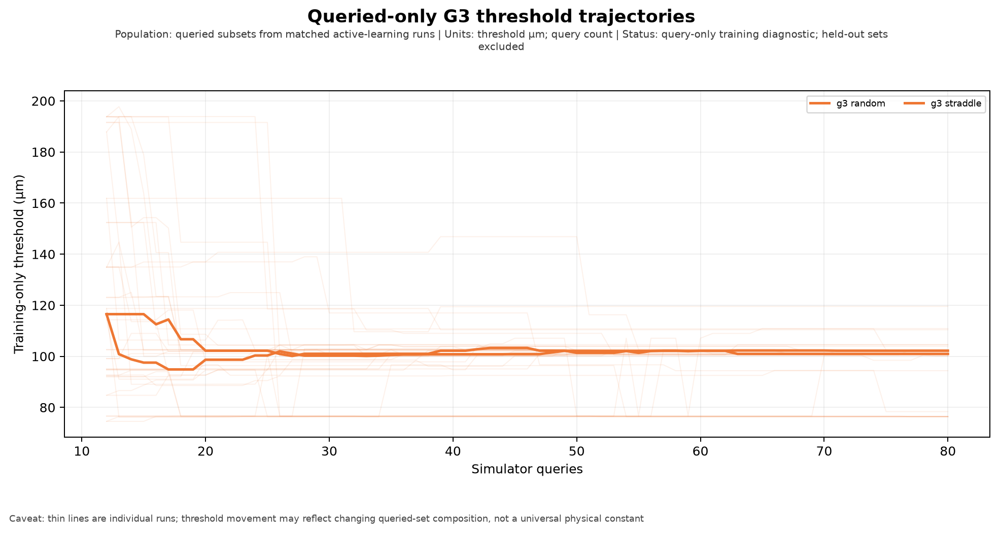

**What did we observe?** The secondary G3 benchmark contains 2 active summaries and 6 direct comparison rows on its separately reported common population.

**Does it support Binary or Max-Depth?** G3 should alter the primary narrative only if it robustly outperforms both Max-Depth and Binary across q20/q30, threshold stability, and transfer.

**Does it say anything specifically about the boundary?** Yes—G3 defines a second continuous level set, but its persistence semantics differ from appearance-at-least-once labels.

**What remains uncertain?** Population differences and threshold shift require explicit three-way matching before comparing magnitudes.

In [33]:
g3_active = load_csv("g3_secondary_active_summary.csv")
max_vs_g3 = load_csv("max_depth_vs_g3_summary.csv")
display(g3_active)
display(max_vs_g3)
show_figures("g3_threshold_trajectories", "max_depth_vs_g3", limit=2)
explain(
    observed=f"The secondary G3 benchmark contains {len(g3_active):,} active summaries and {len(max_vs_g3):,} direct comparison rows on its separately reported common population.",
    support="G3 should alter the primary narrative only if it robustly outperforms both Max-Depth and Binary across q20/q30, threshold stability, and transfer.",
    boundary="Yes—G3 defines a second continuous level set, but its persistence semantics differ from appearance-at-least-once labels.",
    uncertain="Population differences and threshold shift require explicit three-way matching before comparing magnitudes.",
)

## 31. Domain-shift robustness

**What are we doing?** Inspect secondary all-old↔new and old-local/old-remote→new static transfer for selected Binary and Max-Depth pipelines.

**Why are we doing it?** The combined-data benchmark is primary, but a useful boundary should not fail catastrophically under the known partition shift.

**How does this connect to the thesis?** This separates in-distribution sample efficiency from robustness to a changed sampled process domain.

**What data is allowed here?** Source-partition-only fitting and tau selection, followed by disjoint target-partition evaluation.

**What would count as leakage?** Learning tau, scaling, or kernels from the target partition; replacing the primary split with old/new transfer.

**What would be a misleading interpretation?** Treating tiny old-remote positive counts as a precise estimate or attributing shift causally to physics.

In [34]:
domain_transfer = load_csv("domain_transfer_model_summary.csv")
display(domain_transfer)
route_col = pick(domain_transfer, "route", "route_id", "transfer_route")
if route_col:
    display(domain_transfer.groupby(route_col).size().rename("reported_models").to_frame())
show_figures("domain_transfer_comparison", limit=2)
explain(
    observed=f"The robustness artifact reports {len(domain_transfer):,} source-to-target model rows, with source-only thresholds retained in the table.",
    support="A catastrophic transfer failure weakens the affected formulation; otherwise transfer is a caveated secondary check, not the primary winner rule.",
    boundary="q20/q30 transfer is meaningful only where the target partition provides a defensible empirical evaluation subset.",
    uncertain="Prevalence, support, and especially sparse old-remote positives make route precision unequal.",
)

domain_transfer_model_summary.csv: 8 rows × 42 columns


,route,route_status,formulation,source_partitions,target_partitions,source_count,source_keyhole_count,target_count,target_keyhole_count,source_training_threshold_um,...,q30_error,q30_count,q30_keyhole_count,mae,rmse,relative_mae,relative_rmse,r2,fit_status,kernel
0,all_old_to_new,secondary_robustness,max_depth,old-data-local;old-data-remote-clean,new-data,241,10,164,63,107.169935,...,0.500000,50,27,75.344702,124.094304,0.534465,0.880276,-0.480789,optimized_primary,"1.04**2 * Matern(length_scale=0.922, nu=1.5)"
1,all_old_to_new,secondary_robustness,binary,old-data-local;old-data-remote-clean,new-data,241,10,164,63,NaN,...,0.260000,50,27,NaN,NaN,NaN,NaN,NaN,optimized_primary,"14.9**2 * Matern(length_scale=4.49, nu=1.5)"
2,new_to_all_old,secondary_robustness,max_depth,new-data,old-data-local;old-data-remote-clean,164,63,241,10,108.601000,...,0.150685,73,10,14.770995,22.191049,0.249044,0.374149,0.342531,optimized_primary,"0.773**2 * Matern(length_scale=1, nu=1.5)"
3,new_to_all_old,secondary_robustness,binary,new-data,old-data-local;old-data-remote-clean,164,63,241,10,NaN,...,0.095890,73,10,NaN,NaN,NaN,NaN,NaN,optimized_primary,"31.6**2 * Matern(length_scale=13.8, nu=1.5)"
4,old_local_to_new,secondary_descriptive,max_depth,old-data-local,new-data,178,8,164,63,107.081280,...,0.500000,50,27,78.746310,127.793401,0.558595,0.906516,-0.570386,optimized_primary,"0.984**2 * Matern(length_scale=0.722, nu=1.5)"
5,old_local_to_new,secondary_descriptive,binary,old-data-local,new-data,178,8,164,63,NaN,...,0.160000,50,27,NaN,NaN,NaN,NaN,NaN,optimized_primary,"17.8**2 * Matern(length_scale=8.73, nu=1.5)"
6,old_remote_to_new,secondary_descriptive_tiny_positive_count,max_depth,old-data-remote-clean,new-data,63,2,164,63,123.209585,...,0.240000,50,27,38.782340,64.165431,0.275107,0.455164,0.604094,optimized_primary,"3.28**2 * Matern(length_scale=6.18, nu=1.5)"
7,old_remote_to_new,secondary_descriptive_tiny_positive_count,binary,old-data-remote-clean,new-data,63,2,164,63,NaN,...,0.320000,50,27,NaN,NaN,NaN,NaN,NaN,optimized_primary,"16.4**2 * Matern(length_scale=5.73, nu=1.5)"


,reported_models
route,
all_old_to_new,2
new_to_all_old,2
old_local_to_new,2
old_remote_to_new,2


No figure matched tokens: ('domain_transfer_comparison',)

**What did we observe?** The robustness artifact reports 8 source-to-target model rows, with source-only thresholds retained in the table.

**Does it support Binary or Max-Depth?** A catastrophic transfer failure weakens the affected formulation; otherwise transfer is a caveated secondary check, not the primary winner rule.

**Does it say anything specifically about the boundary?** q20/q30 transfer is meaningful only where the target partition provides a defensible empirical evaluation subset.

**What remains uncertain?** Prevalence, support, and especially sparse old-remote positives make route precision unequal.

## 32. Supported boundary surfaces

**What are we doing?** Display P–VX, P–LS, and VX–LS slices for Binary probability, maximum depth, overlays, and support masks.

**Why are we doing it?** Two-dimensional slices make a four-dimensional boundary interpretable while exposing extrapolation.

**How does this connect to the thesis?** These are the visual real-data level sets corresponding to `P(Keyhole)=0.5` and `D_max=tau`.

**What data is allowed here?** Selected full-training descriptive surfaces only within recorded marginal, neighbour, and convex-hull support.

**What would count as leakage?** These descriptive final surfaces do not feed held-out evaluation or acquisition.

**What would be a misleading interpretation?** Presenting unsupported grey regions or one fixed 2D context as the physical truth of the full 4D process.

boundary_surface_data.csv: 7,803 rows × 41 columns


,slice_pair,x_feature,y_feature,grid_i,grid_j,x_value_raw,y_value_raw,x_value_display,y_value_display,x_units,...,max_depth_predicted_keyhole,descriptive_full_common_threshold_um,binary_max_depth_disagreement,binary_boundary_level,max_depth_boundary_level_um,population,fit_status,held_out_performance_claim,available_to_active_method,surface_interpretation
0,P-VX,P,VX,0,0,52.544586,0.201002,52.544586,0.201002,W,...,False,108.601,False,0.5,108.601,primary_common_full,descriptive_oracle_not_held_out,False,False,supported_2d_slice_of_4d_descriptive_models
1,P-VX,P,VX,1,0,60.488942,0.201002,60.488942,0.201002,W,...,False,108.601,False,0.5,108.601,primary_common_full,descriptive_oracle_not_held_out,False,False,supported_2d_slice_of_4d_descriptive_models
2,P-VX,P,VX,2,0,68.433298,0.201002,68.433298,0.201002,W,...,False,108.601,False,0.5,108.601,primary_common_full,descriptive_oracle_not_held_out,False,False,supported_2d_slice_of_4d_descriptive_models
3,P-VX,P,VX,3,0,76.377653,0.201002,76.377653,0.201002,W,...,False,108.601,False,0.5,108.601,primary_common_full,descriptive_oracle_not_held_out,False,False,supported_2d_slice_of_4d_descriptive_models
4,P-VX,P,VX,4,0,84.322009,0.201002,84.322009,0.201002,W,...,False,108.601,False,0.5,108.601,primary_common_full,descriptive_oracle_not_held_out,False,False,supported_2d_slice_of_4d_descriptive_models
5,P-VX,P,VX,5,0,92.266365,0.201002,92.266365,0.201002,W,...,False,108.601,False,0.5,108.601,primary_common_full,descriptive_oracle_not_held_out,False,False,supported_2d_slice_of_4d_descriptive_models
6,P-VX,P,VX,6,0,100.210721,0.201002,100.210721,0.201002,W,...,False,108.601,False,0.5,108.601,primary_common_full,descriptive_oracle_not_held_out,False,False,supported_2d_slice_of_4d_descriptive_models
7,P-VX,P,VX,7,0,108.155077,0.201002,108.155077,0.201002,W,...,False,108.601,False,0.5,108.601,primary_common_full,descriptive_oracle_not_held_out,False,False,supported_2d_slice_of_4d_descriptive_models
8,P-VX,P,VX,8,0,116.099432,0.201002,116.099432,0.201002,W,...,False,108.601,False,0.5,108.601,primary_common_full,descriptive_oracle_not_held_out,False,False,supported_2d_slice_of_4d_descriptive_models
9,P-VX,P,VX,9,0,124.043788,0.201002,124.043788,0.201002,W,...,False,108.601,False,0.5,108.601,primary_common_full,descriptive_oracle_not_held_out,False,False,supported_2d_slice_of_4d_descriptive_models


,grid_rows
supported,
supported,5336
unsupported,2467


outputs\week7_06_real_data_boundary_active_level_set\figures\59_p_vx_supported_binary_boundary_slice.png


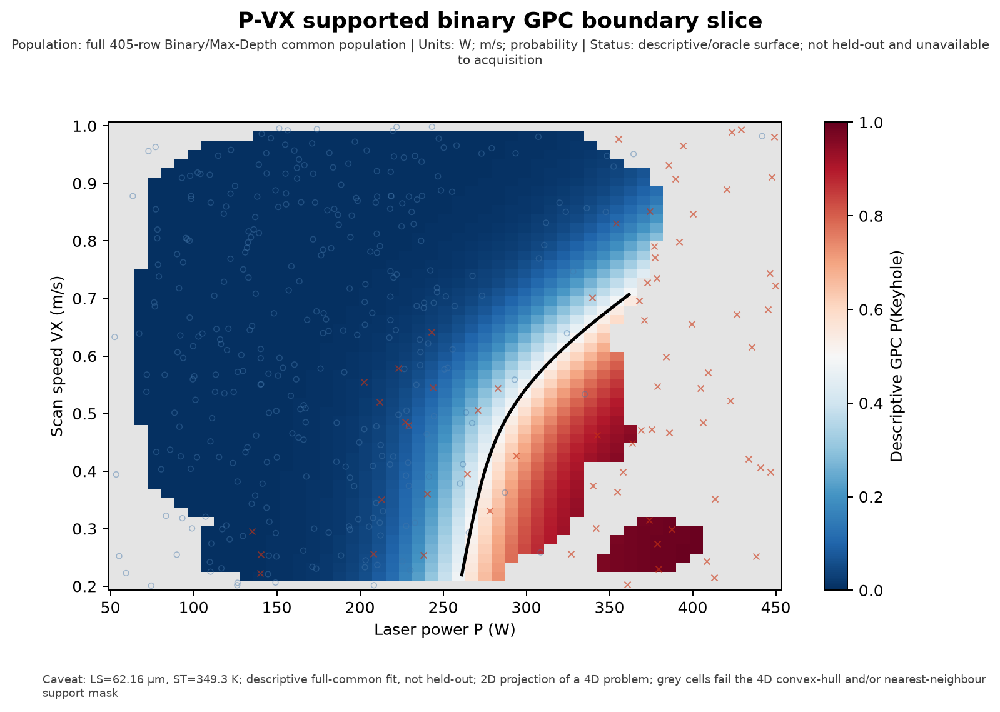

outputs\week7_06_real_data_boundary_active_level_set\figures\60_p_vx_supported_max_depth_boundary_slice.png


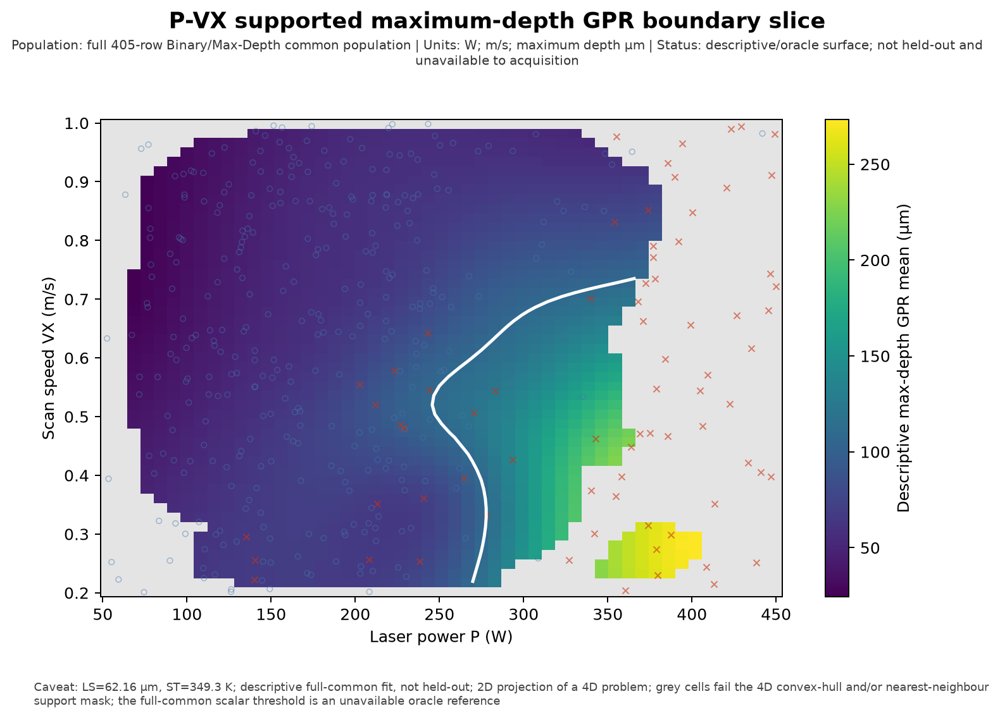

outputs\week7_06_real_data_boundary_active_level_set\figures\61_p_vx_binary_max_depth_boundary_overlay.png


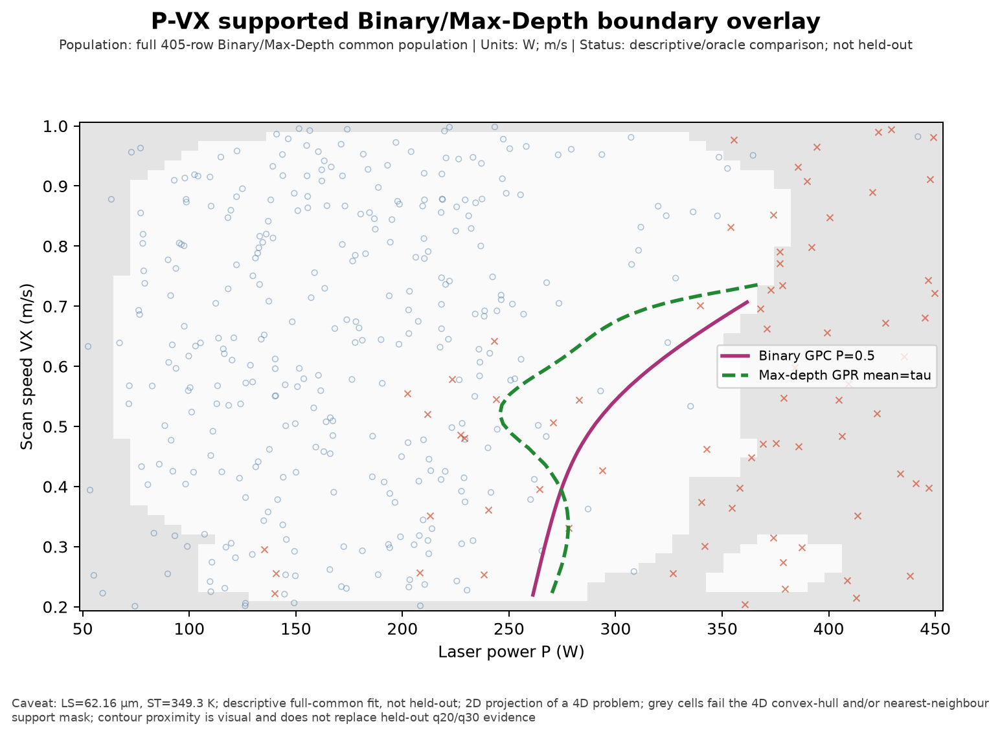

outputs\week7_06_real_data_boundary_active_level_set\figures\62_p_vx_binary_max_depth_disagreement_map.png


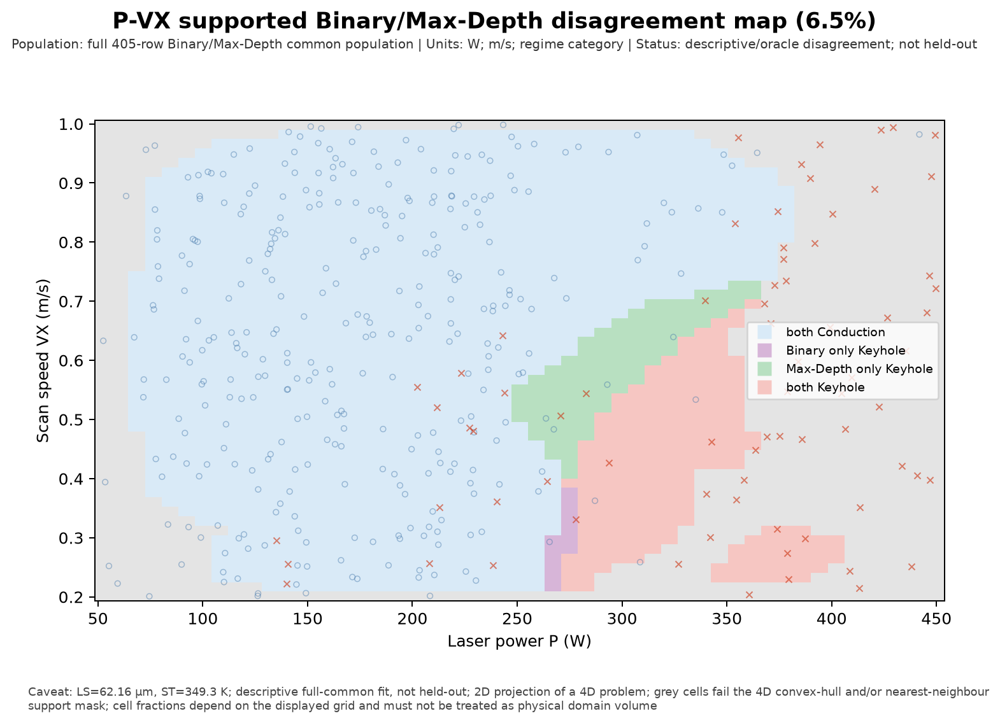

outputs\week7_06_real_data_boundary_active_level_set\figures\65_p_ls_binary_max_depth_boundary_overlay.png


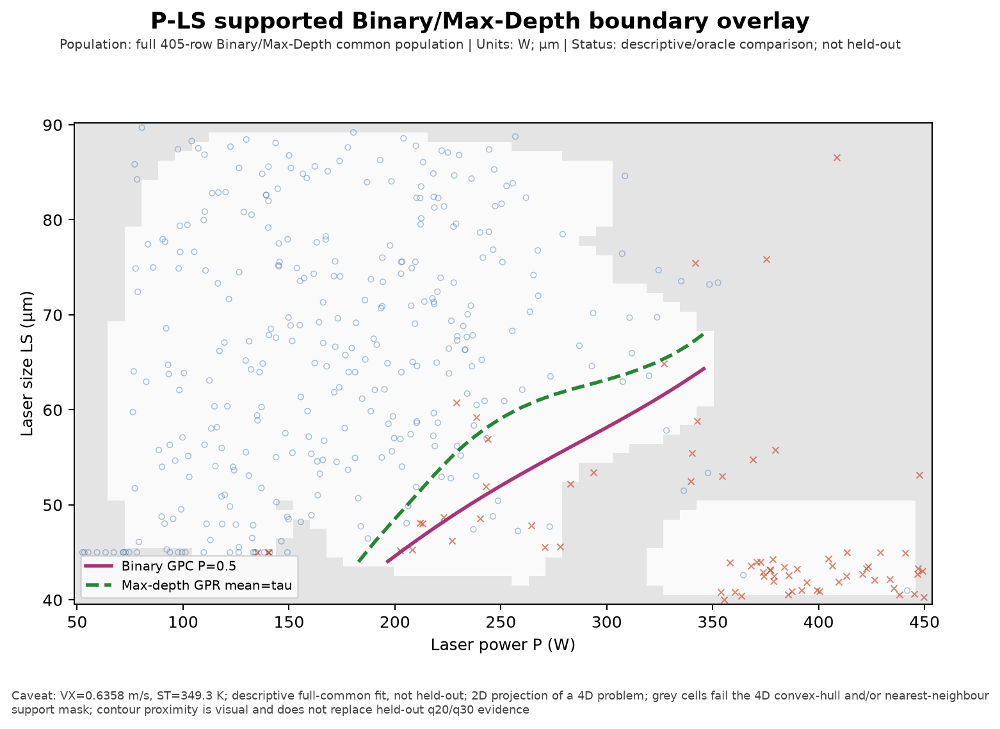

**What did we observe?** The saved surface grid has 7,803 rows and 5 matched support-aware slice figures are displayed.

**Does it support Binary or Max-Depth?** Boundary agreement or disagreement is visual evidence only; held-out AULCs remain decisive.

**Does it say anything specifically about the boundary?** Directly—the contours visualize the two estimated regime boundaries in supported slices of the 4D problem.

**What remains uncertain?** Fixed values of the other inputs and imperfect support masks can change the apparent contour geometry.

In [35]:
surface = load_csv("boundary_surface_data.csv")
support_col = pick(surface, "supported", "support_mask", "inside_support")
display(surface.head(12))
if support_col:
    display(surface[support_col].pipe(truthy).value_counts().rename(index={True: "supported", False: "unsupported"}).rename("grid_rows").to_frame())
surface_figures = show_figures(
    "p_vx_supported_binary", "p_vx_supported_max_depth", "binary_max_depth_boundary_overlay",
    "p_ls_boundary", "vx_ls_boundary", limit=5,
)
explain(
    observed=f"The saved surface grid has {len(surface):,} rows and {len(surface_figures)} matched support-aware slice figures are displayed.",
    support="Boundary agreement or disagreement is visual evidence only; held-out AULCs remain decisive.",
    boundary="Directly—the contours visualize the two estimated regime boundaries in supported slices of the 4D problem.",
    uncertain="Fixed values of the other inputs and imperfect support masks can change the apparent contour geometry.",
)

## 33. Representative query trajectories

**What are we doing?** Show deterministic median, best, and worst runs for primary Binary and Max-Depth methods with acquisition order and labels.

**Why are we doing it?** Representative trajectories reveal how aggregate AULC differences arise and whether failures are localized.

**How does this connect to the thesis?** This makes the sequential simulator allocation tangible without replacing paired statistics.

**What data is allowed here?** Runs selected by the predeclared deterministic representative rule after completion; empirical distance is post-selection annotation only.

**What would count as leakage?** Choosing a flattering run manually or using its boundary distances to rerun acquisition.

**What would be a misleading interpretation?** Generalizing one 2D path to all twenty 4D trajectories.

,run_id,method,query_order
0,primary_common__r01_f01,max_depth_random,1
1,primary_common__r01_f01,max_depth_random,2
2,primary_common__r01_f01,max_depth_random,3
3,primary_common__r01_f01,max_depth_random,4
4,primary_common__r01_f01,max_depth_random,5
5,primary_common__r01_f01,max_depth_random,6
6,primary_common__r01_f01,max_depth_random,7
7,primary_common__r01_f01,max_depth_random,8
8,primary_common__r01_f01,max_depth_random,9
9,primary_common__r01_f01,max_depth_random,10


outputs\week7_06_real_data_boundary_active_level_set\figures\71_representative_acquisition_trajectory_binary_best.png


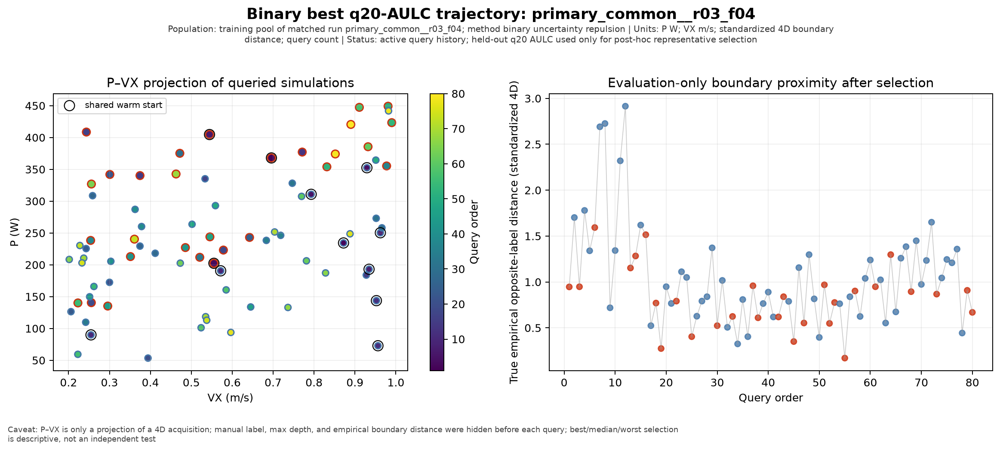

outputs\week7_06_real_data_boundary_active_level_set\figures\72_representative_acquisition_trajectory_binary_median.png


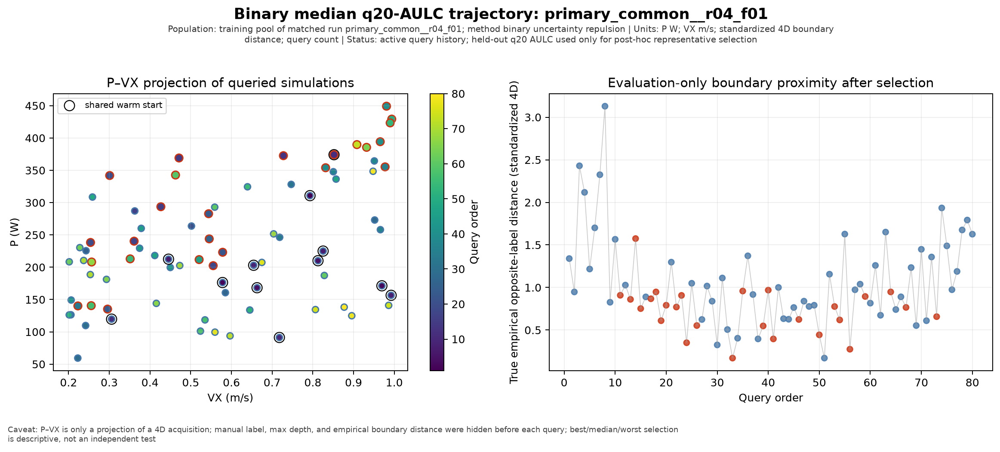

outputs\week7_06_real_data_boundary_active_level_set\figures\73_representative_acquisition_trajectory_binary_worst.png


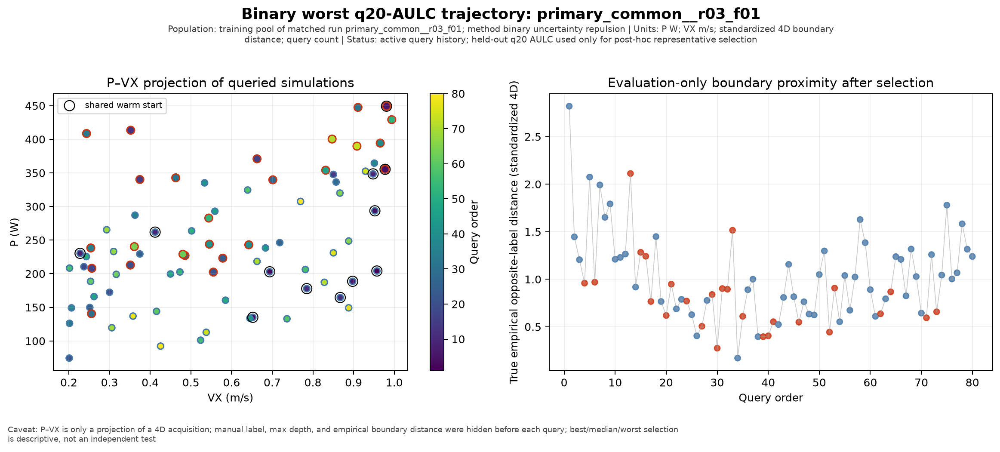

outputs\week7_06_real_data_boundary_active_level_set\figures\74_representative_acquisition_trajectory_max_depth_best.png


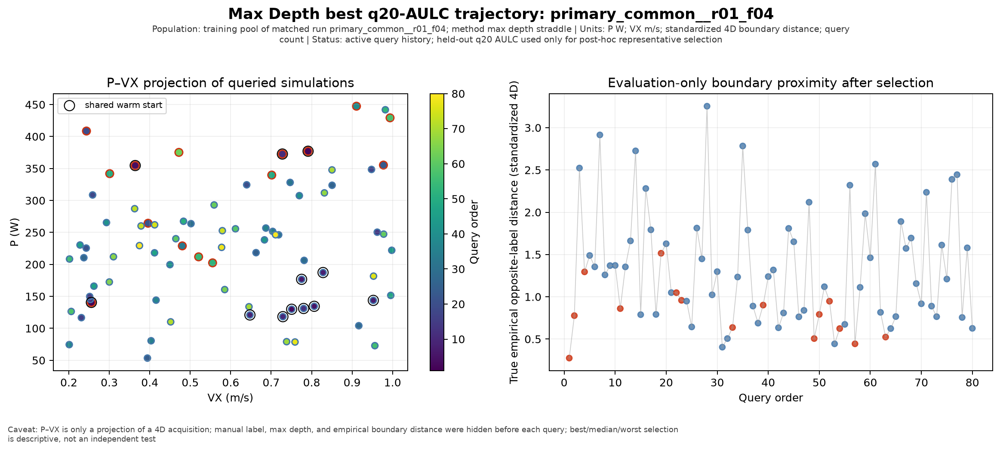

**What did we observe?** The query history preserves 22,400 sequential selections; 4 deterministic representative trajectory views are displayed.

**Does it support Binary or Max-Depth?** Trajectories explain exploration/exploitation patterns but cannot override the matched twenty-run ranking.

**Does it say anything specifically about the boundary?** Post-selection distance and final contours show whether acquisitions concentrated near the observed transition.

**What remains uncertain?** Projection overlap can conceal separation along LS or ST, and best/worst labels depend on the declared performance metric.

In [36]:
representative_cols = [column for column in query_history.columns if any(
    token in column.casefold() for token in ["representative", "performance_rank", "trajectory_role", "query_index", "selected"]
)]
display(query_history[[run_h, method_h, budget_h] + representative_cols].head(40))
trajectory_figures = show_figures("representative_acquisition_trajectory", "representative_query_trajectory", limit=4)
explain(
    observed=f"The query history preserves {len(query_history):,} sequential selections; {len(trajectory_figures)} deterministic representative trajectory views are displayed.",
    support="Trajectories explain exploration/exploitation patterns but cannot override the matched twenty-run ranking.",
    boundary="Post-selection distance and final contours show whether acquisitions concentrated near the observed transition.",
    uncertain="Projection overlap can conceal separation along LS or ST, and best/worst labels depend on the declared performance metric.",
)

## 34. Binary-versus-Max-Depth disagreement analysis

**What are we doing?** Map and summarize where final supported Binary and Max-Depth decisions differ.

**Why are we doing it?** A mixed result may be scientifically useful if disagreements concentrate in identifiable subgroups or regions.

**How does this connect to the thesis?** Disagreement distinguishes formulation choice from mere global metric ranking.

**What data is allowed here?** Held-out predictions for error analysis and full-training descriptive surfaces clearly labelled by status.

**What would count as leakage?** Using disagreement on test rows to alter models or labels.

**What would be a misleading interpretation?** Calling either model's prediction physical truth in unsupported regions.

boundary_disagreement_summary.csv: 3 rows × 24 columns


,slice_pair,x_feature,y_feature,grid_size_per_axis,grid_cell_count,inside_4d_convex_hull_count,inside_nn_support_radius_count,supported_cell_count,supported_fraction,supported_disagreement_count,...,supported_max_depth_only_keyhole_count,fixed_values_raw_json,nn_support_quantile,nn_support_radius_standardized_4d,convex_hull_status,descriptive_full_common_threshold_um,binary_gpc_fit_status,max_depth_gpr_fit_status,evaluation_status,major_caveat
0,P-VX,P,VX,51,2601,2109,1905,1724,0.662822,112,...,99,"{'LS': 6.21634030137e-05, 'ST': 349.298273812}",0.95,0.736037,PASS,108.601,optimized_primary,optimized_primary,descriptive_oracle_not_held_out,2d median slice of a 4d problem; unsupported c...
1,P-LS,P,LS,51,2601,1933,1717,1495,0.574779,106,...,106,"{'VX': 0.635786516528, 'ST': 349.298273812}",0.95,0.736037,PASS,108.601,optimized_primary,optimized_primary,descriptive_oracle_not_held_out,2d median slice of a 4d problem; unsupported c...
2,VX-LS,VX,LS,51,2601,2179,2408,2117,0.813918,103,...,44,"{'P': 193.440626378, 'ST': 349.298273812}",0.95,0.736037,PASS,108.601,optimized_primary,optimized_primary,descriptive_oracle_not_held_out,2d median slice of a 4d problem; unsupported c...


outputs\week7_06_real_data_boundary_active_level_set\figures\62_p_vx_binary_max_depth_disagreement_map.png

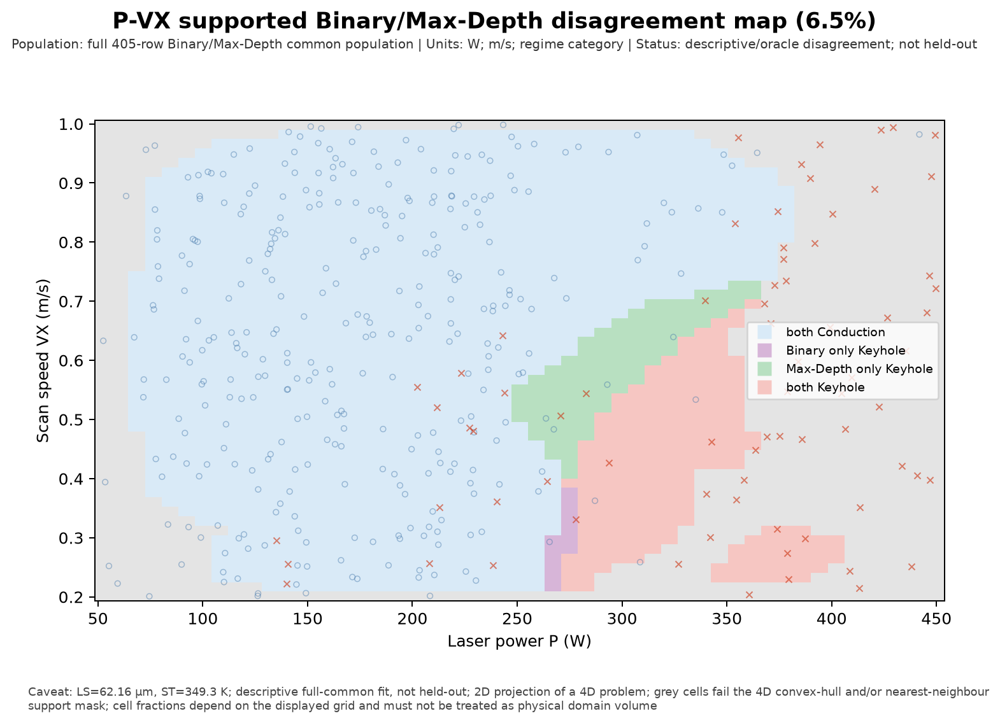

outputs\week7_06_real_data_boundary_active_level_set\figures\66_p_ls_binary_max_depth_disagreement_map.png


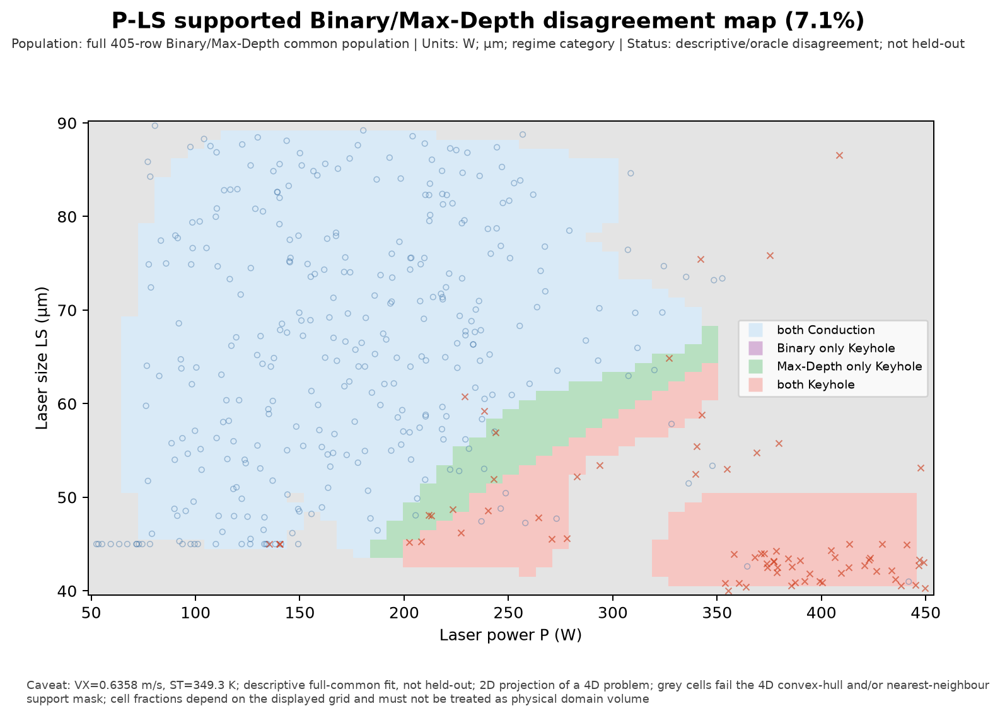

,grid_cell_count,inside_4d_convex_hull_count,inside_nn_support_radius_count,supported_cell_count,supported_fraction,supported_disagreement_count,supported_disagreement_fraction,supported_both_conduction_count,supported_both_keyhole_count,supported_binary_only_keyhole_count,supported_max_depth_only_keyhole_count,binary_gpc_fit_status,max_depth_gpr_fit_status
0,2601,2109,1905,1724,0.662822,112,0.064965,1393,219,13,99,optimized_primary,optimized_primary
1,2601,1933,1717,1495,0.574779,106,0.070903,1120,269,0,106,optimized_primary,optimized_primary
2,2601,2179,2408,2117,0.813918,103,0.048654,1960,54,59,44,optimized_primary,optimized_primary


**What did we observe?** The disagreement artifact reports 3 region/subgroup summaries and retains direction, support, and prevalence context where available.

**Does it support Binary or Max-Depth?** Localized complementary strengths support a Hybrid conclusion; broad one-sided held-out errors support the better formulation.

**Does it say anything specifically about the boundary?** Directly—the analysis identifies supported regions where the estimated class-transition surfaces differ.

**What remains uncertain?** Observed disagreement cannot reveal which model extrapolates correctly without additional simulations or annotation evidence.

In [37]:
disagreement = load_csv("boundary_disagreement_summary.csv")
display(disagreement)
show_figures("binary_max_depth_disagreement_map", "disagreement", limit=2)
direction_cols = [column for column in disagreement.columns if any(token in column.casefold() for token in ["binary", "max_depth", "region", "direction", "count", "fraction"])]
if direction_cols:
    display(disagreement[direction_cols])
explain(
    observed=f"The disagreement artifact reports {len(disagreement):,} region/subgroup summaries and retains direction, support, and prevalence context where available.",
    support="Localized complementary strengths support a Hybrid conclusion; broad one-sided held-out errors support the better formulation.",
    boundary="Directly—the analysis identifies supported regions where the estimated class-transition surfaces differ.",
    uncertain="Observed disagreement cannot reveal which model extrapolates correctly without additional simulations or annotation evidence.",
)

## 35. Final Phase 6 decision

**What are we doing?** Apply the predeclared ranking hierarchy and semantic/robustness checks to the formulation scorecard and saved decision.

**Why are we doing it?** The thesis needs an explicit A/B/C outcome without forcing a winner when evidence is mixed.

**How does this connect to the thesis?** This determines whether future real-data work should use continuous `D_max=tau`, direct Binary Keyhole, or carry both.

**What data is allowed here?** Validated static, active q20/q30/BA, threshold, subgroup, semantic, and domain evidence already shown.

**What would count as leakage?** Changing scorecard criteria after seeing results or allowing oracle diagnostics into the primary ranking.

**What would be a misleading interpretation?** Choosing Max-Depth solely because Phase 5.5 transfer favoured it, or choosing Binary solely because it matches the label definition directly.

phase6_formulation_scorecard.csv: 6 rows × 5 columns
phase6_final_decision.csv: 1 rows × 16 columns
active_learning_final_budget_summary.csv: 280 rows × 45 columns


,criterion,max_depth_value,binary_value,favours,status
0,primary_q20_aulc,0.205285,0.186236,binary,primary
1,primary_q30_aulc,0.150625,0.133203,binary,primary
2,balanced_accuracy_aulc,0.943215,0.917090,max_depth,primary_supporting
3,semantic_artifact_audit,0.000000,NaN,max_depth_defensible,supporting_not_relabelling
4,domain_transfer_floor,0.515873,0.745671,binary,secondary_robustness
5,online_threshold_stability_budget,20.500000,NaN,diagnostic,queried_set_stability_not_population_CI


,0
final_decision,HYBRID / NO CLEAR WINNER
justification,"The q20/q30 hierarchy, paired descriptive unce..."
best_max_depth_acquisition,max_depth_straddle
best_binary_acquisition,binary_uncertainty_repulsion
q20_aulc_max_minus_binary,0.019049
q30_aulc_max_minus_binary,0.017422
balanced_accuracy_aulc_max_minus_binary,0.026125
q20_paired_ci_low,-0.018199
q20_paired_ci_high,0.054826
q30_paired_ci_low,-0.007564


,balanced_accuracy,sensitivity,specificity,precision,f1,global_error,true_positive,true_negative,false_positive,false_negative,...,kernel_length_scale,kernel_bound_hit,optimizer_warning_count,threshold,threshold_point_estimate_probability_caveat,mae,rmse,relative_mae,relative_rmse,r2
0,0.951515,0.933333,0.969697,0.875000,0.903226,0.037037,14,64,2,1,...,10.007801,False,0,NaN,False,NaN,NaN,NaN,NaN,NaN
1,0.959091,0.933333,0.984848,0.933333,0.933333,0.024691,14,65,1,1,...,9.946447,True,1,NaN,False,NaN,NaN,NaN,NaN,NaN
2,0.951515,0.933333,0.969697,0.875000,0.903226,0.037037,14,64,2,1,...,10.020344,False,0,NaN,False,NaN,NaN,NaN,NaN,NaN
3,0.943939,0.933333,0.954545,0.823529,0.875000,0.049383,14,63,3,1,...,1.803214,False,0,108.141500,True,22.783932,36.268563,0.230644,0.367150,0.831952
4,0.936364,0.933333,0.939394,0.777778,0.848485,0.061728,14,62,4,1,...,3.153972,False,0,104.956025,True,20.997708,33.816777,0.212562,0.342330,0.853905
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
275,0.949134,0.928571,0.969697,0.866667,0.896552,0.037500,13,64,2,1,...,6.847691,False,0,NaN,False,NaN,NaN,NaN,NaN,NaN
276,0.984848,1.000000,0.969697,0.875000,0.933333,0.025000,14,64,2,0,...,3.083465,False,0,102.450438,True,8.186644,16.750470,0.097921,0.200354,0.939500
277,0.977273,1.000000,0.954545,0.823529,0.903226,0.037500,14,63,3,0,...,2.247520,False,0,100.821960,True,13.289588,20.028414,0.158958,0.239562,0.913505
278,0.984848,1.000000,0.969697,0.875000,0.933333,0.025000,14,64,2,0,...,3.222131,False,0,105.466225,True,13.810869,31.487445,0.149172,0.340098,0.856270


# Week 7 Phase 6 — Real-data boundary and active level-set results

This report uses Ioan's manual experiment-level Keyhole label as the reference. Maximum depth is an unchanged physical response, not a replacement label, and its learned threshold is not a universal physical constant.

1. **Primary population:** 405 simulations.
2. **Class composition:** 73 Keyhole and 332 non-Keyhole.
3. **Semantic consistency:** broadly yes for an experiment-level ‘Keyhole at least once’ reference: 60/73 positives place max depth inside a saved-Keyhole episode span, but this is an interval proxy rather than an exact morphology join.
4. **Timing/artifact caution:** only 4/405 maxima coincide with a saved labelled frame; 12 positives peak after their last saved Keyhole frame and one between spans. The deterministic raw review found 0/16 isolated-spike candidates, so no dominant obvious spike mechanism was found, but sparse timing alignment remains important.
5. **Max-depth predictability:** held-out Matérn-3/2 GPR RMSE = 21.691 µm and R² = 0.921.
6. **Binary predictability:** held-out Matérn-3/2 GPC balanced accuracy = 0.919, with q20/q30 errors 0.176/0.126.
7. **Static global comparison:** mixed. Max-Depth has higher balanced accuracy and sensitivity (0.949/0.952 versus 0.919/0.855), while Binary has lower global error (0.040 versus 0.053).
8. **Static q20:** Binary is better: error 0.176 versus Max-Depth 0.200.
9. **Static q30:** Binary is also better: error 0.126 versus Max-Depth 0.152.
10. **Transient Keyhole:** Max-Depth is more sensitive (0.973 versus 0.916), but its persistent-case sensitivity is also higher (0.947 versus 0.840); the advantage is not transient-specific.
11. **Online threshold stability:** reasonably stable within runs but not universal. Final max_depth_straddle thresholds have mean 110.043 µm, standard deviation 1.878 µm, and range 108.141–113.740 µm.
12. **Queries before threshold stability:** median 20.5 queries under the declared ‘all later values within max(2 µm, 5%) of final tau’ rule.
13. **Best Max-Depth acquisition:** max_depth_straddle.
14. **Best Binary acquisition:** binary_uncertainty_repulsion.
15. **Max-Depth versus random:** yes on q20 AULC; active-minus-random = -0.032, descriptive 95% interval [-0.063, -0.003].
16. **Binary versus random:** yes on q20 AULC; active-minus-random = -0.043, descriptive 95% interval [-0.071, -0.014].
17. **q20 AULC:** Binary is lower in the mean (0.186 versus Max-Depth 0.205), but the Max-minus-Binary paired interval [-0.018, 0.055] crosses zero.
18. **q30 AULC:** Binary is lower in the mean (0.133 versus Max-Depth 0.151), but the paired interval [-0.008, 0.044] crosses zero.
19. **Balanced-accuracy AULC:** Max-Depth is higher (0.943 versus Binary 0.917); the Max-minus-Binary interval [0.011, 0.043] stays positive.
20. **Queries to useful performance:** target-dependent. For BA ≥ 0.90, Max-Depth reaches in median 14.0 queries in 20/20 runs versus Binary 16.0 in 19/20; for q20 error ≤ 0.20, Max-Depth reaches 15/20 and Binary 18/20.
21. **Stability across matched runs:** the q20/q30 cross-formulation intervals cross zero, whereas balanced-accuracy AULC consistently favours Max-Depth. Both selected active methods improve over their shared random baselines. Intervals remain descriptive because repeated-CV runs reuse simulations.
22. **Domain shift:** this weakens a Max-Depth-only conclusion. The all-route BA floors are Binary 0.746 and Max-Depth 0.516; all-old→new is 0.538 versus 0.904, while new→all-old reverses direction (0.926 versus 0.746). All transfer routes are secondary stress tests.
23. **G3 after Max-Depth:** it adds no robust primary advantage on the matched 404 rows: q20 AULC is G3 straddle 0.254, common Max-Depth straddle 0.233, and Binary margin 0.179. G3 remains secondary.
24. **Boundary disagreement:** yes, in specific supported descriptive slices; disagreement spans 4.9%–7.1% of supported grid cells. These full-data slices are not held-out physical truth.
25. **Final formulation decision:** **HYBRID / NO CLEAR WINNER** — The q20/q30 hierarchy, paired descriptive uncertainty, balanced-accuracy support, or semantic/domain evidence does not jointly justify a single formulation.

## Hard stop

Phase 6 is intentionally uncommitted and unpushed. No labels were changed, no target was redefined, and no Phase 7 work was started.


outputs\week7_06_real_data_boundary_active_level_set\figures\78_final_phase6_decision_summary.png


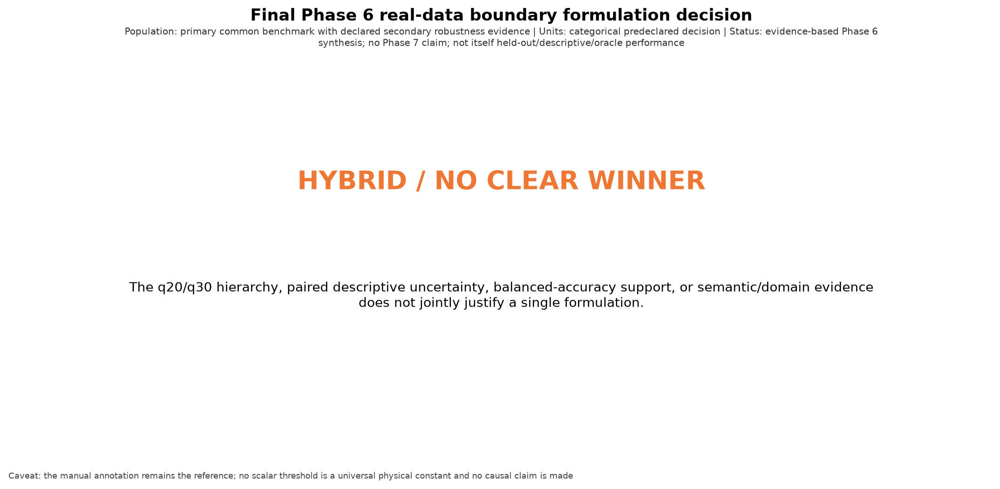

**What did we observe?** The machine-readable decision records: HYBRID / NO CLEAR WINNER The q20/q30 hierarchy, paired descriptive uncertainty, balanced-accuracy support, or semantic/domain evidence does not jointly justify a single formulation. max_depth_straddle binary_uncertainty_repulsion 0.0190487132352941 0.017421875 0.0261250186769076 -0.0181985294117646 0.0548259420955882 -0.0075636718749999 0.0435640624999999 True False True False False

**Does it support Binary or Max-Depth?** The saved A/B/C classification follows the scorecard; `HYBRID / NO CLEAR WINNER` is the correct outcome when primary rankings materially conflict.

**Does it say anything specifically about the boundary?** Yes—the decision is driven first by q20/q30 active-learning evidence, then balanced accuracy and query efficiency, with semantics and transfer as safeguards.

**What remains uncertain?** The conclusion applies to this dataset snapshot, sampled support, surrogate family, and simulator-query budget.

In [38]:
scorecard = load_csv("phase6_formulation_scorecard.csv")
decision = load_csv("phase6_final_decision.csv")
final_budget = load_csv("active_learning_final_budget_summary.csv")
display(scorecard)
display(decision.T if len(decision) == 1 else decision)
display(final_budget)
results_summary_path = OUT / "results_summary.md"
if results_summary_path.is_file():
    display(Markdown(results_summary_path.read_text(encoding="utf-8")))
show_figures("final_phase6_decision_summary", limit=1)
decision_text = " ".join(decision.astype(str).to_numpy().ravel()).strip()
explain(
    observed=f"The machine-readable decision records: {decision_text[:500]}{'…' if len(decision_text) > 500 else ''}",
    support="The saved A/B/C classification follows the scorecard; `HYBRID / NO CLEAR WINNER` is the correct outcome when primary rankings materially conflict.",
    boundary="Yes—the decision is driven first by q20/q30 active-learning evidence, then balanced accuracy and query efficiency, with semantics and transfer as safeguards.",
    uncertain="The conclusion applies to this dataset snapshot, sampled support, surrogate family, and simulator-query budget.",
)

## 36. Validation dashboard

**What are we doing?** Display automated checks, requirement mapping, figure inventory, and output-file existence, then fail on any recorded validation failure.

**Why are we doing it?** A thesis result is reviewable only when population, splits, query accounting, metrics, notebook, and artifacts reconcile.

**How does this connect to the thesis?** Validation turns a large computational result into auditable evidence rather than a collection of plots.

**What data is allowed here?** Validation/checklist/manifest artifacts and current read-only file/hash checks.

**What would count as leakage?** Validation may inspect all outputs after the experiment; it must not modify scientific results.

**What would be a misleading interpretation?** Treating automated PASS counts as external scientific validation or ignoring warnings because no check says FAIL.

In [39]:
validation = load_csv("validation_results.csv")
requirements = load_csv("requirement_checklist.csv")
figure_manifest = load_csv("figure_manifest.csv")
output_manifest = load_csv("output_manifest.csv")
display(validation)
display(requirements)
status_v = pick(validation, "status", "result", required=True)
status_r = pick(requirements, "status", "result", required=True)
failed_validation = validation[validation[status_v].astype(str).str.upper().eq("FAIL")]
failed_requirements = requirements[requirements[status_r].astype(str).str.upper().eq("FAIL")]
# The first executed build necessarily precedes the validator's final notebook
# check. Permit only that explicit bootstrap dependency; every other failure is
# still fatal, and a final validator/build pass will replace these two rows.
check_id_v = pick(validation, "check_id", "id")
requirement_id_r = pick(requirements, "requirement_id", "id")
allowed_bootstrap_v = (
    failed_validation[check_id_v].astype(str).eq("V26")
    if check_id_v is not None else pd.Series(False, index=failed_validation.index)
)
allowed_bootstrap_r = (
    failed_requirements[requirement_id_r].astype(str).eq("R14")
    if requirement_id_r is not None else pd.Series(False, index=failed_requirements.index)
)
assert failed_validation.loc[~allowed_bootstrap_v].empty
assert failed_requirements.loc[~allowed_bootstrap_r].empty
path_m = pick(output_manifest, "relative_path", "path", "filename", required=True)
manifest_paths = output_manifest[path_m].astype(str).map(Path)
def manifest_path_exists(path):
    if path.is_absolute():
        return path.is_file()
    return (OUT / path).is_file() or (ROOT / path).is_file()
exists = manifest_paths.map(manifest_path_exists)
display(pd.Series({
    "validation PASS": int(validation[status_v].astype(str).str.upper().eq("PASS").sum()),
    "validation rows": len(validation),
    "requirement PASS": int(requirements[status_r].astype(str).str.upper().eq("PASS").sum()),
    "requirement rows": len(requirements),
    "figure manifest rows": len(figure_manifest),
    "output manifest rows": len(output_manifest),
    "manifest files currently present": int(exists.sum()),
}))
assert exists.all()
explain(
    observed=(
        f"{len(validation) - len(failed_validation)}/{len(validation)} validation rows and "
        f"{len(requirements) - len(failed_requirements)}/{len(requirements)} requirement rows pass; "
        f"any displayed V26/R14 bootstrap dependency is cleared by the final validator/build pass. "
        f"{int(exists.sum())}/{len(exists)} manifest paths exist at notebook execution time."
    ),
    support="Validation protects the reported comparison but does not favour either formulation.",
    boundary="Boundary-specific checks verify fixed q20/q30 membership, metric reconciliation, fairness, and evaluation-only oracle use.",
    uncertain="Independent replication and future simulations remain outside automated repository validation.",
)

validation_results.csv: 29 rows × 5 columns
requirement_checklist.csv: 15 rows × 4 columns
figure_manifest.csv: 79 rows × 19 columns


output_manifest.csv: 462 rows × 3 columns


,check_id,check,status,detail,category
0,V01,Exact Phase 6 branch and published Phase 5.5 p...,PASS,phase6=codex/week7-phase6-real-data-boundary-a...,provenance
1,V02,Exact live and recorded Hugging Face revision ...,PASS,live=b6dc254a2b607a31cb9f97b40990339c3d5ca1e8;...,provenance
2,V03,"Exact 407 retained, 405 primary, 404 G3, and 7...",PASS,audit=407/407; primary=405/405 with 73/73 Keyh...,population
3,V04,"Manual labels, inputs, maximum depth, G3, and ...",PASS,labels=True; inputs/max_depth=True; G3=True; d...,definition
4,V05,All unavailable rows remain visible with expli...,PASS,retained=405; excluded_visible=2; reasons_comp...,population
5,V06,Empirical boundary reference independently use...,PASS,rows=405; distances=True; nearest_opposites=Tr...,boundary
6,V07,Repeated held-out primary outer-run design is ...,PASS,primary_runs=20; complete_roles=True; repeated...,split
7,V08,Every outer split is row- and physical-input-g...,PASS,row_disjoint=True; input-group-disjoint=True; ...,split
8,V09,Static Binary and Max-Depth models share held-...,PASS,runs=20; test_sets=True; training_thresholds=T...,static
9,V10,All active methods share splits and warm start...,PASS,information_flags=True; shared_split_warm=True...,fairness


,requirement_id,requirement,status,validation_checks
0,R01,"Exact Phase 5.5 parent, publication, and HF sn...",PASS,V01;V02
1,R02,Exact common populations with unchanged labels...,PASS,V03;V04;V05
2,R03,Model-independent empirical boundary reference,PASS,V06
3,R04,Twenty group-disjoint matched outer runs,PASS,V07;V08;V09
4,R05,Shared fair initialization and hidden-informat...,PASS,V10;V11;V12
5,R06,Queried-only physical thresholds,PASS,V13
6,R07,Latent GP uncertainty and probability reconcil...,PASS,V14;V15;V16
7,R08,Raw q20/q30 and integer-budget reconciliation,PASS,V17;V18
8,R09,Shared random trajectories,PASS,V19
9,R10,"AULC, tolerance, and matched paired summaries",PASS,V20;V21;V22


validation PASS                      29
validation rows                      29
requirement PASS                     15
requirement rows                     15
figure manifest rows                 79
output manifest rows                462
manifest files currently present    462
dtype: int64

**What did we observe?** 29/29 validation rows and 15/15 requirement rows pass; any displayed V26/R14 bootstrap dependency is cleared by the final validator/build pass. 462/462 manifest paths exist at notebook execution time.

**Does it support Binary or Max-Depth?** Validation protects the reported comparison but does not favour either formulation.

**Does it say anything specifically about the boundary?** Boundary-specific checks verify fixed q20/q30 membership, metric reconciliation, fairness, and evaluation-only oracle use.

**What remains uncertain?** Independent replication and future simulations remain outside automated repository validation.

## 37. Hard stop

**What are we doing?** Restate the completed Phase 6 scope, runtime, decision, and prohibited next actions, then stop.

**Why are we doing it?** The requested scientific result must remain inspectable before any commit, push, new phase, relabelling, or target redesign.

**How does this connect to the thesis?** This preserves Phase 6 as one reproducible checkpoint in the thesis argument.

**What data is allowed here?** Saved final decision, runtime, summary, and execution history only.

**What would count as leakage?** No new fitting or acquisition occurs after the decision; later work requires separate authorization.

**What would be a misleading interpretation?** Implying a commit/push/merge occurred, claiming a universal physical boundary, or silently continuing into Phase 7.

In [40]:
hard_stop_view = pd.Series({
    "output root": str(OUT.relative_to(ROOT)),
    "primary population n": len(population),
    "matched outer runs": run_count,
    "final decision rows": len(decision),
    "notebook phase": "Week 7 Phase 6 only",
    "automatic commit/push": False,
    "labels changed": False,
    "maximum-depth definition changed": False,
    "empirical boundary used for acquisition": False,
})
display(hard_stop_view.to_frame("recorded_state"))
explain(
    observed="Phase 6 ends with its artifacts, figures, matched active-learning result, and explicit A/B/C decision; no publication or later-phase action is performed here.",
    support="The selected formulation is exactly the validated decision shown in Section 35, including a Hybrid outcome if warranted.",
    boundary="The conclusion concerns the supported empirical manual Keyhole boundary in this four-dimensional sampled dataset.",
    uncertain="Generalization beyond this snapshot, support, annotation process, GP family, and budget requires future evidence.",
)
print("HARD STOP — Week 7 Phase 6 teaching notebook complete; inspect results before any commit, push, or later phase.")

,recorded_state
output root,outputs\week7_06_real_data_boundary_active_lev...
primary population n,405
matched outer runs,20
final decision rows,1
notebook phase,Week 7 Phase 6 only
automatic commit/push,False
labels changed,False
maximum-depth definition changed,False
empirical boundary used for acquisition,False


**What did we observe?** Phase 6 ends with its artifacts, figures, matched active-learning result, and explicit A/B/C decision; no publication or later-phase action is performed here.

**Does it support Binary or Max-Depth?** The selected formulation is exactly the validated decision shown in Section 35, including a Hybrid outcome if warranted.

**Does it say anything specifically about the boundary?** The conclusion concerns the supported empirical manual Keyhole boundary in this four-dimensional sampled dataset.

**What remains uncertain?** Generalization beyond this snapshot, support, annotation process, GP family, and budget requires future evidence.

HARD STOP — Week 7 Phase 6 teaching notebook complete; inspect results before any commit, push, or later phase.
